In [16]:
!ls
#https://ibb.co/HhyX9Yq
#!module load tensorflow=1.15.0

Desktop    GAN.jpg	       Pictures   Videos       mnist
Documents  GAN_tutorial.ipynb  Public	  __pycache__  ondemand
Downloads  Music	       Templates  foo.py


Introduction
------------

This tutorial is aimed at giving a thorough explanation of Generative Adversarial Network (GAN). First, we will understand the basic components of GAN through example where we try to generate images from random noise that looks like images from specific context. Then, we will try to design a GAN model that can generate high resolution images from low resolution images. 

??The first portion of the tutorial is mostly taken from  with some detailed explanation added. (add medium link??)

In order to go through this tutorial, some basic understanding of how deep learning will be useful. Also, it would help to have a GPU. Let us begin: 

Generative Adversarial Networks
-------------------------------

What is a GAN?

GANs are a framework for teaching a DL model to capture the training data’s distribution so we can generate new data from that same distribution. GANs were invented by Ian Goodfellow in 2014 and first described in the paper 'Generative Adversarial Nets <https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf>'.

GAN belongs to the set of algorithms named *Generative models*. These algorithms belong to the *Unsupervised Learning* class, which is a paradigm of ML where the model tries to learn the underlying structure of the input data without any available ground truth. So, given input data $x$, these algorithms try to learn the distribution function of the input data $p(x)$. This also allows them to generate new instances of inputs. In contrast, in *Supervised learning*, the model tries to learn the mapping function $y' = f(x)$, where the ground truth $y$ corresponding to input $x$ is available. However, these kind of models are not allowed to generate synthetic inputs.

The basic structure of a GAN is as follows: ![](GAN.jpg)

There are two main components in a GAN:

1) *Generator* **G**: This is a model that tries to generate new data similar to the real samples. It can be thought of as similar to a human art forger who tries to forge real artworks to fake ones and tries to sell them.

2) *Discriminator* **D**: This is a model that tries to classify the input data to whether it is real or fake. More specifically, given an input data, it tries to determine whether the data is from the real samples or whether the data is generated by **G**. It can be thought of similar to a human expert who can distinguish between real artworks and artworks faked by the forger. 

During training, **G** is continuously try to fool the discriminator by generating better and better fakes, while **D** tries to become a better detective and correctly classify the real and fake samples. The training reaches its saturation level when **G** is generating perfect
fakes those look as if they came directly from the real sample, and **D** is left to always guess at 50% confidence that the generator output is real or fake.

Mathematical Modeling
----------------------

Let us define some notations for GAN which will be used throughout the tutorial.

Let $z$ be a latent space vector (which we will probably generate using some kind of distribution). 

Let $x$ represent the real input space which is visible only to **D**.


**Notations for G**:


Let $G(z,\theta_1)$ represent the model which is used as the Generator. Here, $\theta_1$ represents the set of parameters associated with **G**. For example, if **G** is a feed forward neural network, then **\theta_1** is the weights associated with its layers.

So, given the latent space $z$, the generator performs a mapping $G(z)$ using the parameters $\theta_1$, which is used as the fake samples.

**Notations for D**:

Let $D(y,\theta_2)$ represent the model which is used as the Discriminator. Similar to **G**, here, $\theta_2$ represents the set of parameters associated with **D**. 

Given any input $y$, the discriminator performs a mapping $D(y)$ using the parameters $\theta_2$. Here, $D(y) \in (0,1)$. More specifically, given an input $y$, $D(y)$ is the probability of $y$ sampled from input space $x$. This means that given a sample, **D** tries to determine whether the sample is originated from real input space $x$ or from generator **G**.

**Altogether**:

Given an input $y$, $D(y)$ should be HIGH when $y$ is sampled from the real input space $x$ and $D(y)$ should be low when $y$ is generated from **G**.

Therefore, the goal of **D** is to maximize $D(x)$ and minimize $D(G(z))$. Or, we can say that, the goal of **D** is to maximize both $D(x)$ and $1-D(G(z))$.

Whereas, the goal of **G** is to generate such fake samples $G(z)$ so that $1-D(G(z))$ is minimized. 

So, we can see that **D** and **G** is playing a minimax game here. In Goodfellow's paper, the loss function of this game is defined as:

\begin{align}\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]\end{align}

where $p_{data}(x)$ is the distribution of real training dataset $x$ and $p_{z}(z)$ is the distribution of the latent space.

In theory, the solution to this minimax game is reached when $p_{data} = p_z$ and the discriminator guesses randomly if the inputs are real or fake. However, the convergence theory of GANs is still being actively researched and in reality models do not always train to this point.

Now that we have a basic understanding of how GAN works, let us get into the coding part. We will first import the dependencies that we will need.

In [39]:
from __future__ import print_function
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets
import numpy as np
import matplotlib.pyplot as plt

from foo import Logger

The last package is a logger class designed by 'Diego Gomez' <https://github.com/diegoalejogm>. This will help us visualize some things that has happened during training the GAN.

**Dataset**:

For the dataset, we will be using MNIST dataset(cite MNIST here??). MNIST training dataset consists of 60,000 black and white images of handwritten digits. The images are of size $28 \times 28$. We will load this data with some preprocessing. To be specific, the image pixels have values from 0 to 255. However, we will be normalizing them.

First we download the dataset to a folder of our current directory.

In [40]:
mnist_trainset = datasets.MNIST(root='./mnist', train=True, download=True, transform=None)
print(mnist_trainset)


Dataset MNIST
    Number of datapoints: 60000
    Root location: ./mnist
    Split: Train


We can see that it says that there are a total of 60000 datapoints. Next, we apply normalization over it using a transformation function. We also create a dataloader for the dataset so that we can later iterate through the Dataset. Although, there was no need for the Resize transformation regarding the image size, it demonstraes how would you maybe want to resize the images to a different size.

In [52]:
image_size = 28

def get_transformed_data():
    data_dir = './mnist'
    transform=transforms.Compose([
       #transforms.Resize(image_size),
       #transforms.CenterCrop(image_size),
       transforms.ToTensor(),
       transforms.Normalize((0.5,), (0.5,))
    ])
    return datasets.MNIST(root=data_dir, train=True, transform = transform, download=False)

data = get_transformed_data()# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)
print(num_batches)

600


Next, we define the models of the GAN. 

**Discriminator D**:

The job of the discriminator was to take input and return the probability of the image being generated from the real dataset. In this case, the Discriminator will take an input image of the same dimension as the dataset in MNIST and output the probability whether the image belongs to the dataset we have defined just now or whether it belongs to a different domain.

So, first things first, the input layer of the Discriminator will have a size of ($28 \times 28 \times 1$) = $784$.

Regarding the overall structure of the rest of the network, it will have three linear layers. Each linear layer will have a ReLU non-linearity activation function associated with it. The last layer has a SigMoid activation function that will generate an output within range (0,1).


In [42]:
class Discriminator(torch.nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        n_in = 784
        n_hidden_size_1 = 1024
        n_hidden_size_2 = 512
        n_out = 1
        
        self.inputLayer = nn.Sequential( 
            nn.Linear(n_in, n_hidden_size_1),
            nn.ReLU(inplace=True)
        )
        self.midLayer = nn.Sequential(
            nn.Linear(n_hidden_size_1, n_hidden_size_2),
            nn.ReLU(inplace=True)
        )
        self.outLayer = nn.Sequential(
            nn.Linear(n_hidden_size_2, n_out),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.inputLayer(x)
        x = self.midLayer(x)
        x = self.outLayer(x)
        return x
    
D = Discriminator()

We have defined the network. Let us just feed it with some random dummy inputs to see whether it produces outputs as desired and everything is well.

In [43]:
mock_input_batch = torch.zeros(10, 784).normal_(0, 0.02)
D.eval()
mock_output = D.forward(mock_input_batch)
D.train()
print(mock_input_batch.shape)
print(mock_output.shape)
print(mock_output)

torch.Size([10, 784])
torch.Size([10, 1])
tensor([[0.4987],
        [0.4981],
        [0.4990],
        [0.4979],
        [0.4983],
        [0.4982],
        [0.4989],
        [0.4987],
        [0.4985],
        [0.4990]], grad_fn=<SigmoidBackward>)


So, we can see that after feeding the discriminator with a batch of inputs, it is mapping each sample in the map to a probabilistic value in the range (0,1). So, the network is working as desired.

**Generator G**:

Similar to Discriminator **D**, we will also design the generator network **G**. Remember that the output of **G** will be fed as the input to **D**. So, the output of the generator will be of size 784. It will also be useful for the Generator outputs to have values in the same range that we normalized the MNIST dataset into. 

The MNIST dataset had values in the range (0,1). The normalization function had a mean and std of 0.5 each. For each pixel of the image this transform performs the mapping of $pixel = (pixel - mean) / std$. So, the minimum value 0 is mapped to -1 and the maximum value 1 is mapped to +1. So, the MNIST images have a value range of $[-1,1]$. Therefore, in the generator function, we will use a tanH activation function in the last layer which also conveniently produces output in the range $[-1,1]$.

In [44]:
n_latent_size = 100

class Generator(torch.nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        n_in = n_latent_size
        n_hidden_size_1 = 256
        n_hidden_size_2 = 512
        n_out = 784
        
        self.inputLayer = nn.Sequential( 
            nn.Linear(n_in, n_hidden_size_1),
            nn.ReLU(inplace=True)
        )
        self.midLayer = nn.Sequential(
            nn.Linear(n_hidden_size_1, n_hidden_size_2),
            nn.ReLU(inplace=True)
        )
        self.outLayer = nn.Sequential(
            nn.Linear(n_hidden_size_2, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.inputLayer(x)
        x = self.midLayer(x)
        x = self.outLayer(x)
        return x
    
G = Generator()

mock_input_batch = torch.zeros(10, 100).normal_(0, 0.02)
G.eval()
mock_output = G.forward(mock_input_batch)
G.train()
print(mock_input_batch.shape)
print(mock_output.shape)
#print(mock_output)
print(torch.min(mock_output))
print(torch.max(mock_output))

torch.Size([10, 100])
torch.Size([10, 784])
tensor(-0.0883, grad_fn=<MinBackward1>)
tensor(0.0796, grad_fn=<MaxBackward1>)


Note that the value of *n_latent_size* has been chosen arbitrarily. It actually represents the size of the data that will be sampled from the latent space by the Generator. You can change this value to see how the Generator learns to mimic the real input space with different such values. 

Below, we define a function that will create this random sample from the latent space and the output of this function will be fed as the input to the Generator.

In [45]:
def get_latent_sample(size):
    n = Variable(torch.randn(size, n_latent_size))
    return n

def ones_target(size):
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    data = Variable(torch.zeros(size, 1))
    return data

def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [46]:
learning_rate = 3e-4
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate)
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate)

In [47]:
loss = nn.BCELoss()

In [60]:
def train_D(optimizer, real_sample, G_sample):
    N = real_sample.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # Train on Real Data
    real_score = D(real_sample)
    # Calculate error and backpropagate
    real_loss = loss(real_score, ones_target(N) )
    real_loss.backward()

    # Train on Fake Data
    fake_score = D(G_sample)
    # Calculate error and backpropagate
    fake_loss = loss(fake_score, zeros_target(N))
    fake_loss.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return real_loss + fake_loss, real_score, fake_score
#add some dummy test here

In [61]:
def train_G(optimizer, G_sample):
    N = G_sample.size(0)    
    
    # Reset gradients
    optimizer.zero_grad()    
    
    # Sample noise and generate fake data
    score = D(G_sample)    
    # Calculate error and backpropagate
    G_loss = loss(score, ones_target(N))
    G_loss.backward()    
    
    # Update weights with gradients
    optimizer.step()    
    
    # Return error
    return G_loss

In [62]:
num_test_samples = 16
test_noise = get_latent_sample(num_test_samples)

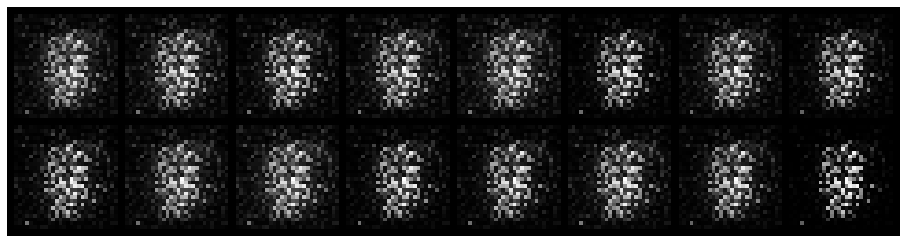

Epoch: [0/50], Batch Num: [0/600]
Discriminator Loss: 0.0468, Generator Loss: 5.9594
D(x): 0.9803, D(G(z)): 0.0207


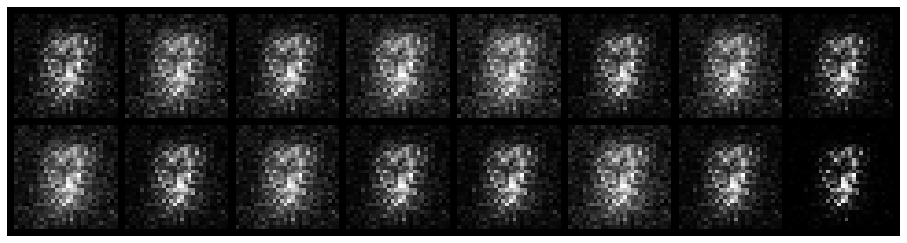

Epoch: [0/50], Batch Num: [100/600]
Discriminator Loss: 0.2181, Generator Loss: 3.6855
D(x): 0.9349, D(G(z)): 0.0849


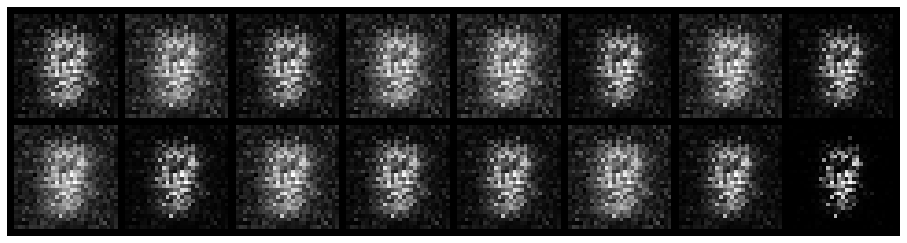

Epoch: [0/50], Batch Num: [200/600]
Discriminator Loss: 0.0350, Generator Loss: 4.1398
D(x): 0.9868, D(G(z)): 0.0191


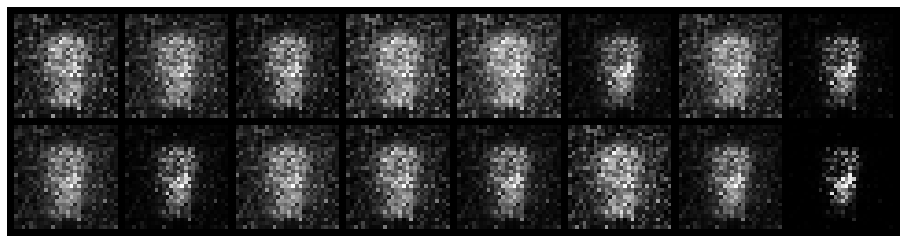

Epoch: [0/50], Batch Num: [300/600]
Discriminator Loss: 0.2709, Generator Loss: 3.9490
D(x): 0.9133, D(G(z)): 0.0668


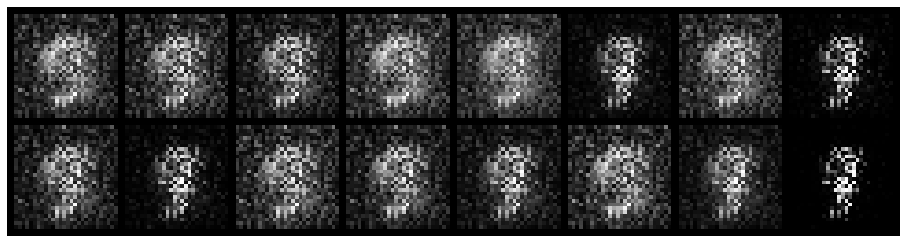

Epoch: [0/50], Batch Num: [400/600]
Discriminator Loss: 0.2188, Generator Loss: 4.3345
D(x): 0.9261, D(G(z)): 0.0305


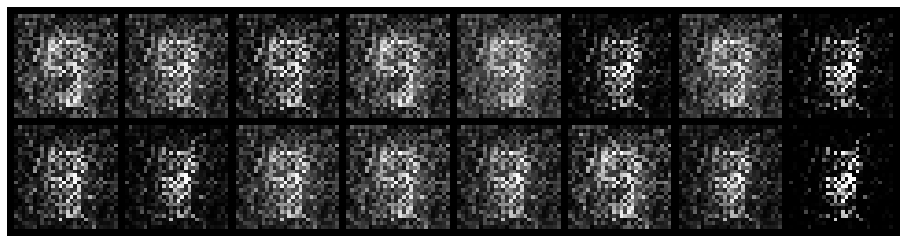

Epoch: [0/50], Batch Num: [500/600]
Discriminator Loss: 0.0900, Generator Loss: 8.0250
D(x): 0.9765, D(G(z)): 0.0121


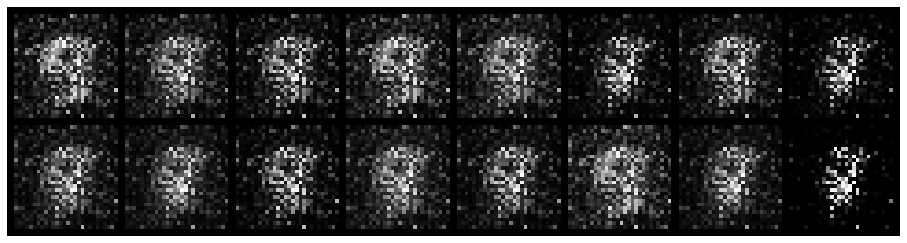

Epoch: [1/50], Batch Num: [0/600]
Discriminator Loss: 0.2240, Generator Loss: 7.3470
D(x): 0.9334, D(G(z)): 0.0378


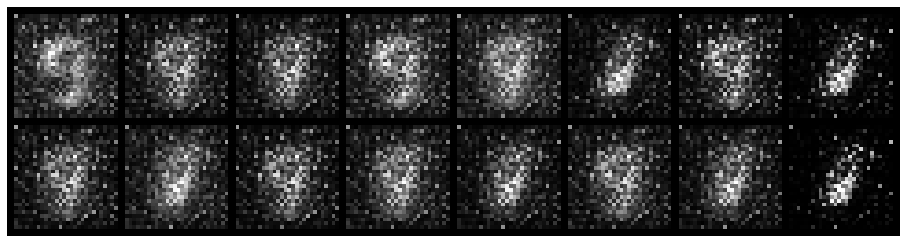

Epoch: [1/50], Batch Num: [100/600]
Discriminator Loss: 0.2123, Generator Loss: 4.1455
D(x): 0.9890, D(G(z)): 0.0885


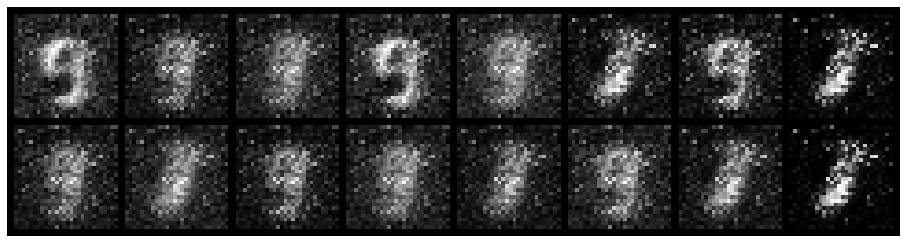

Epoch: [1/50], Batch Num: [200/600]
Discriminator Loss: 0.5589, Generator Loss: 4.5826
D(x): 0.8224, D(G(z)): 0.0445


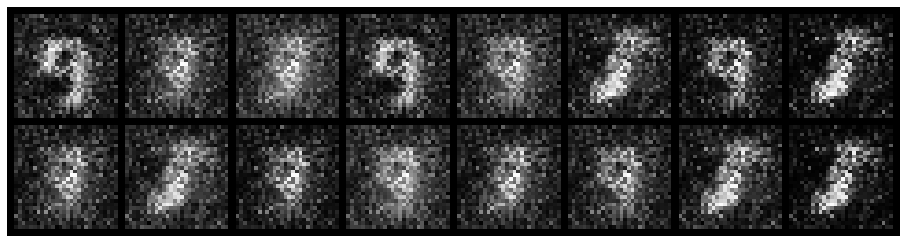

Epoch: [1/50], Batch Num: [300/600]
Discriminator Loss: 0.0140, Generator Loss: 6.3749
D(x): 0.9939, D(G(z)): 0.0071


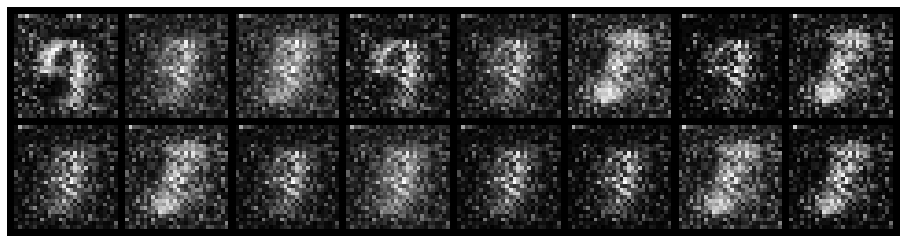

Epoch: [1/50], Batch Num: [400/600]
Discriminator Loss: 0.1021, Generator Loss: 4.0826
D(x): 0.9734, D(G(z)): 0.0468


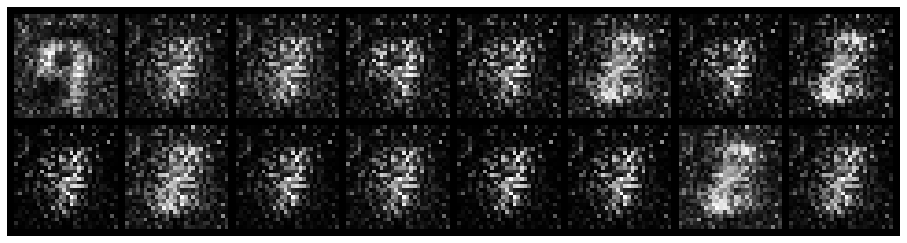

Epoch: [1/50], Batch Num: [500/600]
Discriminator Loss: 0.2915, Generator Loss: 7.2883
D(x): 0.9477, D(G(z)): 0.0493


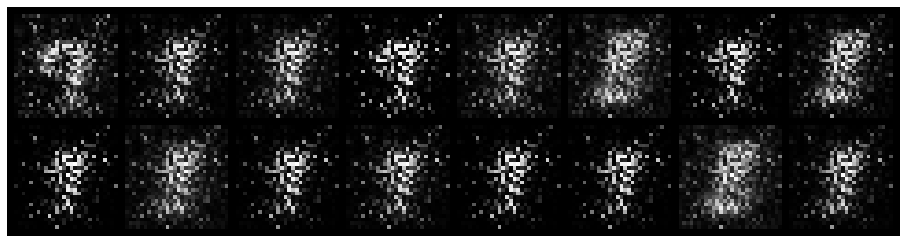

Epoch: [2/50], Batch Num: [0/600]
Discriminator Loss: 0.2470, Generator Loss: 9.2310
D(x): 0.9341, D(G(z)): 0.0110


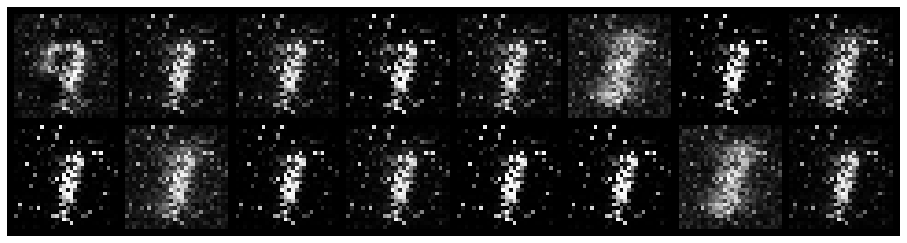

Epoch: [2/50], Batch Num: [100/600]
Discriminator Loss: 0.2749, Generator Loss: 6.7661
D(x): 0.9406, D(G(z)): 0.0460


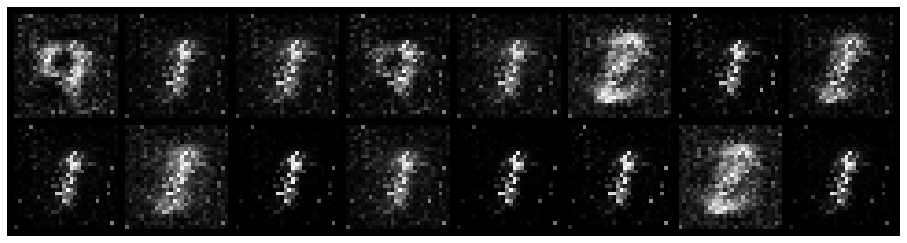

Epoch: [2/50], Batch Num: [200/600]
Discriminator Loss: 0.1493, Generator Loss: 5.0265
D(x): 0.9605, D(G(z)): 0.0659


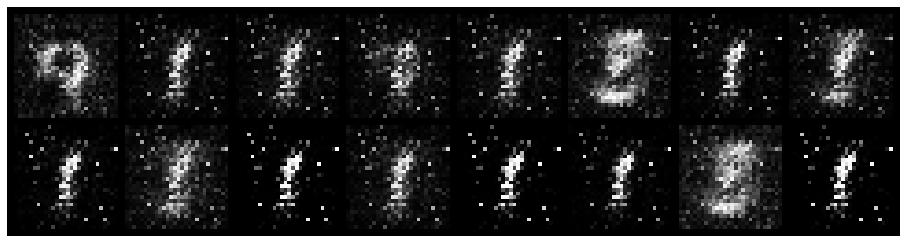

Epoch: [2/50], Batch Num: [300/600]
Discriminator Loss: 0.2996, Generator Loss: 5.5388
D(x): 0.9122, D(G(z)): 0.0457


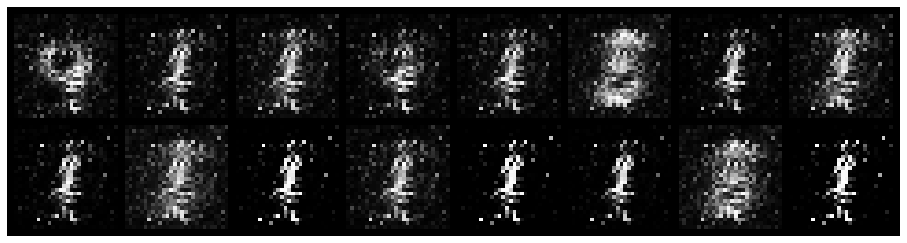

Epoch: [2/50], Batch Num: [400/600]
Discriminator Loss: 0.1866, Generator Loss: 7.1848
D(x): 0.9127, D(G(z)): 0.0103


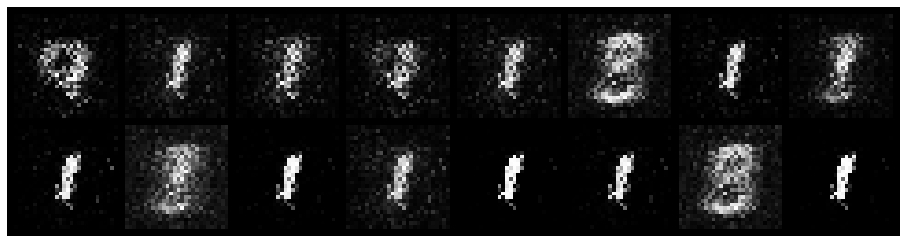

Epoch: [2/50], Batch Num: [500/600]
Discriminator Loss: 0.1398, Generator Loss: 7.7616
D(x): 0.9341, D(G(z)): 0.0050


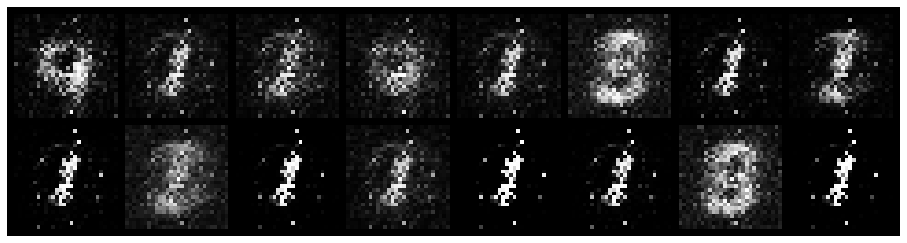

Epoch: [3/50], Batch Num: [0/600]
Discriminator Loss: 0.1595, Generator Loss: 7.9185
D(x): 0.9493, D(G(z)): 0.0391


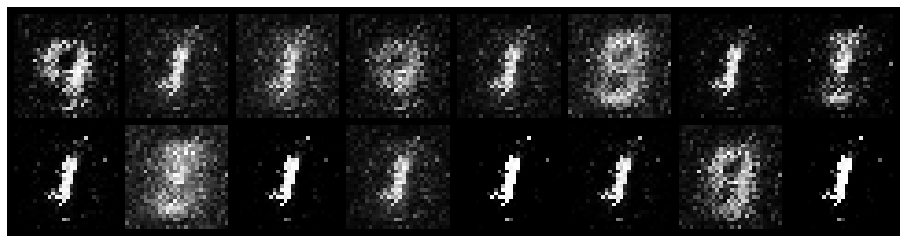

Epoch: [3/50], Batch Num: [100/600]
Discriminator Loss: 0.1689, Generator Loss: 5.1101
D(x): 0.9498, D(G(z)): 0.0363


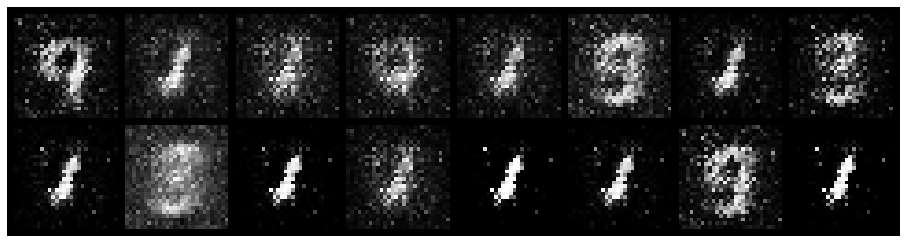

Epoch: [3/50], Batch Num: [200/600]
Discriminator Loss: 0.1051, Generator Loss: 3.9495
D(x): 0.9835, D(G(z)): 0.0771


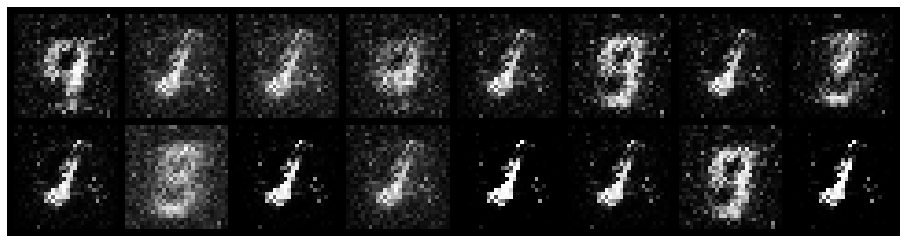

Epoch: [3/50], Batch Num: [300/600]
Discriminator Loss: 0.2248, Generator Loss: 5.7579
D(x): 0.9340, D(G(z)): 0.0098


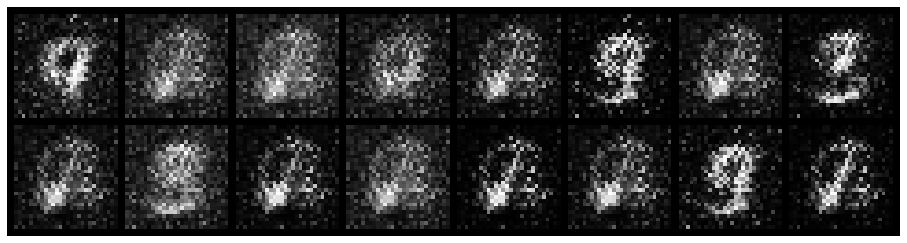

Epoch: [3/50], Batch Num: [400/600]
Discriminator Loss: 0.2347, Generator Loss: 6.2329
D(x): 0.9579, D(G(z)): 0.0996


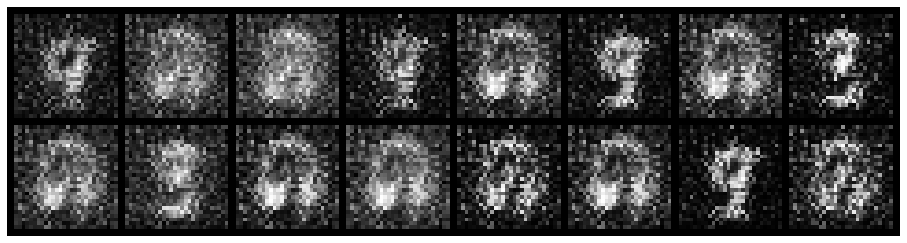

Epoch: [3/50], Batch Num: [500/600]
Discriminator Loss: 0.3079, Generator Loss: 4.7226
D(x): 0.9233, D(G(z)): 0.0205


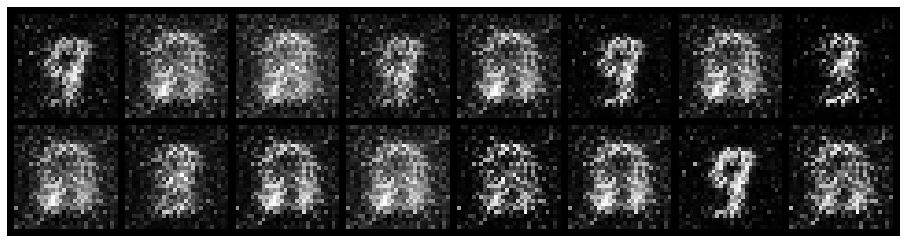

Epoch: [4/50], Batch Num: [0/600]
Discriminator Loss: 0.1948, Generator Loss: 6.0720
D(x): 0.9391, D(G(z)): 0.0275


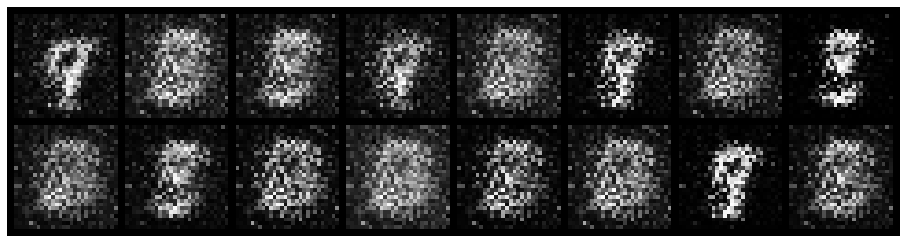

Epoch: [4/50], Batch Num: [100/600]
Discriminator Loss: 0.0378, Generator Loss: 9.1347
D(x): 0.9983, D(G(z)): 0.0286


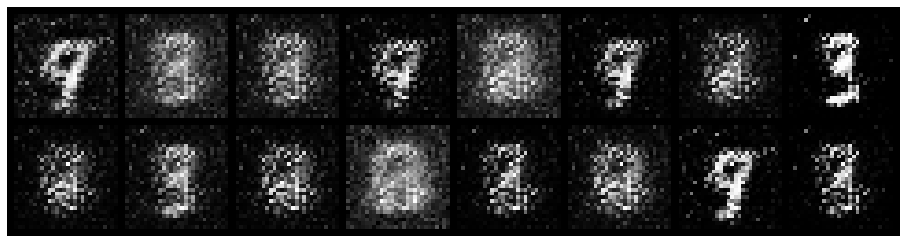

Epoch: [4/50], Batch Num: [200/600]
Discriminator Loss: 0.1750, Generator Loss: 5.9403
D(x): 0.9491, D(G(z)): 0.0745


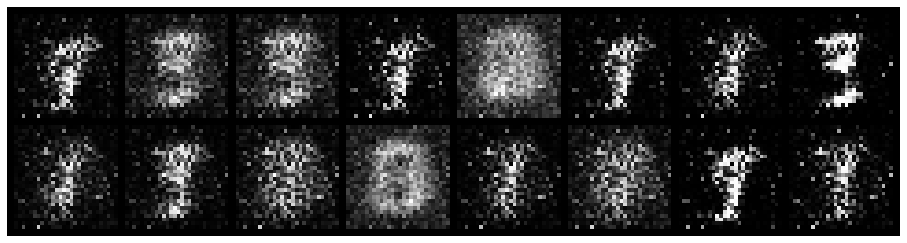

Epoch: [4/50], Batch Num: [300/600]
Discriminator Loss: 0.1797, Generator Loss: 7.1288
D(x): 0.9588, D(G(z)): 0.0769


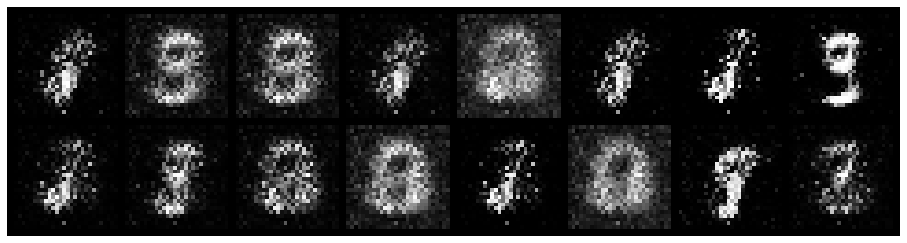

Epoch: [4/50], Batch Num: [400/600]
Discriminator Loss: 0.2297, Generator Loss: 3.8738
D(x): 0.9245, D(G(z)): 0.0808


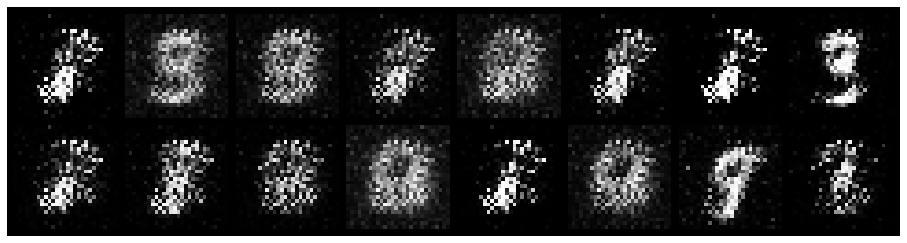

Epoch: [4/50], Batch Num: [500/600]
Discriminator Loss: 0.3040, Generator Loss: 5.5531
D(x): 0.9108, D(G(z)): 0.0723


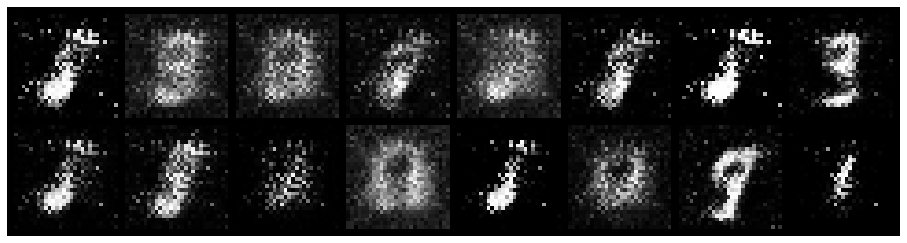

Epoch: [5/50], Batch Num: [0/600]
Discriminator Loss: 0.2785, Generator Loss: 4.7346
D(x): 0.9524, D(G(z)): 0.1303


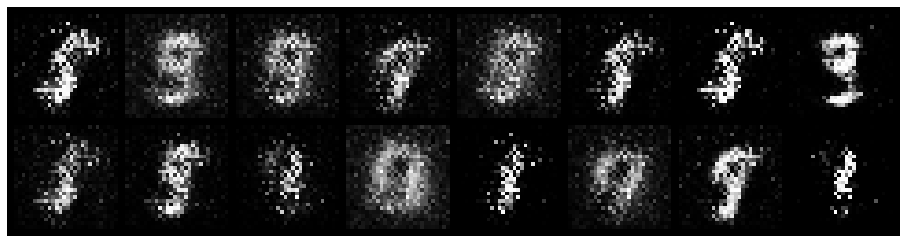

Epoch: [5/50], Batch Num: [100/600]
Discriminator Loss: 0.2198, Generator Loss: 4.8150
D(x): 0.9252, D(G(z)): 0.0790


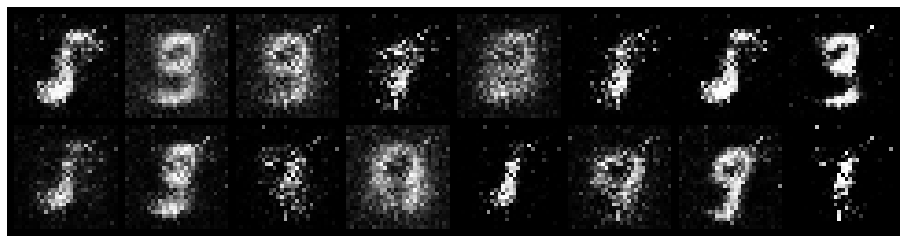

Epoch: [5/50], Batch Num: [200/600]
Discriminator Loss: 0.2929, Generator Loss: 3.5480
D(x): 0.9334, D(G(z)): 0.1052


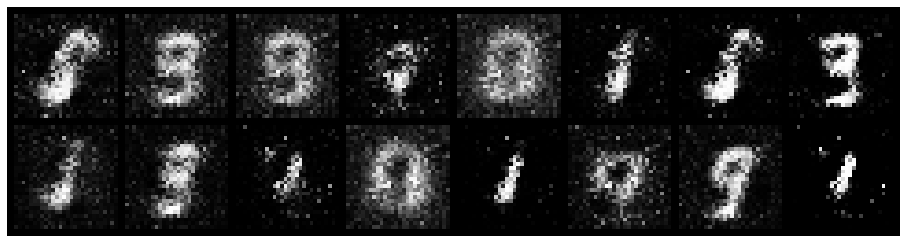

Epoch: [5/50], Batch Num: [300/600]
Discriminator Loss: 0.2194, Generator Loss: 4.0569
D(x): 0.9144, D(G(z)): 0.0440


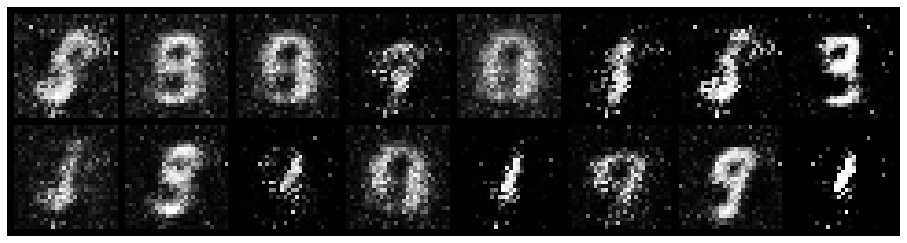

Epoch: [5/50], Batch Num: [400/600]
Discriminator Loss: 0.1853, Generator Loss: 5.6152
D(x): 0.9316, D(G(z)): 0.0243


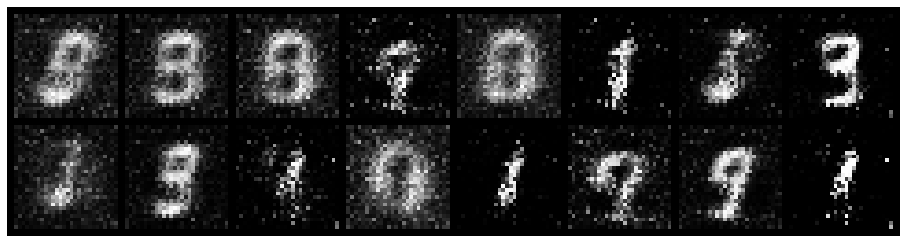

Epoch: [5/50], Batch Num: [500/600]
Discriminator Loss: 0.1088, Generator Loss: 5.0614
D(x): 0.9614, D(G(z)): 0.0496


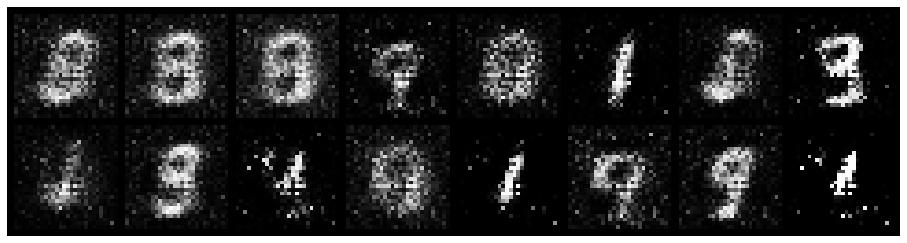

Epoch: [6/50], Batch Num: [0/600]
Discriminator Loss: 0.1185, Generator Loss: 4.1632
D(x): 0.9680, D(G(z)): 0.0622


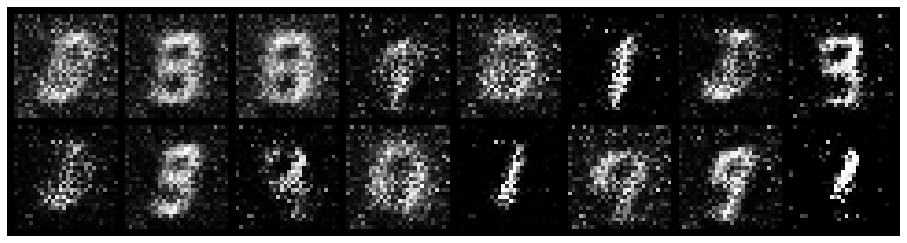

Epoch: [6/50], Batch Num: [100/600]
Discriminator Loss: 0.1441, Generator Loss: 4.2019
D(x): 0.9943, D(G(z)): 0.1132


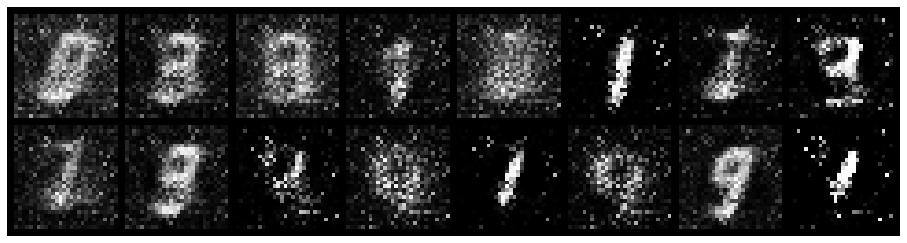

Epoch: [6/50], Batch Num: [200/600]
Discriminator Loss: 0.3699, Generator Loss: 6.0548
D(x): 0.8953, D(G(z)): 0.0263


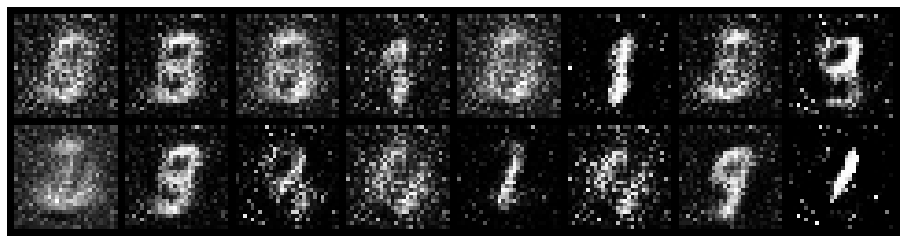

Epoch: [6/50], Batch Num: [300/600]
Discriminator Loss: 0.3555, Generator Loss: 3.9823
D(x): 0.9823, D(G(z)): 0.2232


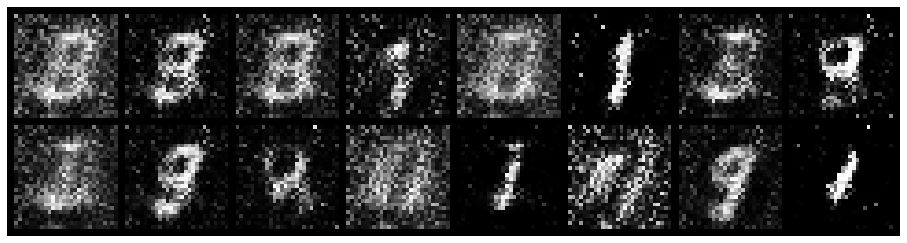

Epoch: [6/50], Batch Num: [400/600]
Discriminator Loss: 0.2023, Generator Loss: 5.0859
D(x): 0.9473, D(G(z)): 0.0960


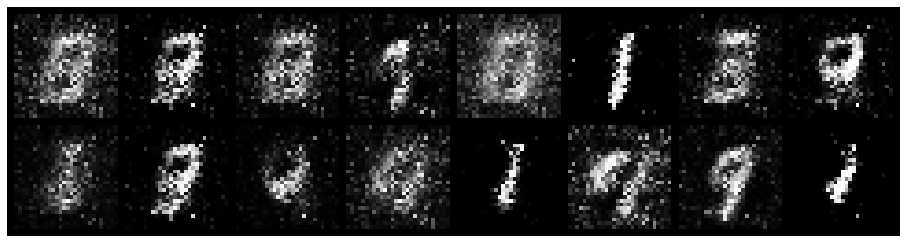

Epoch: [6/50], Batch Num: [500/600]
Discriminator Loss: 0.4113, Generator Loss: 4.6507
D(x): 0.9529, D(G(z)): 0.2212


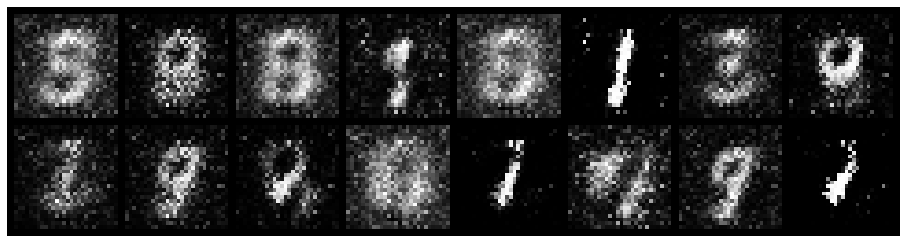

Epoch: [7/50], Batch Num: [0/600]
Discriminator Loss: 0.3489, Generator Loss: 3.3468
D(x): 0.9244, D(G(z)): 0.1384


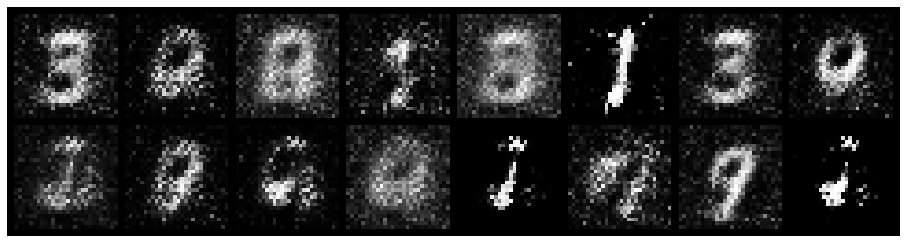

Epoch: [7/50], Batch Num: [100/600]
Discriminator Loss: 0.2212, Generator Loss: 4.3332
D(x): 0.9037, D(G(z)): 0.0649


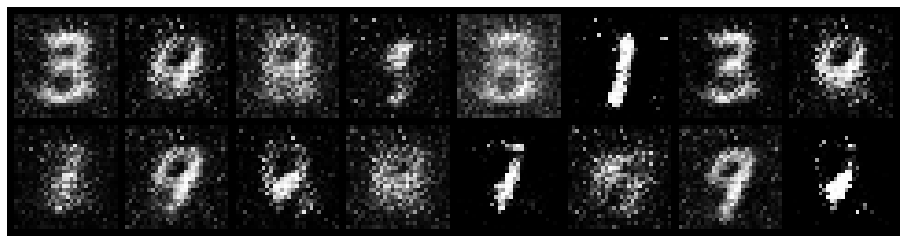

Epoch: [7/50], Batch Num: [200/600]
Discriminator Loss: 0.4305, Generator Loss: 3.5903
D(x): 0.8905, D(G(z)): 0.1162


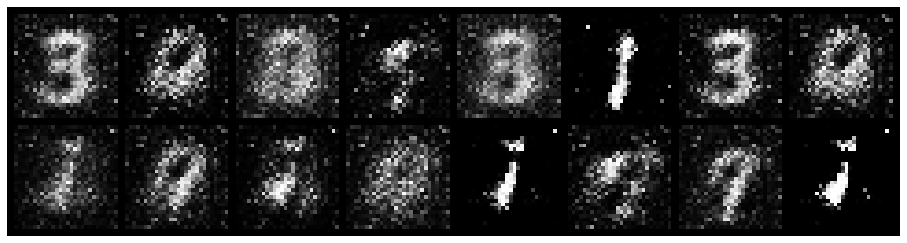

Epoch: [7/50], Batch Num: [300/600]
Discriminator Loss: 0.2769, Generator Loss: 4.4293
D(x): 0.9562, D(G(z)): 0.1048


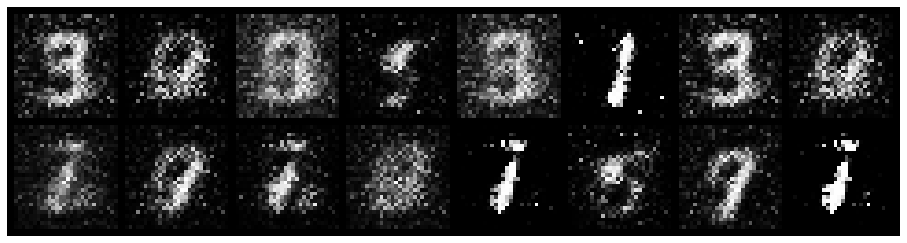

Epoch: [7/50], Batch Num: [400/600]
Discriminator Loss: 0.1661, Generator Loss: 5.3473
D(x): 0.9645, D(G(z)): 0.0783


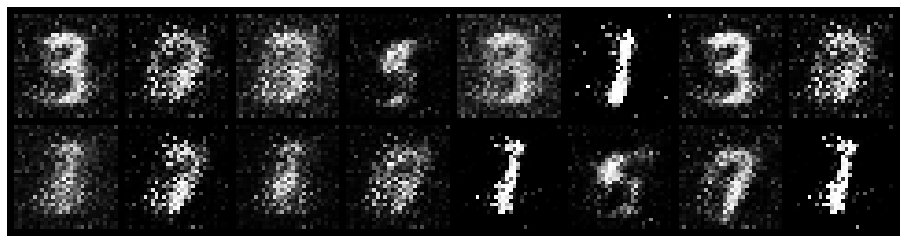

Epoch: [7/50], Batch Num: [500/600]
Discriminator Loss: 0.1536, Generator Loss: 4.7981
D(x): 0.9264, D(G(z)): 0.0256


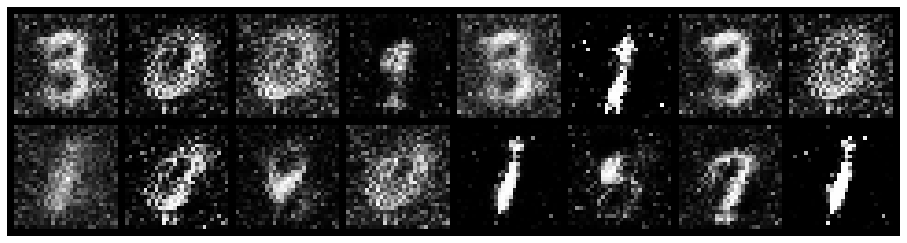

Epoch: [8/50], Batch Num: [0/600]
Discriminator Loss: 0.2319, Generator Loss: 7.5573
D(x): 0.9082, D(G(z)): 0.0262


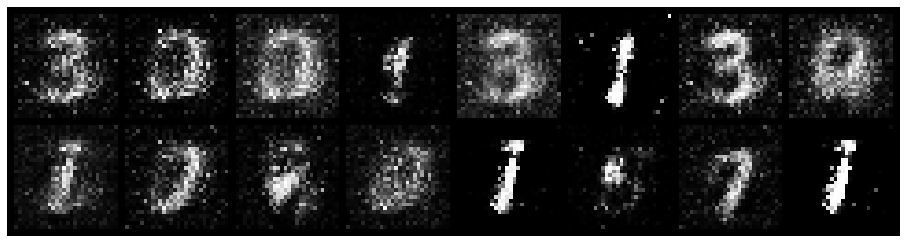

Epoch: [8/50], Batch Num: [100/600]
Discriminator Loss: 0.3356, Generator Loss: 3.8490
D(x): 0.9736, D(G(z)): 0.2067


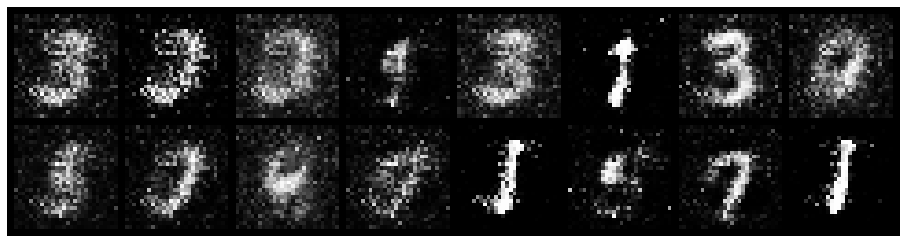

Epoch: [8/50], Batch Num: [200/600]
Discriminator Loss: 0.4293, Generator Loss: 5.0450
D(x): 0.9635, D(G(z)): 0.2396


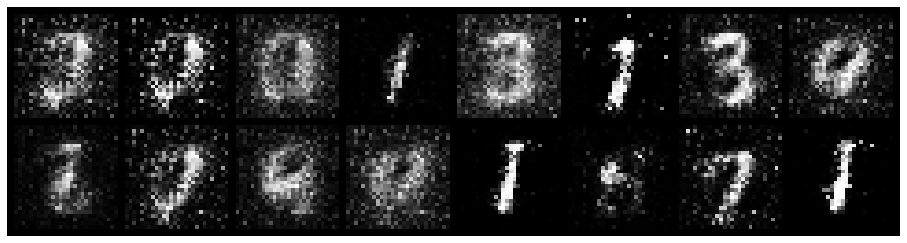

Epoch: [8/50], Batch Num: [300/600]
Discriminator Loss: 0.7794, Generator Loss: 3.2699
D(x): 0.8573, D(G(z)): 0.2930


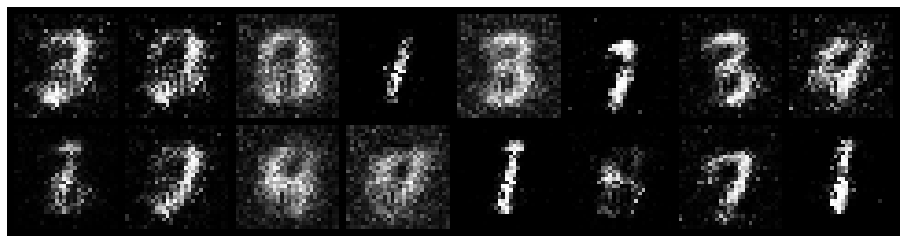

Epoch: [8/50], Batch Num: [400/600]
Discriminator Loss: 0.3151, Generator Loss: 5.1742
D(x): 0.9183, D(G(z)): 0.0737


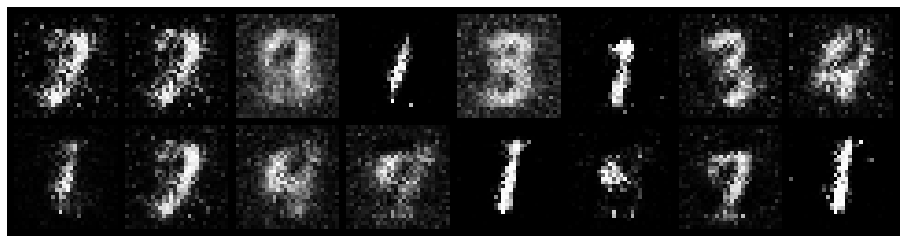

Epoch: [8/50], Batch Num: [500/600]
Discriminator Loss: 0.2216, Generator Loss: 4.6708
D(x): 0.9399, D(G(z)): 0.1032


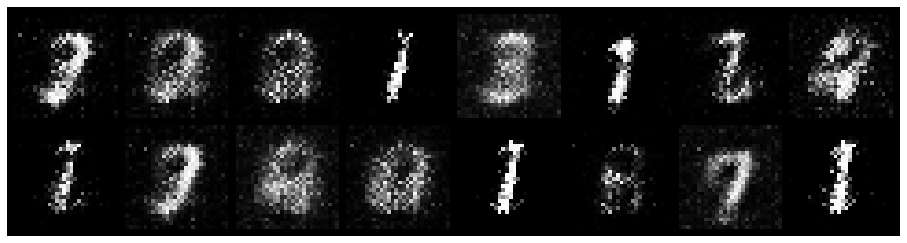

Epoch: [9/50], Batch Num: [0/600]
Discriminator Loss: 0.3842, Generator Loss: 4.8562
D(x): 0.9319, D(G(z)): 0.1766


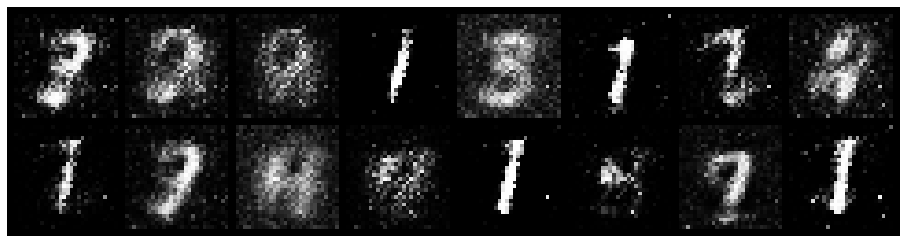

Epoch: [9/50], Batch Num: [100/600]
Discriminator Loss: 0.1932, Generator Loss: 4.5878
D(x): 0.9780, D(G(z)): 0.1258


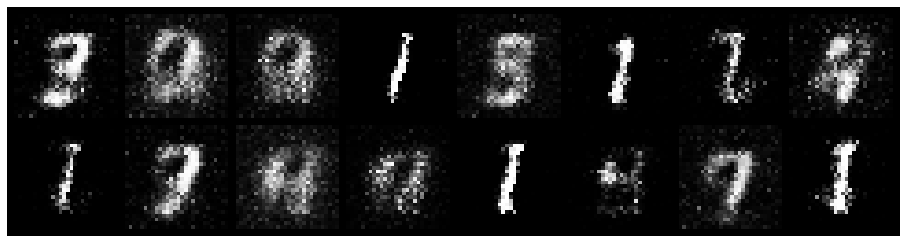

Epoch: [9/50], Batch Num: [200/600]
Discriminator Loss: 0.1301, Generator Loss: 4.9879
D(x): 0.9383, D(G(z)): 0.0380


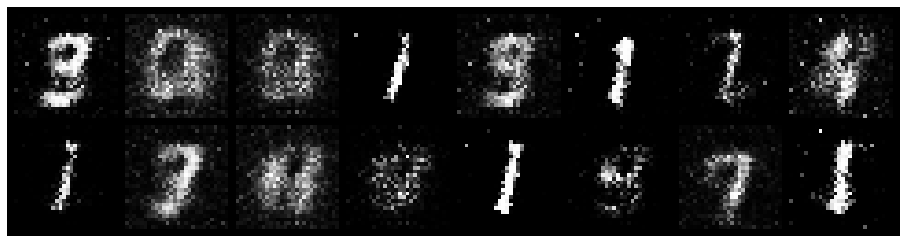

Epoch: [9/50], Batch Num: [300/600]
Discriminator Loss: 0.2533, Generator Loss: 3.1647
D(x): 0.9291, D(G(z)): 0.1029


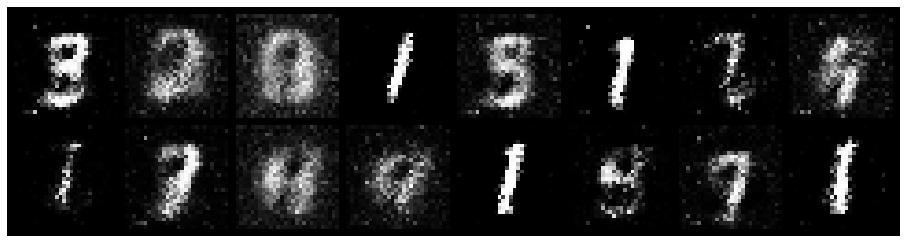

Epoch: [9/50], Batch Num: [400/600]
Discriminator Loss: 0.2382, Generator Loss: 3.5138
D(x): 0.9315, D(G(z)): 0.0771


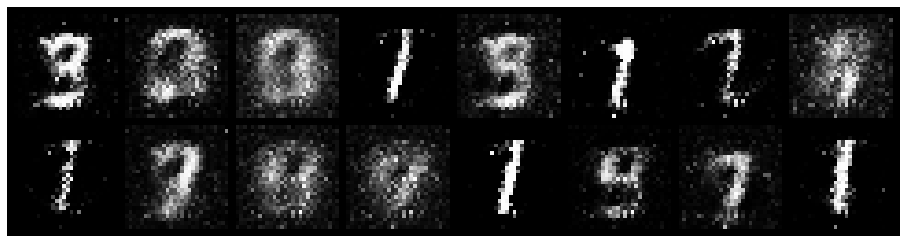

Epoch: [9/50], Batch Num: [500/600]
Discriminator Loss: 0.2903, Generator Loss: 3.4112
D(x): 0.8870, D(G(z)): 0.0599


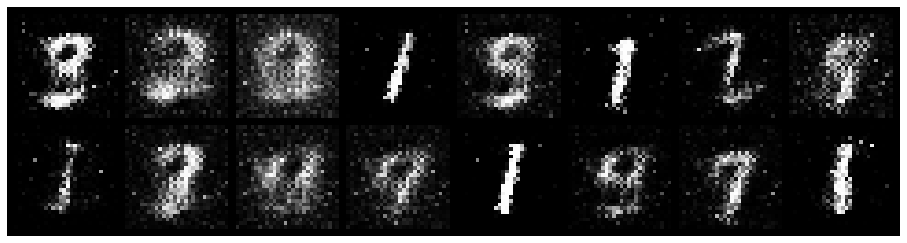

Epoch: [10/50], Batch Num: [0/600]
Discriminator Loss: 0.4159, Generator Loss: 3.9426
D(x): 0.9572, D(G(z)): 0.1856


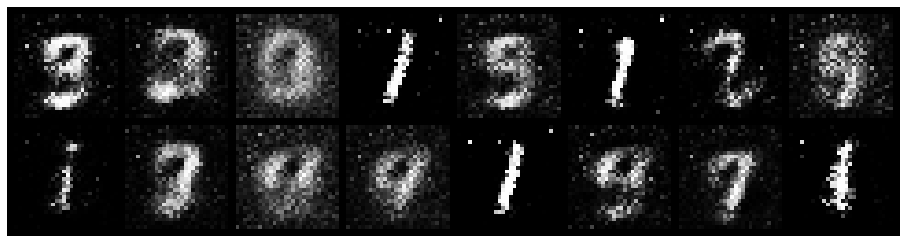

Epoch: [10/50], Batch Num: [100/600]
Discriminator Loss: 0.3639, Generator Loss: 5.2312
D(x): 0.9246, D(G(z)): 0.1104


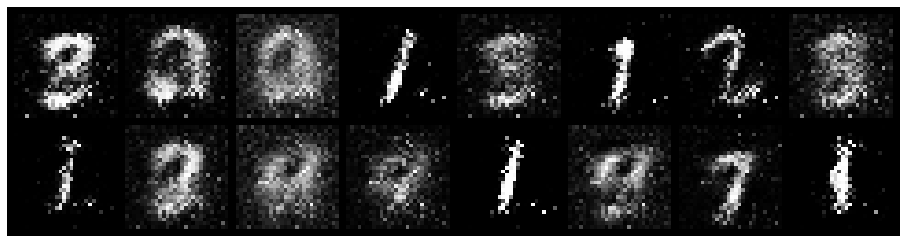

Epoch: [10/50], Batch Num: [200/600]
Discriminator Loss: 0.7158, Generator Loss: 7.0116
D(x): 0.7592, D(G(z)): 0.0142


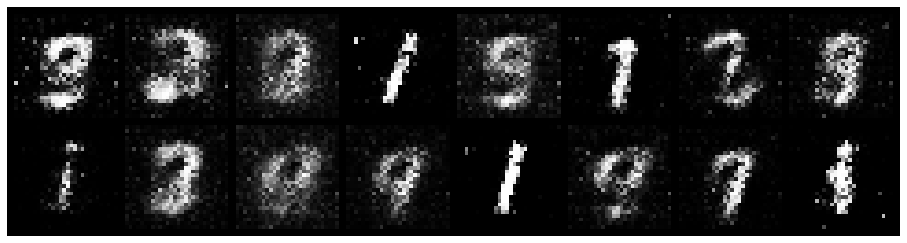

Epoch: [10/50], Batch Num: [300/600]
Discriminator Loss: 0.4701, Generator Loss: 3.0623
D(x): 0.8643, D(G(z)): 0.1234


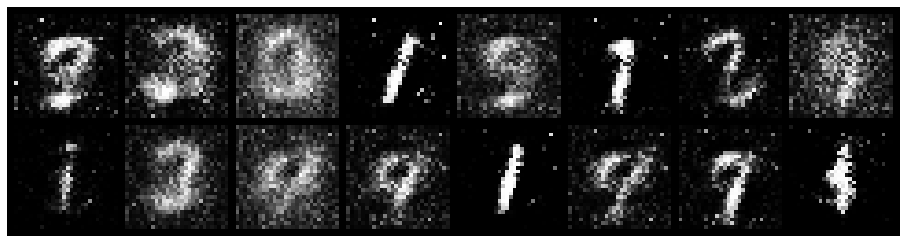

Epoch: [10/50], Batch Num: [400/600]
Discriminator Loss: 0.2624, Generator Loss: 3.8220
D(x): 0.9121, D(G(z)): 0.0958


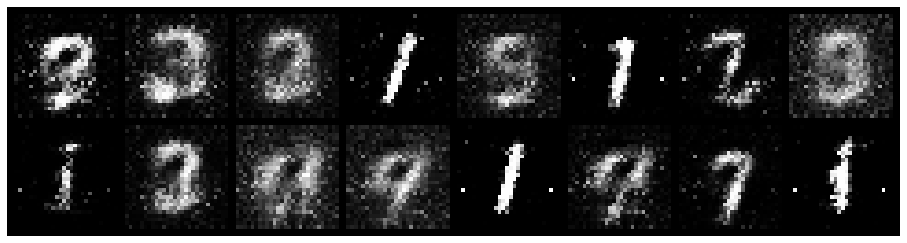

Epoch: [10/50], Batch Num: [500/600]
Discriminator Loss: 0.2607, Generator Loss: 4.4953
D(x): 0.9578, D(G(z)): 0.1124


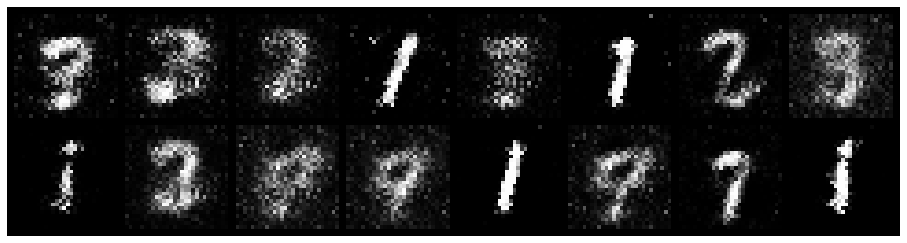

Epoch: [11/50], Batch Num: [0/600]
Discriminator Loss: 0.4422, Generator Loss: 3.4781
D(x): 0.8812, D(G(z)): 0.1669


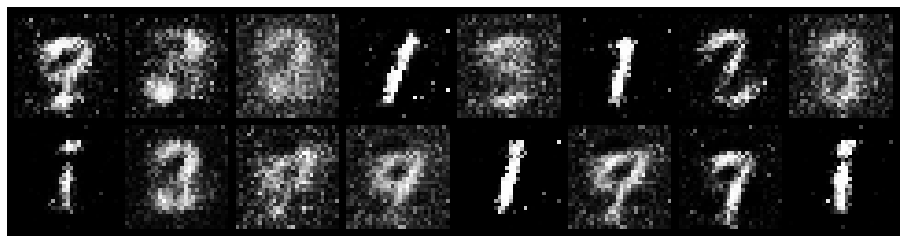

Epoch: [11/50], Batch Num: [100/600]
Discriminator Loss: 0.2722, Generator Loss: 4.4636
D(x): 0.9159, D(G(z)): 0.0941


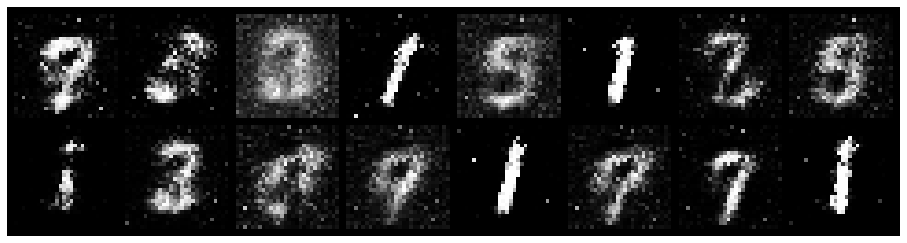

Epoch: [11/50], Batch Num: [200/600]
Discriminator Loss: 0.2294, Generator Loss: 4.8200
D(x): 0.9506, D(G(z)): 0.1203


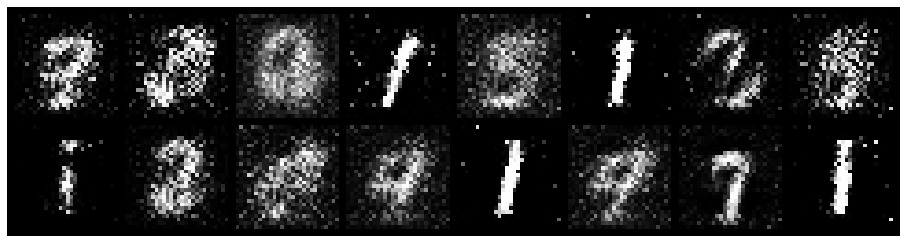

Epoch: [11/50], Batch Num: [300/600]
Discriminator Loss: 0.3539, Generator Loss: 4.3435
D(x): 0.9162, D(G(z)): 0.0802


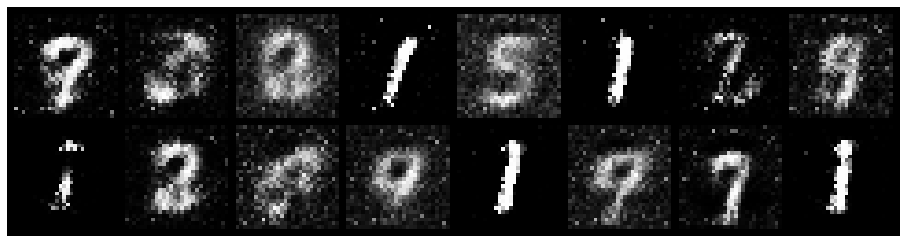

Epoch: [11/50], Batch Num: [400/600]
Discriminator Loss: 0.4788, Generator Loss: 3.1845
D(x): 0.8315, D(G(z)): 0.0623


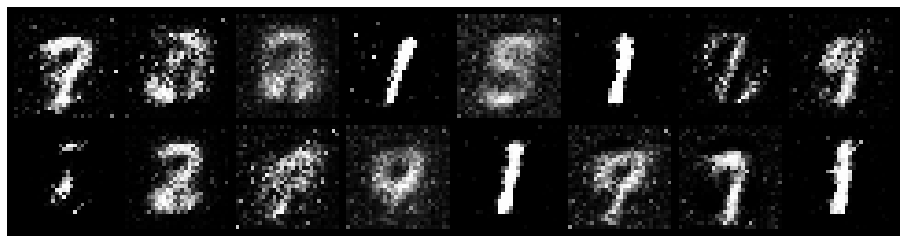

Epoch: [11/50], Batch Num: [500/600]
Discriminator Loss: 0.3541, Generator Loss: 4.8337
D(x): 0.9455, D(G(z)): 0.1772


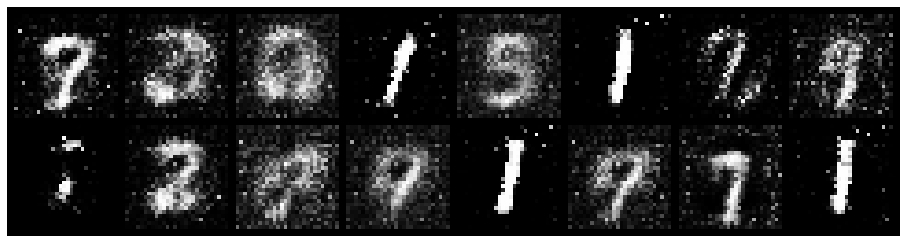

Epoch: [12/50], Batch Num: [0/600]
Discriminator Loss: 0.7054, Generator Loss: 4.5208
D(x): 0.7829, D(G(z)): 0.0253


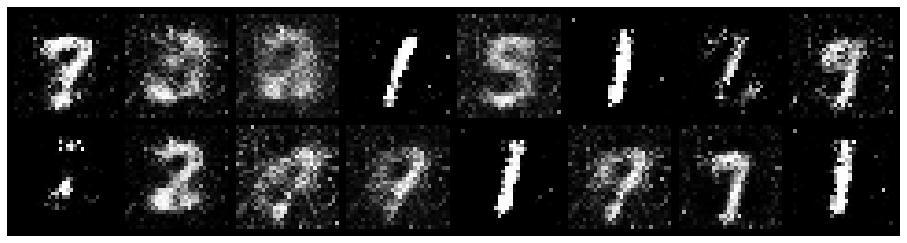

Epoch: [12/50], Batch Num: [100/600]
Discriminator Loss: 0.3060, Generator Loss: 3.5117
D(x): 0.9472, D(G(z)): 0.1166


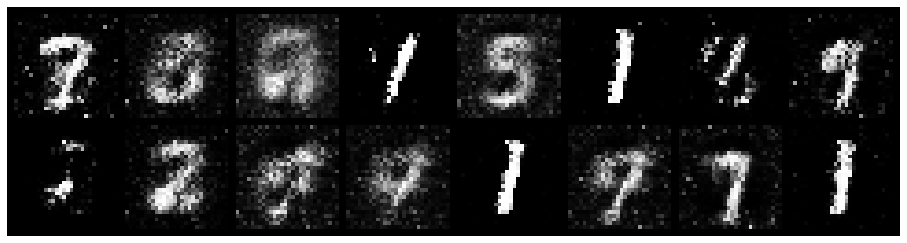

Epoch: [12/50], Batch Num: [200/600]
Discriminator Loss: 0.1936, Generator Loss: 5.4509
D(x): 0.9188, D(G(z)): 0.0311


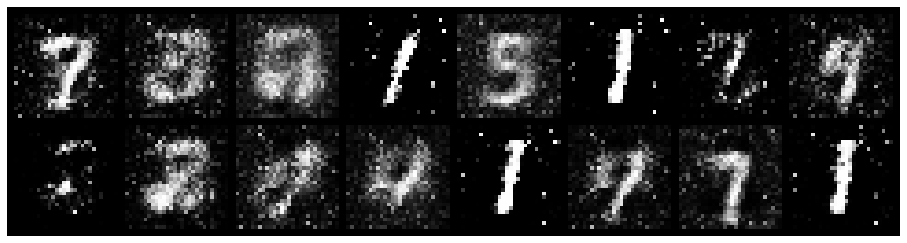

Epoch: [12/50], Batch Num: [300/600]
Discriminator Loss: 0.1654, Generator Loss: 4.5145
D(x): 0.9855, D(G(z)): 0.1209


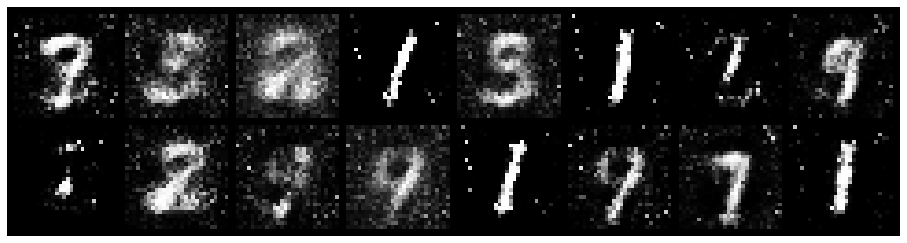

Epoch: [12/50], Batch Num: [400/600]
Discriminator Loss: 0.5423, Generator Loss: 4.0251
D(x): 0.8237, D(G(z)): 0.0799


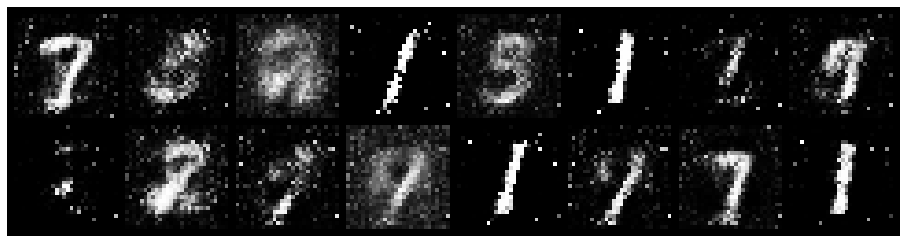

Epoch: [12/50], Batch Num: [500/600]
Discriminator Loss: 0.2262, Generator Loss: 4.6922
D(x): 0.9468, D(G(z)): 0.1066


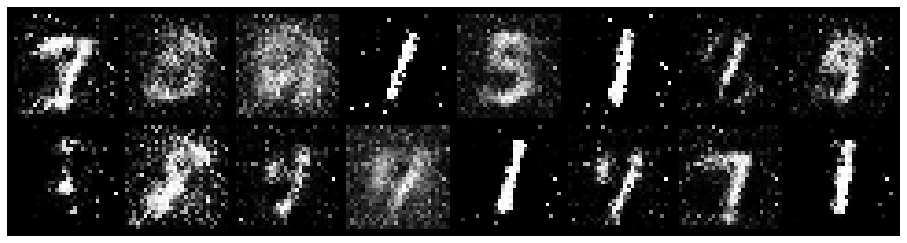

Epoch: [13/50], Batch Num: [0/600]
Discriminator Loss: 0.6097, Generator Loss: 5.5861
D(x): 0.8294, D(G(z)): 0.0119


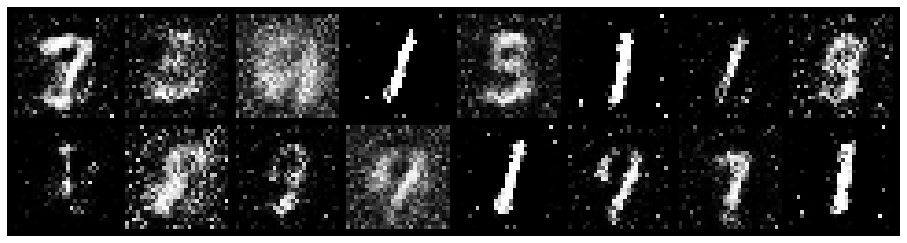

Epoch: [13/50], Batch Num: [100/600]
Discriminator Loss: 0.2354, Generator Loss: 5.3865
D(x): 0.9111, D(G(z)): 0.0336


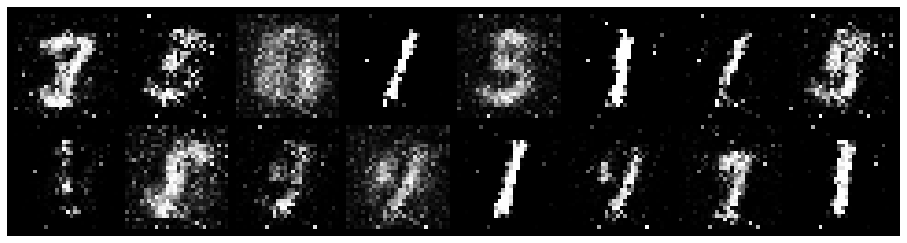

Epoch: [13/50], Batch Num: [200/600]
Discriminator Loss: 0.3747, Generator Loss: 5.0621
D(x): 0.9738, D(G(z)): 0.2026


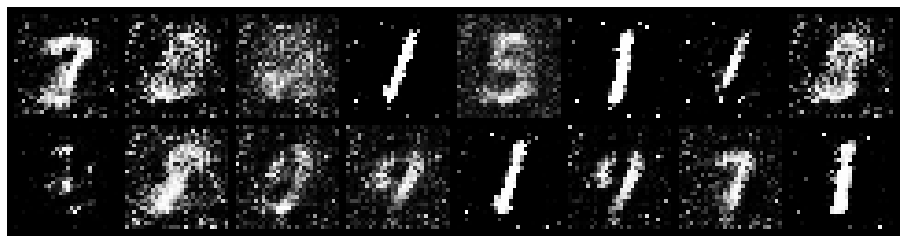

Epoch: [13/50], Batch Num: [300/600]
Discriminator Loss: 0.4390, Generator Loss: 7.1261
D(x): 0.8586, D(G(z)): 0.0836


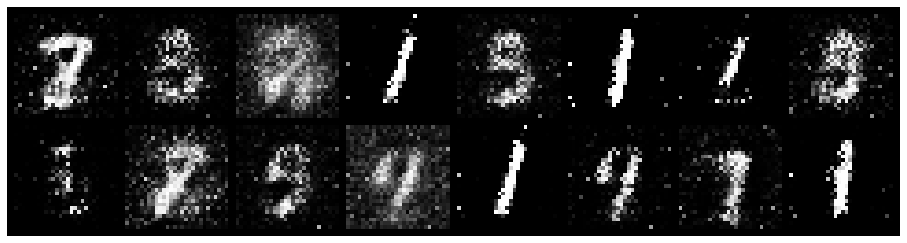

Epoch: [13/50], Batch Num: [400/600]
Discriminator Loss: 0.4081, Generator Loss: 4.7394
D(x): 0.8639, D(G(z)): 0.0573


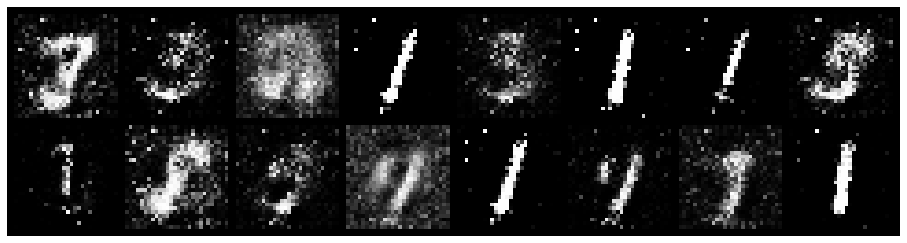

Epoch: [13/50], Batch Num: [500/600]
Discriminator Loss: 0.3214, Generator Loss: 3.4439
D(x): 0.8929, D(G(z)): 0.0901


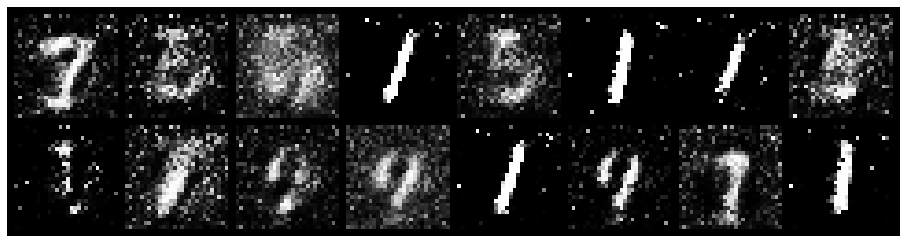

Epoch: [14/50], Batch Num: [0/600]
Discriminator Loss: 0.2833, Generator Loss: 4.6582
D(x): 0.9426, D(G(z)): 0.1185


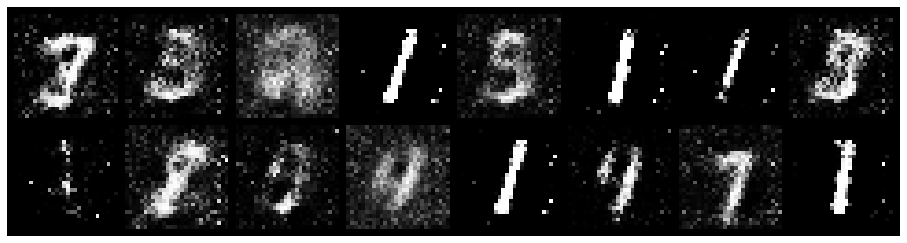

Epoch: [14/50], Batch Num: [100/600]
Discriminator Loss: 0.3313, Generator Loss: 3.4746
D(x): 0.8970, D(G(z)): 0.0645


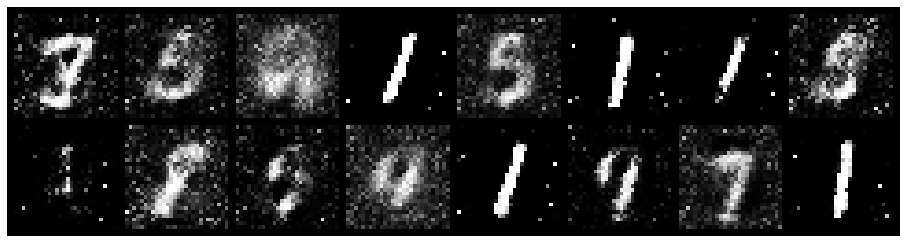

Epoch: [14/50], Batch Num: [200/600]
Discriminator Loss: 0.2367, Generator Loss: 5.8045
D(x): 0.9457, D(G(z)): 0.0799


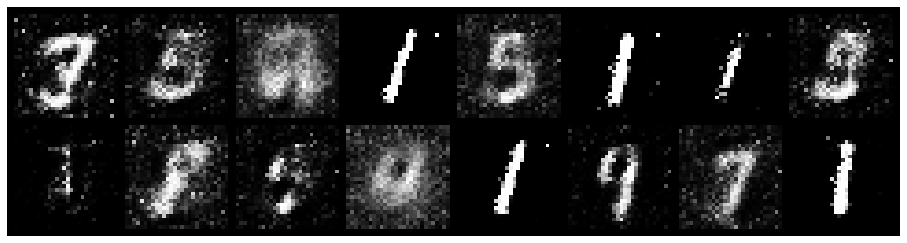

Epoch: [14/50], Batch Num: [300/600]
Discriminator Loss: 0.2096, Generator Loss: 4.0997
D(x): 0.9239, D(G(z)): 0.0479


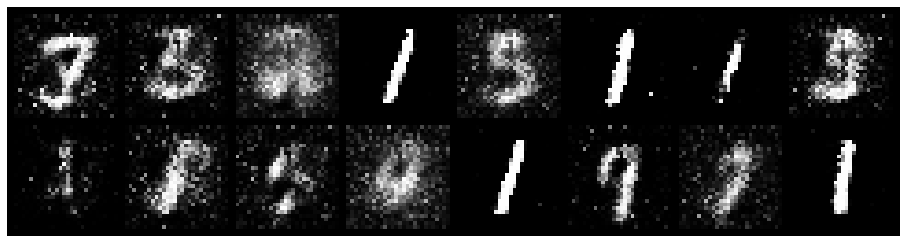

Epoch: [14/50], Batch Num: [400/600]
Discriminator Loss: 0.3530, Generator Loss: 6.0282
D(x): 0.9157, D(G(z)): 0.0936


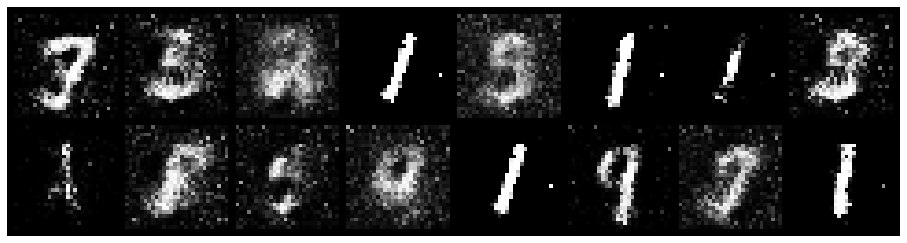

Epoch: [14/50], Batch Num: [500/600]
Discriminator Loss: 0.4359, Generator Loss: 3.3750
D(x): 0.8637, D(G(z)): 0.0993


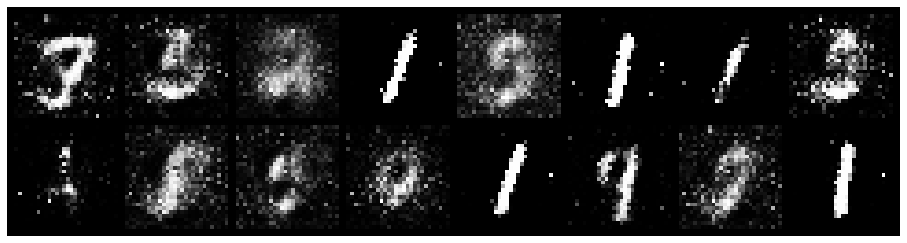

Epoch: [15/50], Batch Num: [0/600]
Discriminator Loss: 0.2609, Generator Loss: 3.4010
D(x): 0.9258, D(G(z)): 0.1180


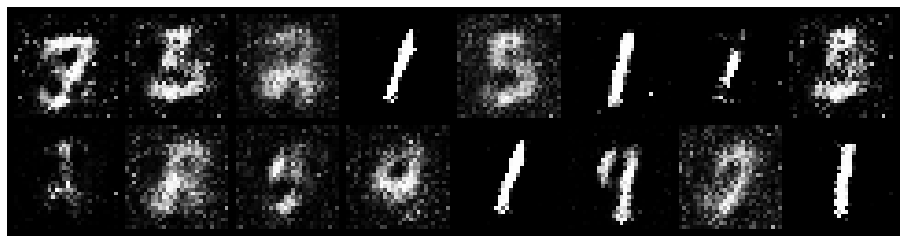

Epoch: [15/50], Batch Num: [100/600]
Discriminator Loss: 0.3786, Generator Loss: 4.3101
D(x): 0.8482, D(G(z)): 0.0523


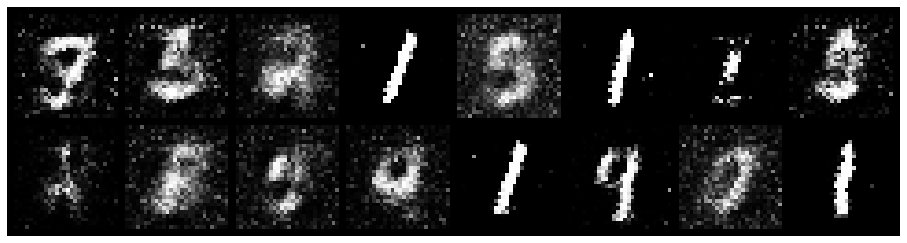

Epoch: [15/50], Batch Num: [200/600]
Discriminator Loss: 0.3814, Generator Loss: 3.8018
D(x): 0.8854, D(G(z)): 0.1429


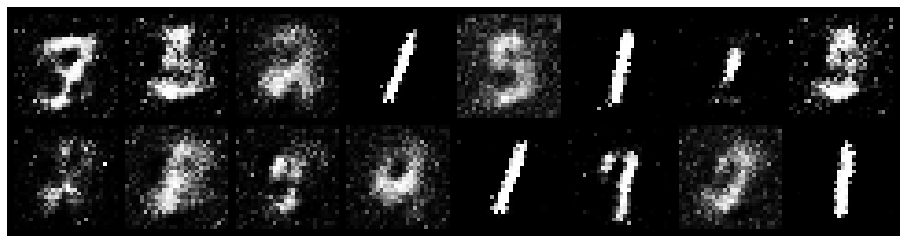

Epoch: [15/50], Batch Num: [300/600]
Discriminator Loss: 0.2955, Generator Loss: 3.5275
D(x): 0.8891, D(G(z)): 0.0762


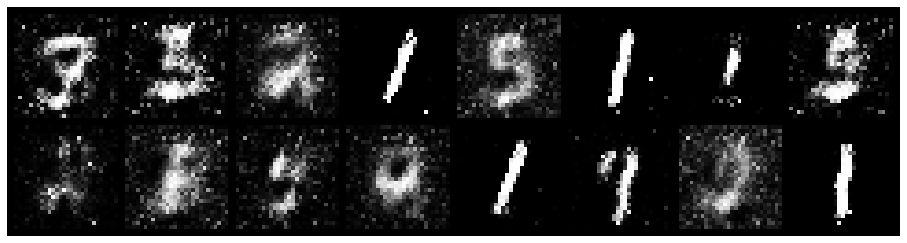

Epoch: [15/50], Batch Num: [400/600]
Discriminator Loss: 0.3472, Generator Loss: 3.7173
D(x): 0.8828, D(G(z)): 0.0611


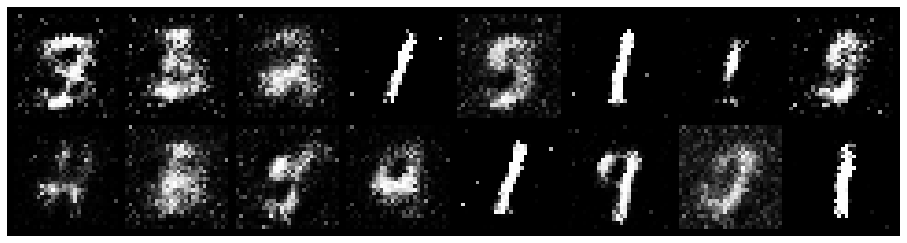

Epoch: [15/50], Batch Num: [500/600]
Discriminator Loss: 0.3470, Generator Loss: 3.9391
D(x): 0.9165, D(G(z)): 0.1456


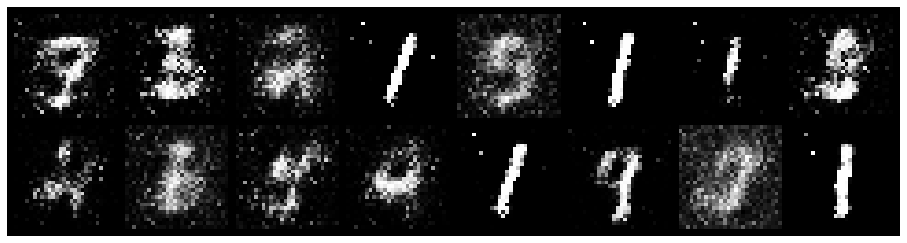

Epoch: [16/50], Batch Num: [0/600]
Discriminator Loss: 0.5747, Generator Loss: 4.2934
D(x): 0.8479, D(G(z)): 0.1732


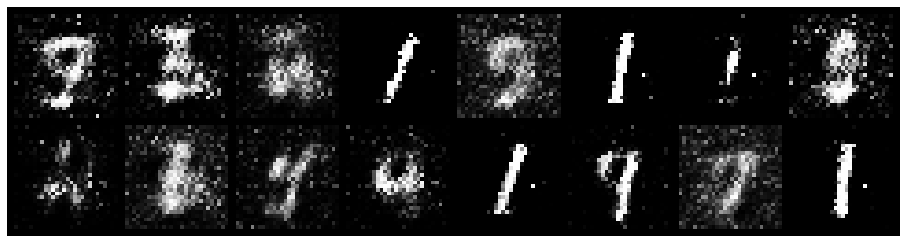

Epoch: [16/50], Batch Num: [100/600]
Discriminator Loss: 0.6180, Generator Loss: 7.3070
D(x): 0.8133, D(G(z)): 0.0386


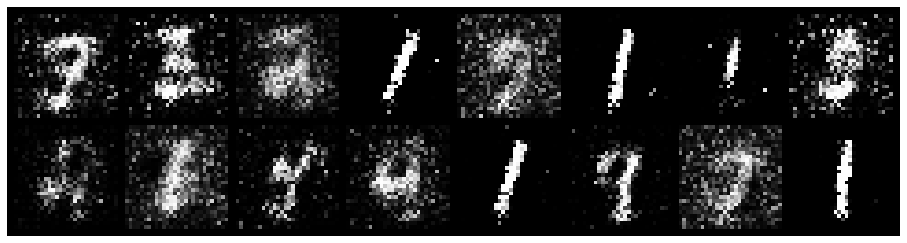

Epoch: [16/50], Batch Num: [200/600]
Discriminator Loss: 0.3352, Generator Loss: 4.1601
D(x): 0.8704, D(G(z)): 0.0561


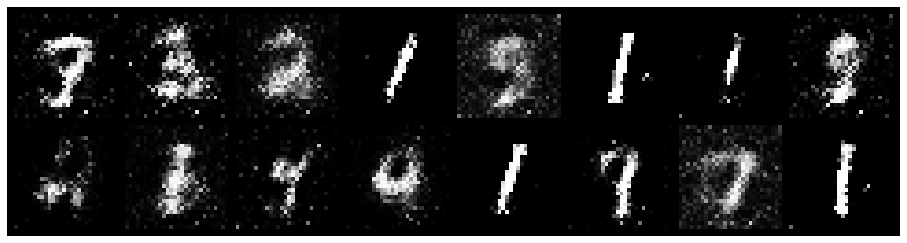

Epoch: [16/50], Batch Num: [300/600]
Discriminator Loss: 0.2236, Generator Loss: 6.0824
D(x): 0.9358, D(G(z)): 0.0436


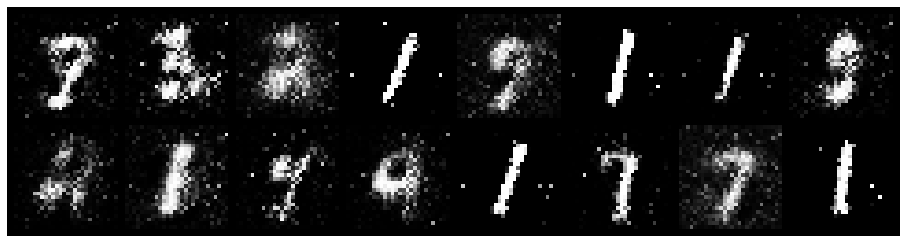

Epoch: [16/50], Batch Num: [400/600]
Discriminator Loss: 0.2896, Generator Loss: 3.3091
D(x): 0.8692, D(G(z)): 0.0425


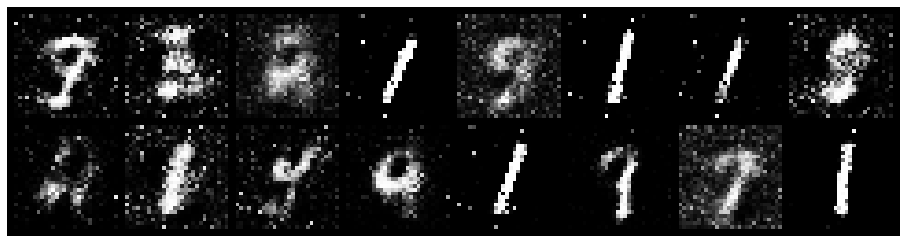

Epoch: [16/50], Batch Num: [500/600]
Discriminator Loss: 0.3292, Generator Loss: 3.5626
D(x): 0.9144, D(G(z)): 0.1123


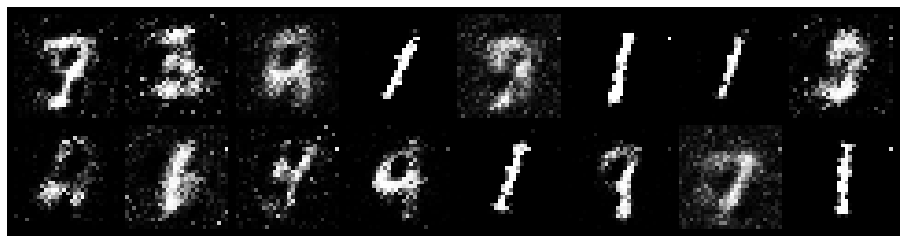

Epoch: [17/50], Batch Num: [0/600]
Discriminator Loss: 0.3292, Generator Loss: 3.6925
D(x): 0.9051, D(G(z)): 0.1106


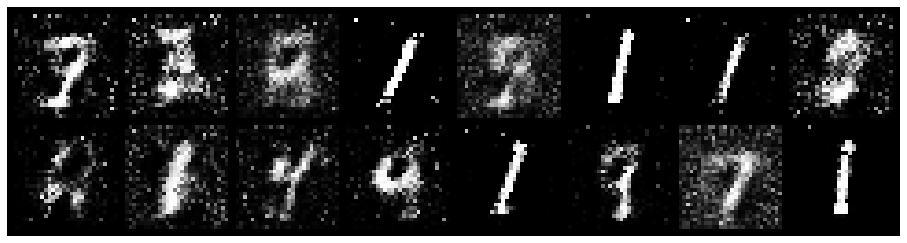

Epoch: [17/50], Batch Num: [100/600]
Discriminator Loss: 0.2615, Generator Loss: 3.6135
D(x): 0.8812, D(G(z)): 0.0626


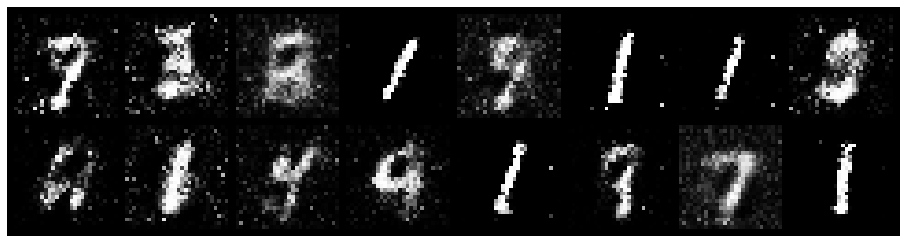

Epoch: [17/50], Batch Num: [200/600]
Discriminator Loss: 0.3819, Generator Loss: 3.7674
D(x): 0.8747, D(G(z)): 0.0644


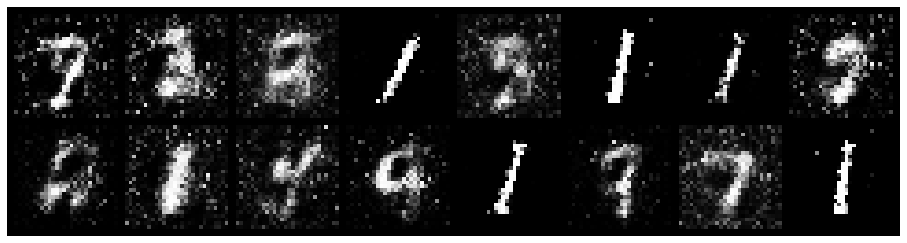

Epoch: [17/50], Batch Num: [300/600]
Discriminator Loss: 0.4584, Generator Loss: 3.0434
D(x): 0.8677, D(G(z)): 0.1067


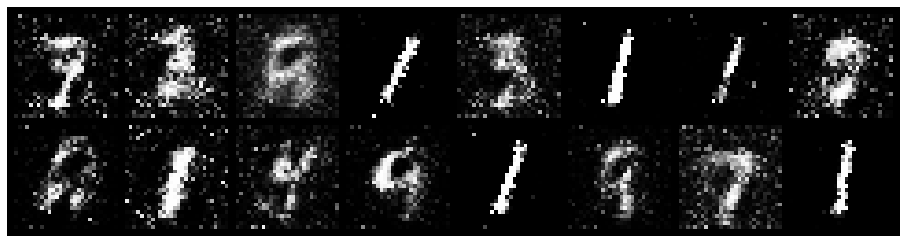

Epoch: [17/50], Batch Num: [400/600]
Discriminator Loss: 0.3299, Generator Loss: 2.8709
D(x): 0.8737, D(G(z)): 0.0949


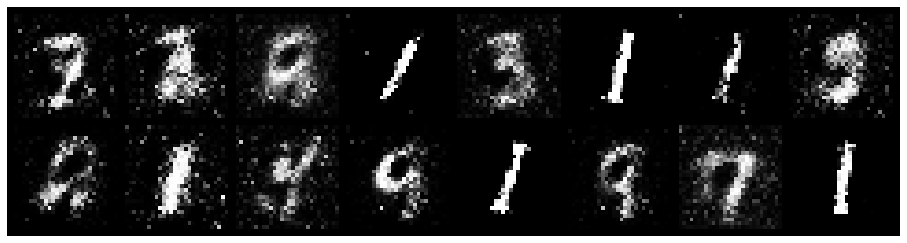

Epoch: [17/50], Batch Num: [500/600]
Discriminator Loss: 0.3973, Generator Loss: 4.1575
D(x): 0.9464, D(G(z)): 0.1894


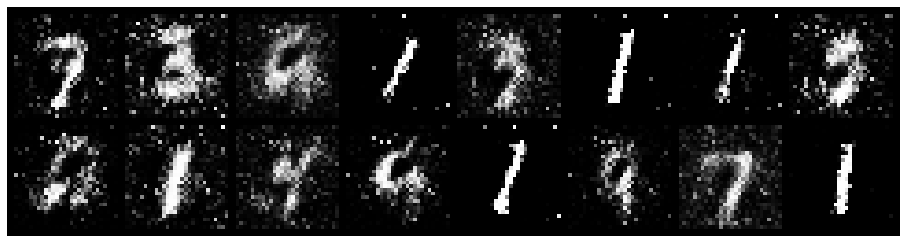

Epoch: [18/50], Batch Num: [0/600]
Discriminator Loss: 0.2916, Generator Loss: 3.8857
D(x): 0.9174, D(G(z)): 0.0532


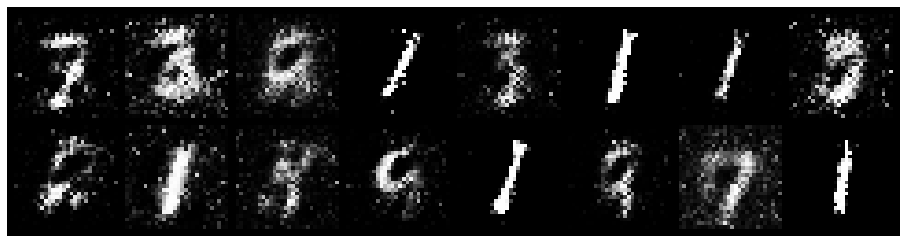

Epoch: [18/50], Batch Num: [100/600]
Discriminator Loss: 0.3099, Generator Loss: 3.1270
D(x): 0.9273, D(G(z)): 0.1440


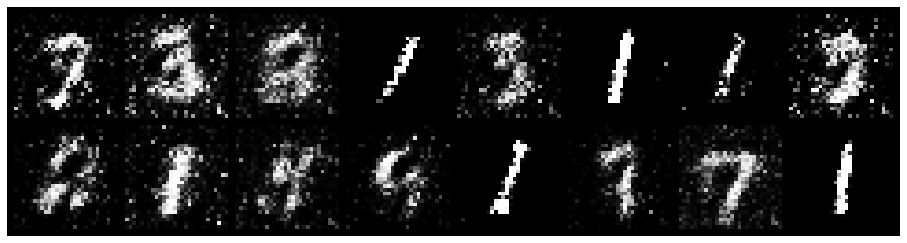

Epoch: [18/50], Batch Num: [200/600]
Discriminator Loss: 0.6163, Generator Loss: 3.7066
D(x): 0.8090, D(G(z)): 0.1147


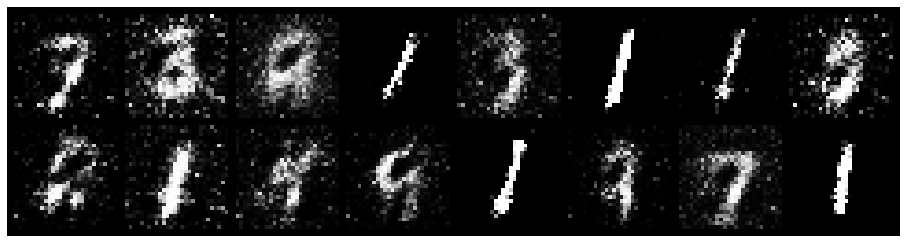

Epoch: [18/50], Batch Num: [300/600]
Discriminator Loss: 0.4380, Generator Loss: 3.2300
D(x): 0.8291, D(G(z)): 0.1024


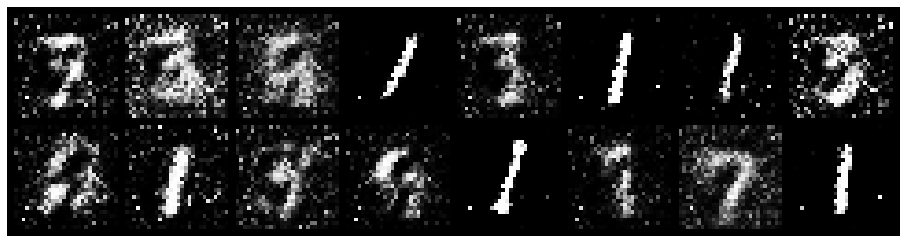

Epoch: [18/50], Batch Num: [400/600]
Discriminator Loss: 0.5813, Generator Loss: 4.2992
D(x): 0.8078, D(G(z)): 0.0129


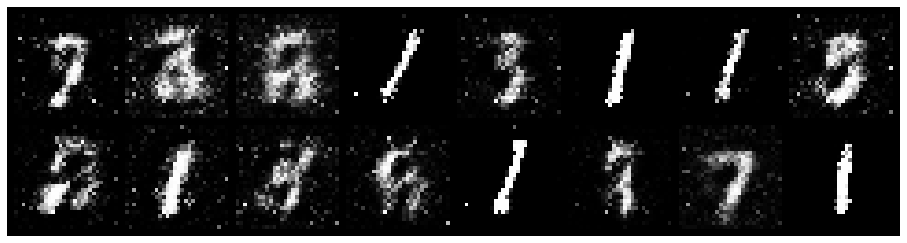

Epoch: [18/50], Batch Num: [500/600]
Discriminator Loss: 0.2945, Generator Loss: 4.0857
D(x): 0.8946, D(G(z)): 0.0576


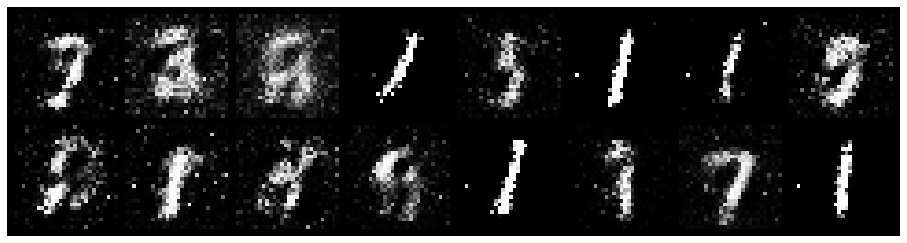

Epoch: [19/50], Batch Num: [0/600]
Discriminator Loss: 0.1772, Generator Loss: 3.1066
D(x): 0.9558, D(G(z)): 0.1049


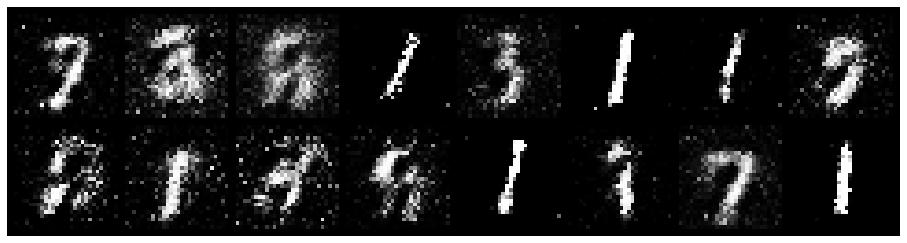

Epoch: [19/50], Batch Num: [100/600]
Discriminator Loss: 0.3898, Generator Loss: 2.9094
D(x): 0.8750, D(G(z)): 0.1089


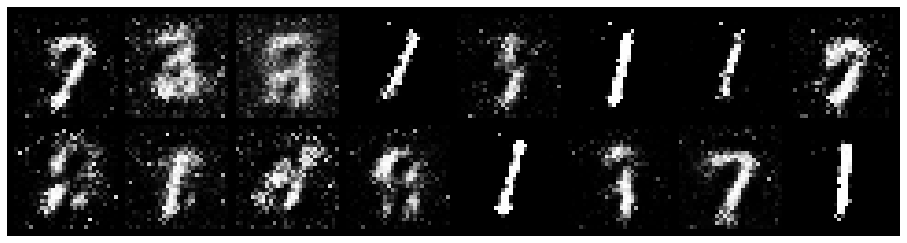

Epoch: [19/50], Batch Num: [200/600]
Discriminator Loss: 0.3254, Generator Loss: 4.9834
D(x): 0.9178, D(G(z)): 0.0956


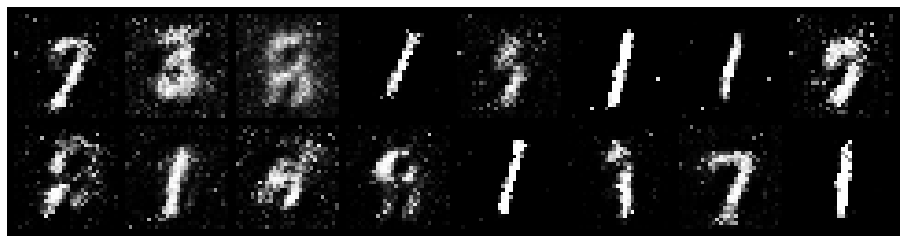

Epoch: [19/50], Batch Num: [300/600]
Discriminator Loss: 0.3925, Generator Loss: 2.7993
D(x): 0.8453, D(G(z)): 0.0904


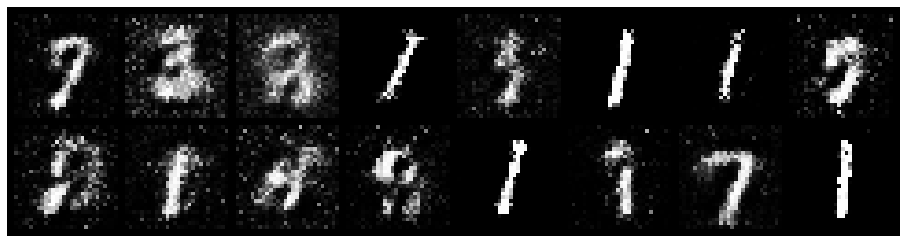

Epoch: [19/50], Batch Num: [400/600]
Discriminator Loss: 0.3350, Generator Loss: 2.7939
D(x): 0.8753, D(G(z)): 0.1038


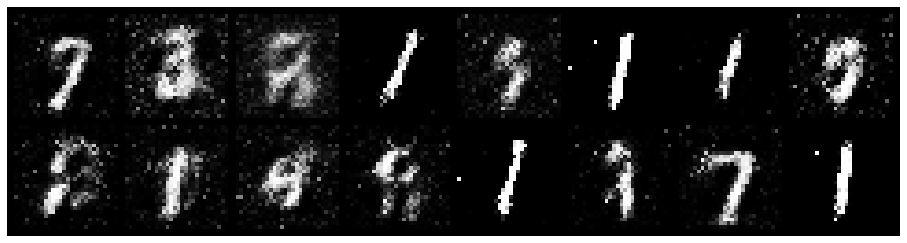

Epoch: [19/50], Batch Num: [500/600]
Discriminator Loss: 0.5683, Generator Loss: 3.2210
D(x): 0.8468, D(G(z)): 0.1017


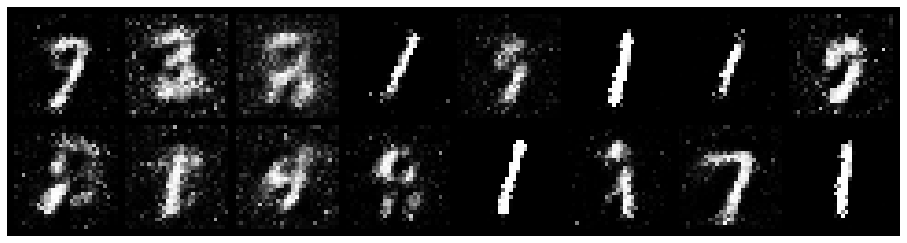

Epoch: [20/50], Batch Num: [0/600]
Discriminator Loss: 0.4495, Generator Loss: 3.9658
D(x): 0.8564, D(G(z)): 0.0815


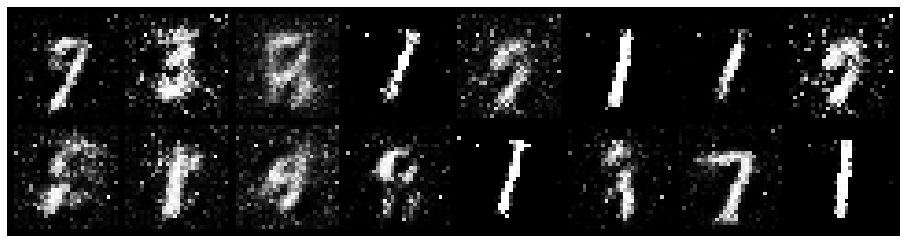

Epoch: [20/50], Batch Num: [100/600]
Discriminator Loss: 0.5527, Generator Loss: 3.5910
D(x): 0.9461, D(G(z)): 0.2088


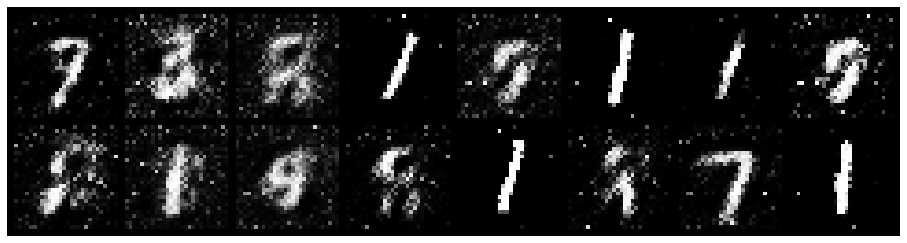

Epoch: [20/50], Batch Num: [200/600]
Discriminator Loss: 0.5418, Generator Loss: 4.2033
D(x): 0.9425, D(G(z)): 0.2488


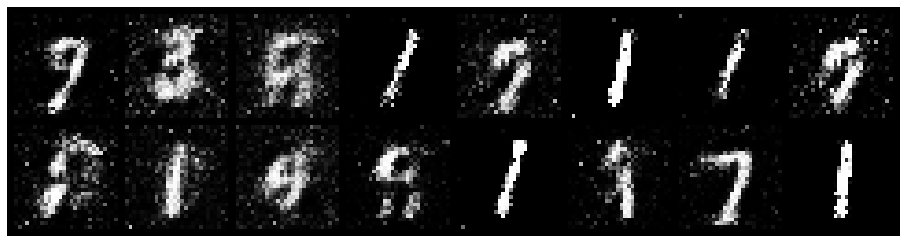

Epoch: [20/50], Batch Num: [300/600]
Discriminator Loss: 0.5159, Generator Loss: 5.6655
D(x): 0.7991, D(G(z)): 0.0310


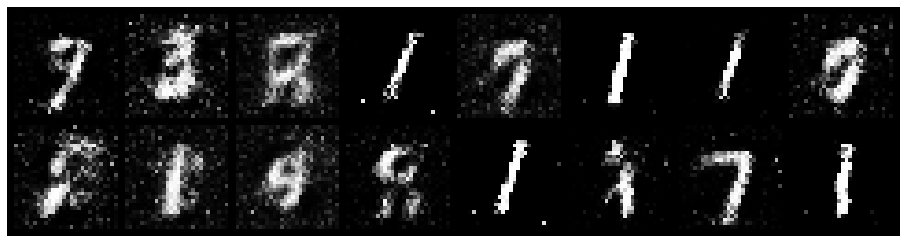

Epoch: [20/50], Batch Num: [400/600]
Discriminator Loss: 0.2706, Generator Loss: 4.3946
D(x): 0.9031, D(G(z)): 0.0962


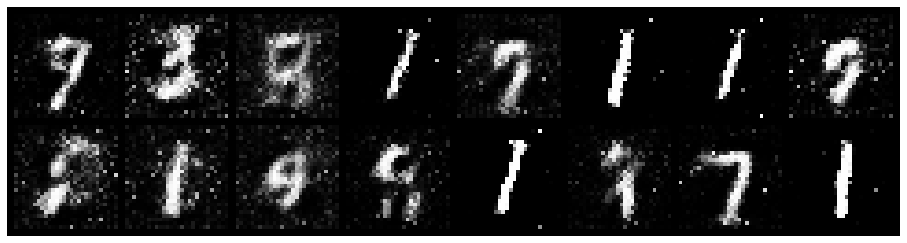

Epoch: [20/50], Batch Num: [500/600]
Discriminator Loss: 0.4164, Generator Loss: 2.3728
D(x): 0.9083, D(G(z)): 0.1995


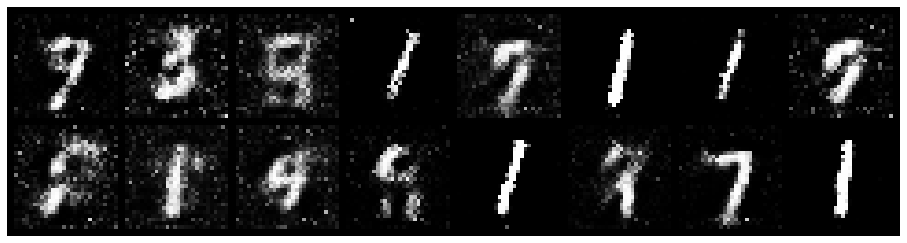

Epoch: [21/50], Batch Num: [0/600]
Discriminator Loss: 0.4630, Generator Loss: 5.1296
D(x): 0.8497, D(G(z)): 0.0603


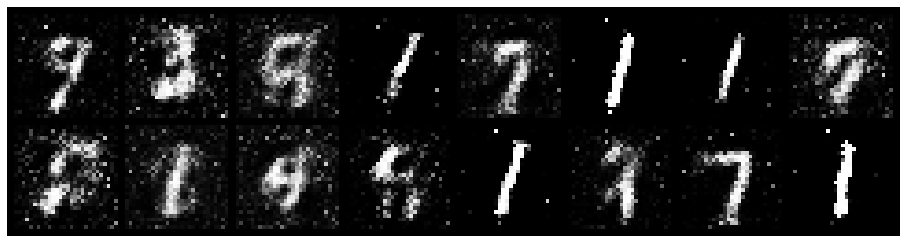

Epoch: [21/50], Batch Num: [100/600]
Discriminator Loss: 0.4605, Generator Loss: 3.6307
D(x): 0.8802, D(G(z)): 0.1619


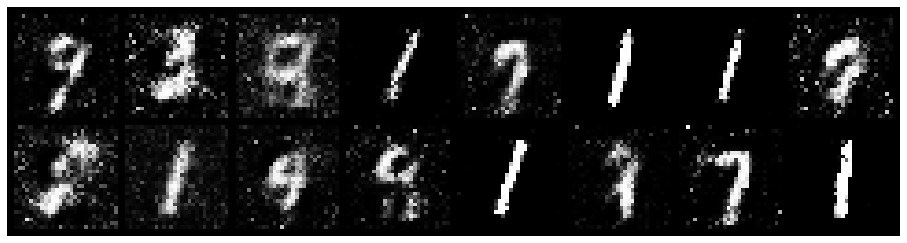

Epoch: [21/50], Batch Num: [200/600]
Discriminator Loss: 0.7950, Generator Loss: 2.7717
D(x): 0.7567, D(G(z)): 0.1281


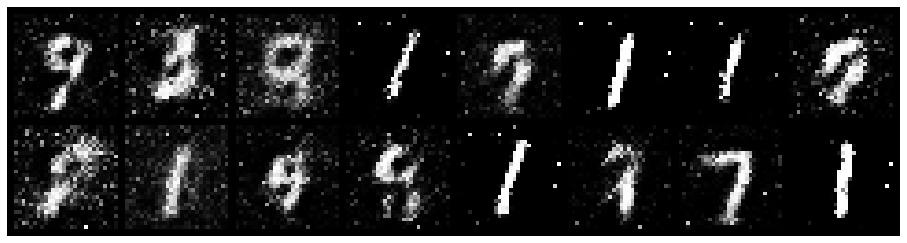

Epoch: [21/50], Batch Num: [300/600]
Discriminator Loss: 0.3816, Generator Loss: 2.9180
D(x): 0.8874, D(G(z)): 0.1631


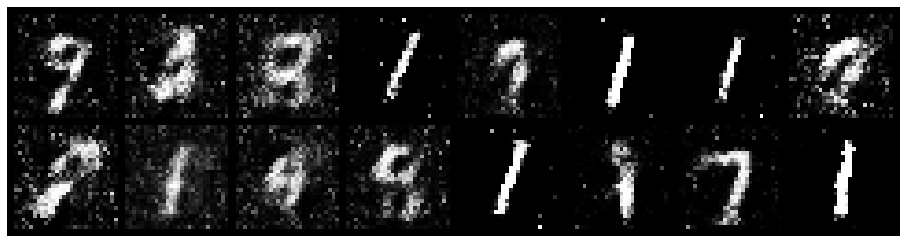

Epoch: [21/50], Batch Num: [400/600]
Discriminator Loss: 0.5377, Generator Loss: 3.2229
D(x): 0.8837, D(G(z)): 0.1560


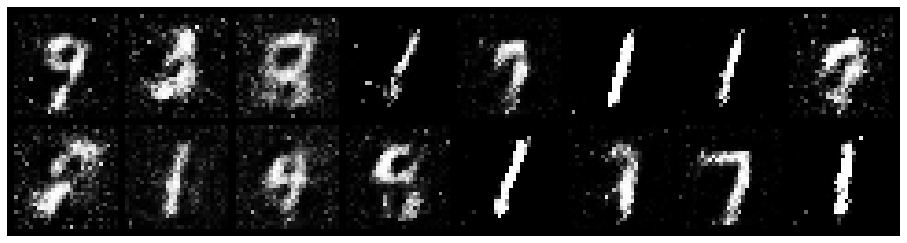

Epoch: [21/50], Batch Num: [500/600]
Discriminator Loss: 0.4211, Generator Loss: 2.9084
D(x): 0.8483, D(G(z)): 0.1016


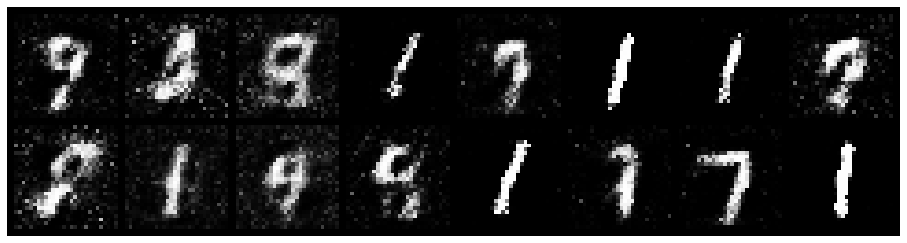

Epoch: [22/50], Batch Num: [0/600]
Discriminator Loss: 0.5591, Generator Loss: 2.1539
D(x): 0.8860, D(G(z)): 0.2532


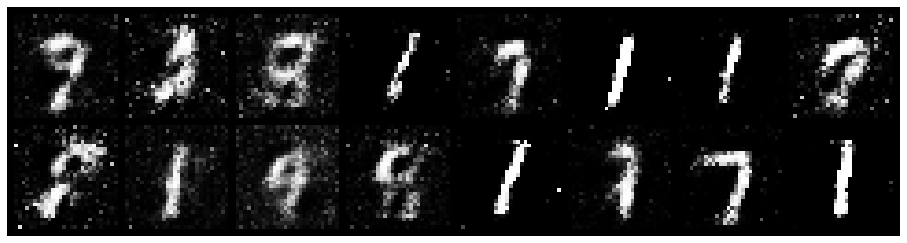

Epoch: [22/50], Batch Num: [100/600]
Discriminator Loss: 0.5140, Generator Loss: 2.6077
D(x): 0.8623, D(G(z)): 0.1972


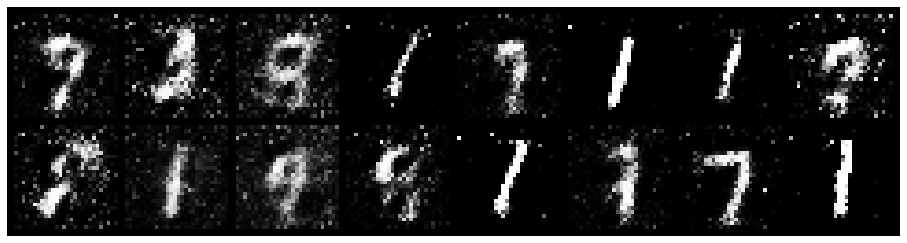

Epoch: [22/50], Batch Num: [200/600]
Discriminator Loss: 0.7501, Generator Loss: 4.8130
D(x): 0.7799, D(G(z)): 0.0242


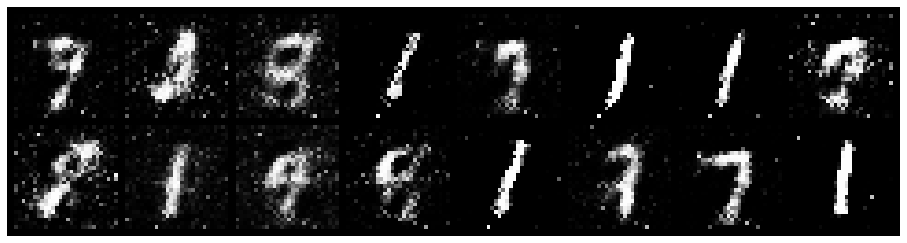

Epoch: [22/50], Batch Num: [300/600]
Discriminator Loss: 0.1831, Generator Loss: 3.5224
D(x): 0.9418, D(G(z)): 0.0839


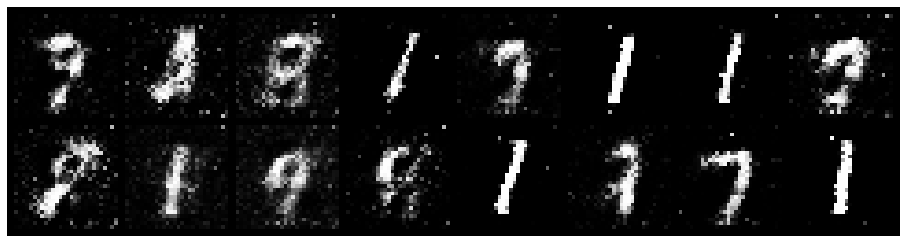

Epoch: [22/50], Batch Num: [400/600]
Discriminator Loss: 0.3170, Generator Loss: 3.7470
D(x): 0.8961, D(G(z)): 0.1134


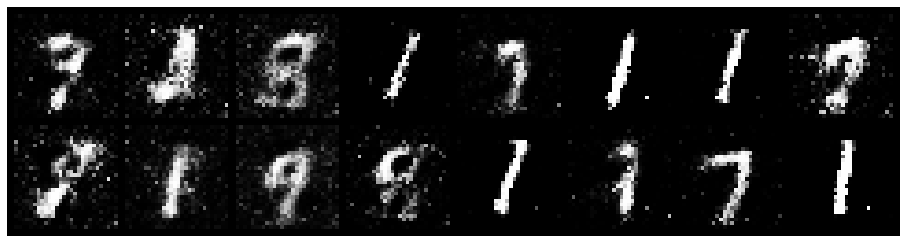

Epoch: [22/50], Batch Num: [500/600]
Discriminator Loss: 0.4992, Generator Loss: 2.7645
D(x): 0.8842, D(G(z)): 0.1898


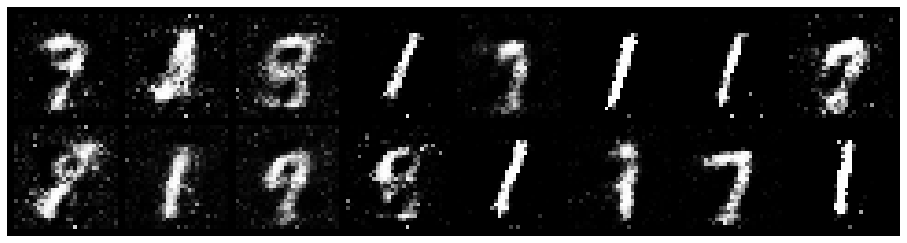

Epoch: [23/50], Batch Num: [0/600]
Discriminator Loss: 0.3385, Generator Loss: 2.7263
D(x): 0.9037, D(G(z)): 0.1472


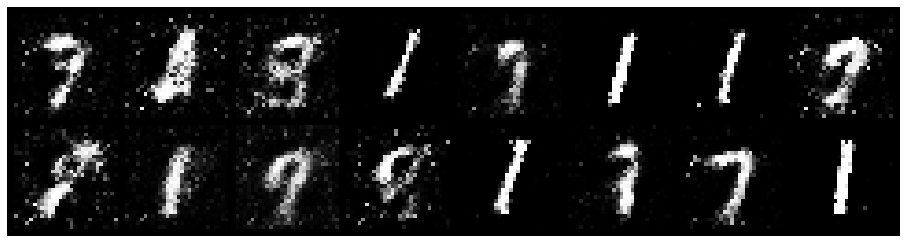

Epoch: [23/50], Batch Num: [100/600]
Discriminator Loss: 0.7980, Generator Loss: 2.7198
D(x): 0.7141, D(G(z)): 0.0781


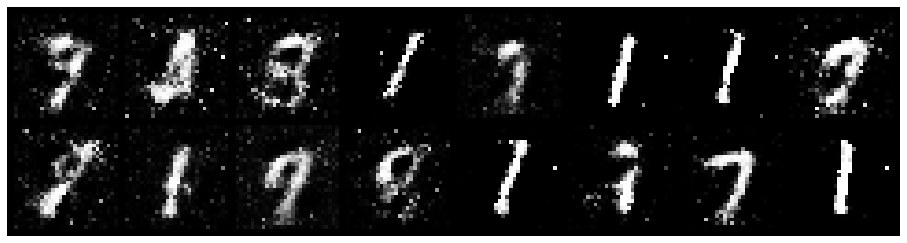

Epoch: [23/50], Batch Num: [200/600]
Discriminator Loss: 0.6358, Generator Loss: 3.2676
D(x): 0.8915, D(G(z)): 0.2793


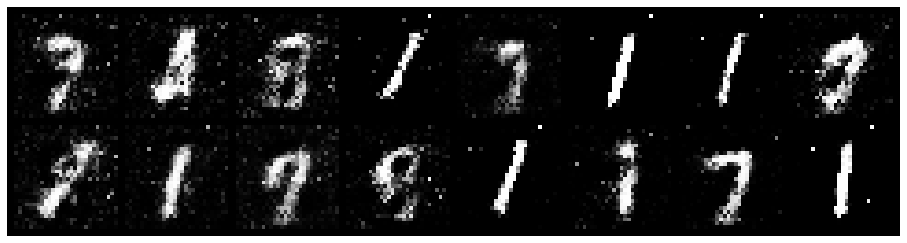

Epoch: [23/50], Batch Num: [300/600]
Discriminator Loss: 0.3515, Generator Loss: 3.4363
D(x): 0.8597, D(G(z)): 0.0932


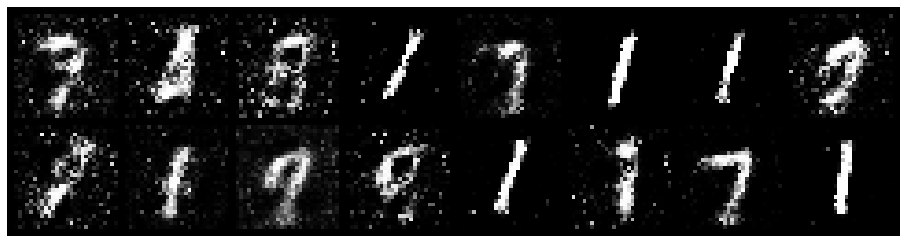

Epoch: [23/50], Batch Num: [400/600]
Discriminator Loss: 0.2772, Generator Loss: 4.7554
D(x): 0.9360, D(G(z)): 0.1347


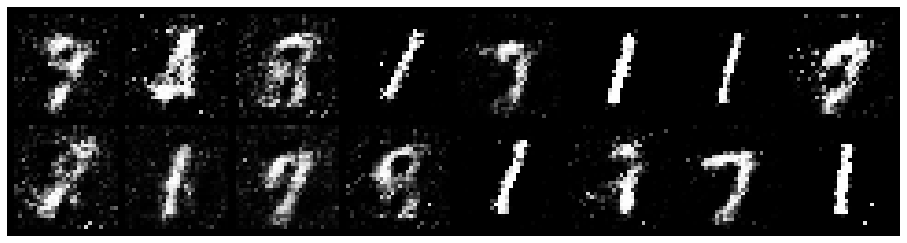

Epoch: [23/50], Batch Num: [500/600]
Discriminator Loss: 0.4403, Generator Loss: 3.3867
D(x): 0.8101, D(G(z)): 0.0536


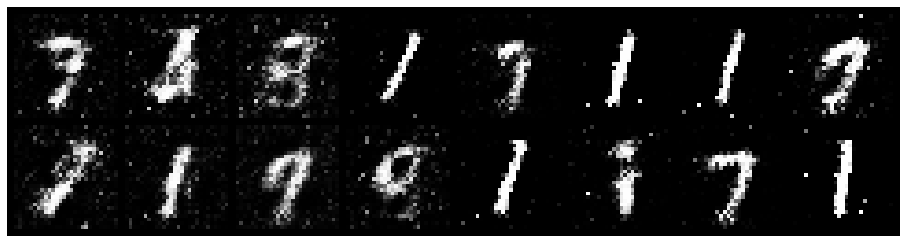

Epoch: [24/50], Batch Num: [0/600]
Discriminator Loss: 0.5140, Generator Loss: 4.4627
D(x): 0.9110, D(G(z)): 0.2163


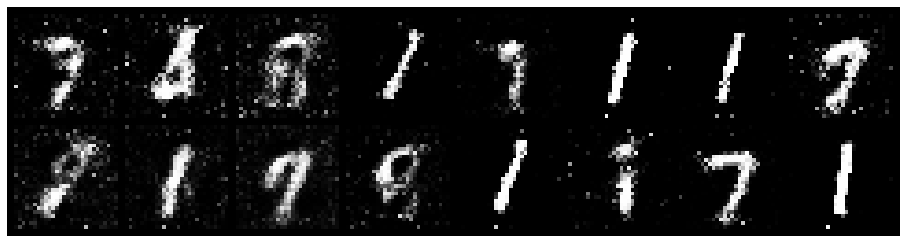

Epoch: [24/50], Batch Num: [100/600]
Discriminator Loss: 0.4837, Generator Loss: 2.5807
D(x): 0.8115, D(G(z)): 0.1303


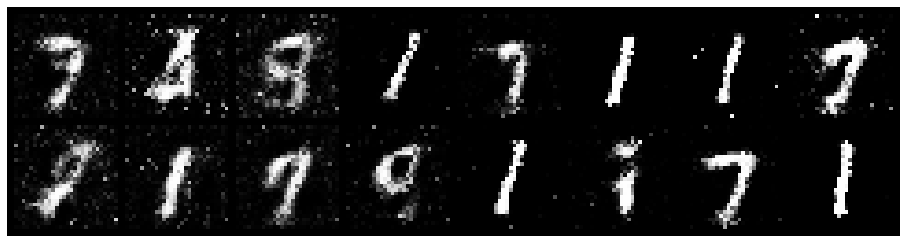

Epoch: [24/50], Batch Num: [200/600]
Discriminator Loss: 0.6332, Generator Loss: 2.4484
D(x): 0.7891, D(G(z)): 0.0772


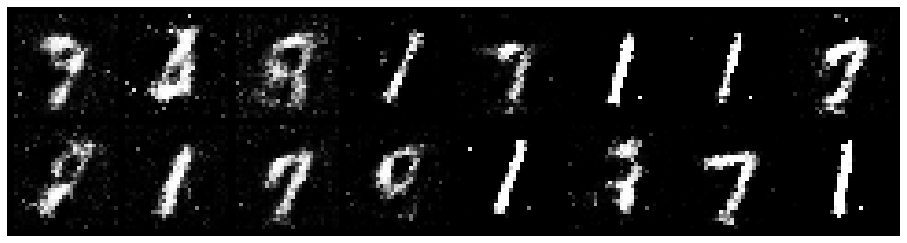

Epoch: [24/50], Batch Num: [300/600]
Discriminator Loss: 0.4704, Generator Loss: 2.6544
D(x): 0.9060, D(G(z)): 0.2381


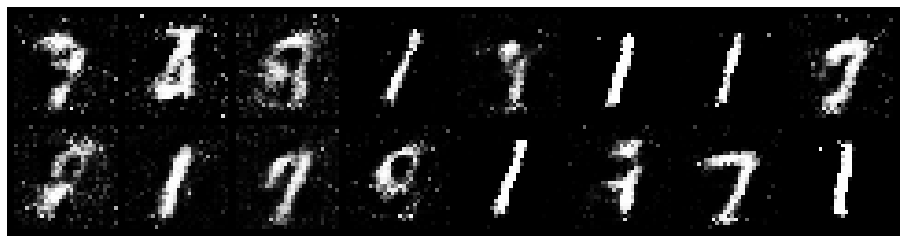

Epoch: [24/50], Batch Num: [400/600]
Discriminator Loss: 0.4489, Generator Loss: 3.4277
D(x): 0.9224, D(G(z)): 0.2111


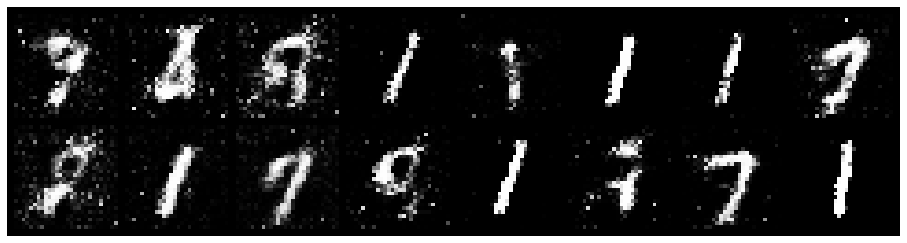

Epoch: [24/50], Batch Num: [500/600]
Discriminator Loss: 0.4988, Generator Loss: 2.5165
D(x): 0.8554, D(G(z)): 0.1766


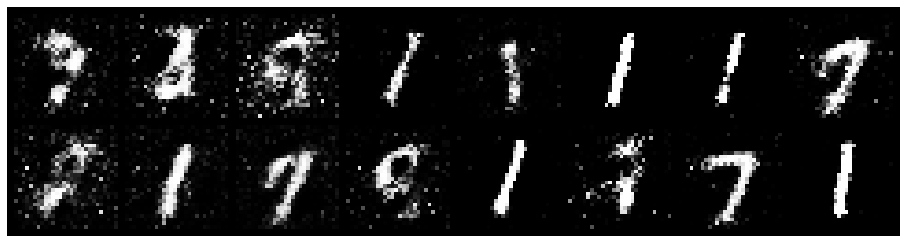

Epoch: [25/50], Batch Num: [0/600]
Discriminator Loss: 0.6137, Generator Loss: 3.0593
D(x): 0.8370, D(G(z)): 0.2119


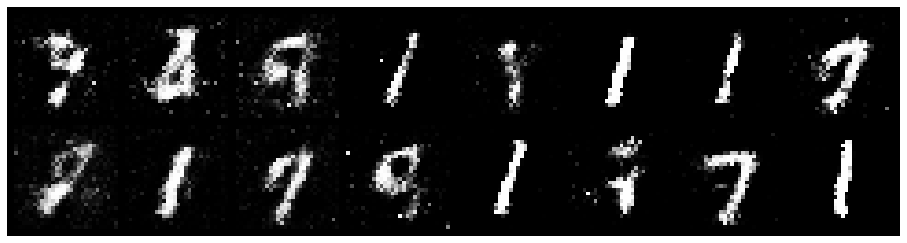

Epoch: [25/50], Batch Num: [100/600]
Discriminator Loss: 0.5393, Generator Loss: 3.2849
D(x): 0.9244, D(G(z)): 0.2644


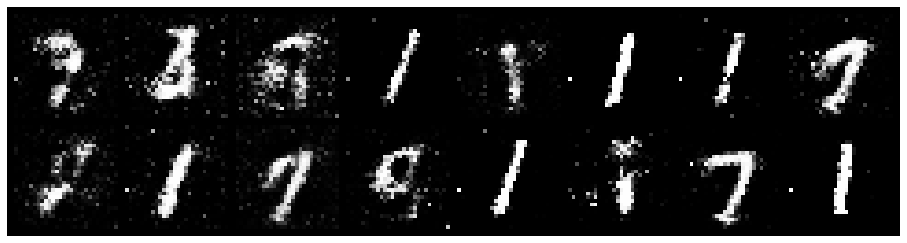

Epoch: [25/50], Batch Num: [200/600]
Discriminator Loss: 0.3107, Generator Loss: 3.0857
D(x): 0.8873, D(G(z)): 0.1158


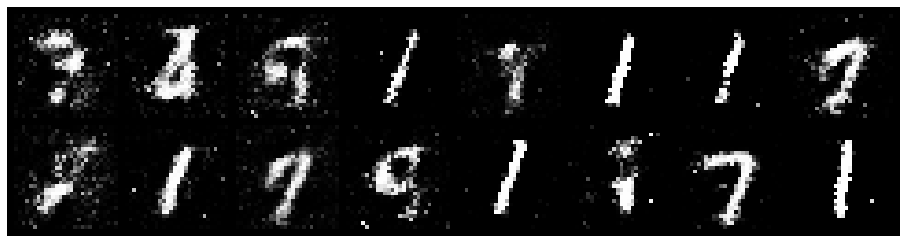

Epoch: [25/50], Batch Num: [300/600]
Discriminator Loss: 0.4044, Generator Loss: 2.6331
D(x): 0.8772, D(G(z)): 0.1547


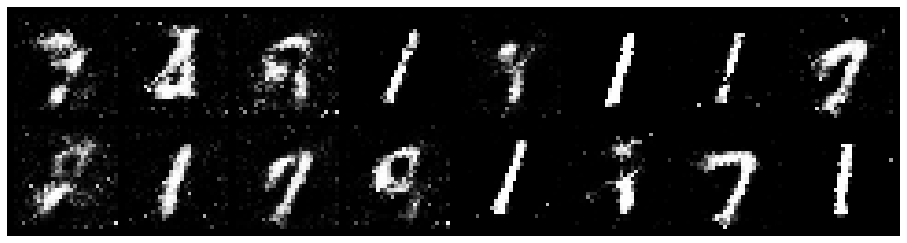

Epoch: [25/50], Batch Num: [400/600]
Discriminator Loss: 0.4682, Generator Loss: 2.9957
D(x): 0.8146, D(G(z)): 0.0560


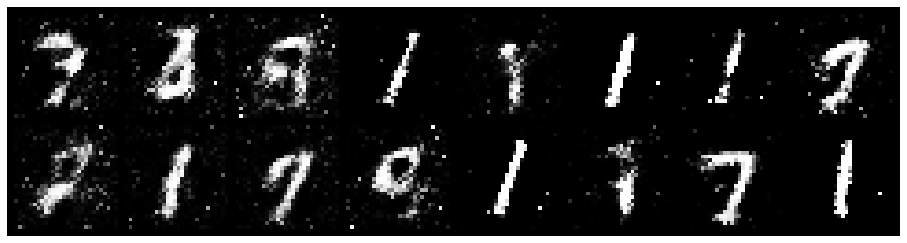

Epoch: [25/50], Batch Num: [500/600]
Discriminator Loss: 0.6724, Generator Loss: 1.8933
D(x): 0.8216, D(G(z)): 0.1333


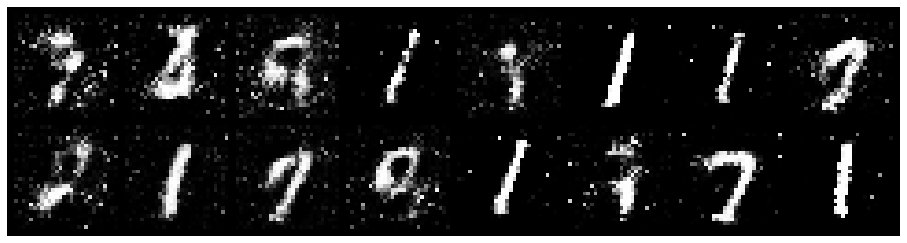

Epoch: [26/50], Batch Num: [0/600]
Discriminator Loss: 0.7683, Generator Loss: 2.6988
D(x): 0.8333, D(G(z)): 0.2715


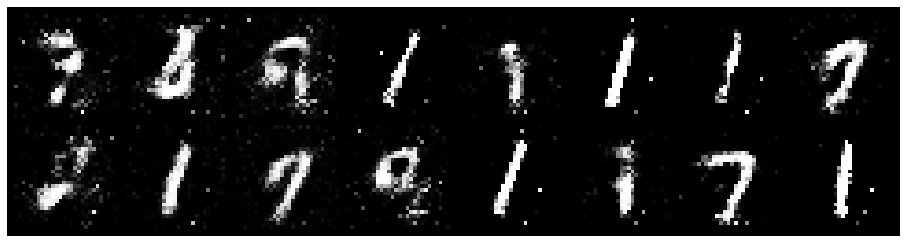

Epoch: [26/50], Batch Num: [100/600]
Discriminator Loss: 0.5074, Generator Loss: 3.2392
D(x): 0.9126, D(G(z)): 0.2545


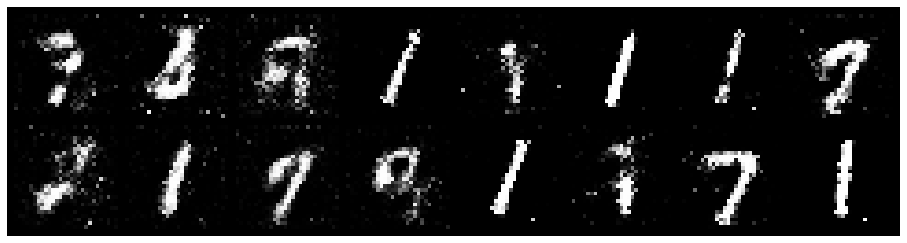

Epoch: [26/50], Batch Num: [200/600]
Discriminator Loss: 0.3614, Generator Loss: 2.9082
D(x): 0.9140, D(G(z)): 0.1777


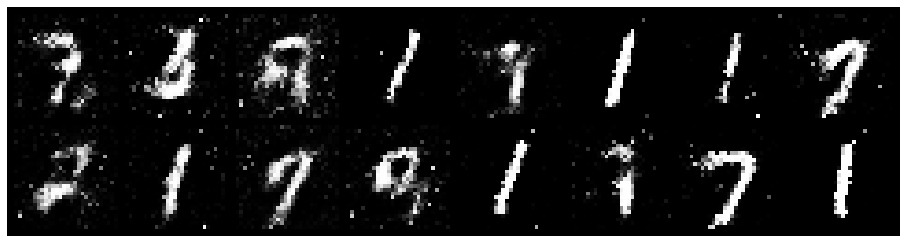

Epoch: [26/50], Batch Num: [300/600]
Discriminator Loss: 0.5723, Generator Loss: 1.4663
D(x): 0.8448, D(G(z)): 0.1712


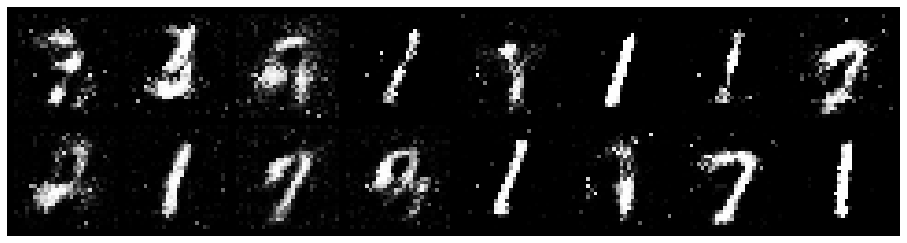

Epoch: [26/50], Batch Num: [400/600]
Discriminator Loss: 0.4265, Generator Loss: 3.0195
D(x): 0.8675, D(G(z)): 0.1403


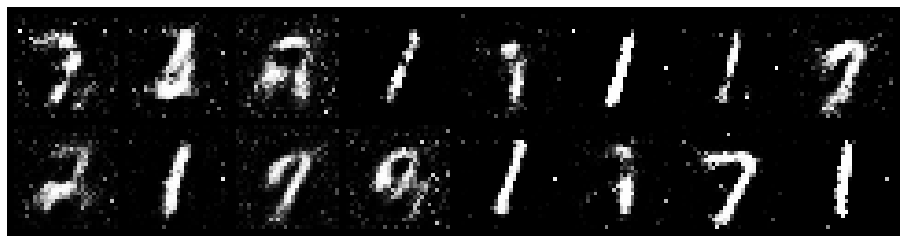

Epoch: [26/50], Batch Num: [500/600]
Discriminator Loss: 0.5165, Generator Loss: 3.8231
D(x): 0.8410, D(G(z)): 0.1371


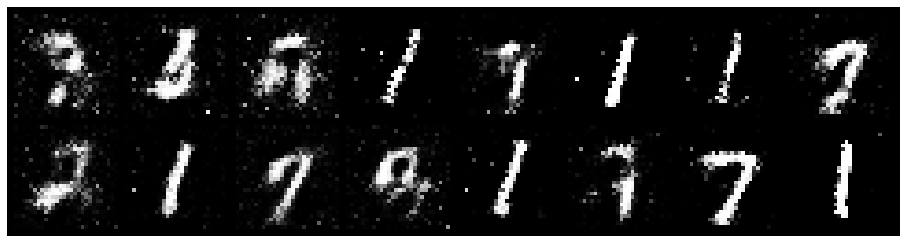

Epoch: [27/50], Batch Num: [0/600]
Discriminator Loss: 0.8574, Generator Loss: 1.5962
D(x): 0.9341, D(G(z)): 0.4316


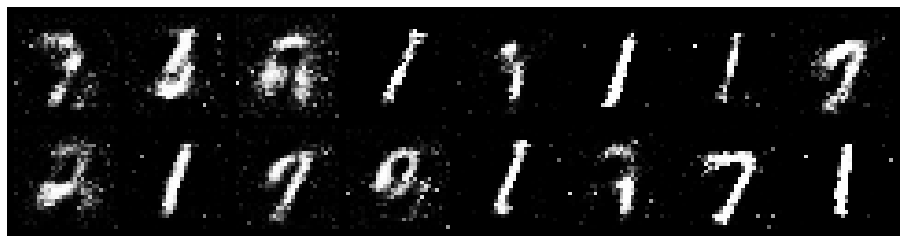

Epoch: [27/50], Batch Num: [100/600]
Discriminator Loss: 0.6656, Generator Loss: 2.3844
D(x): 0.8816, D(G(z)): 0.2797


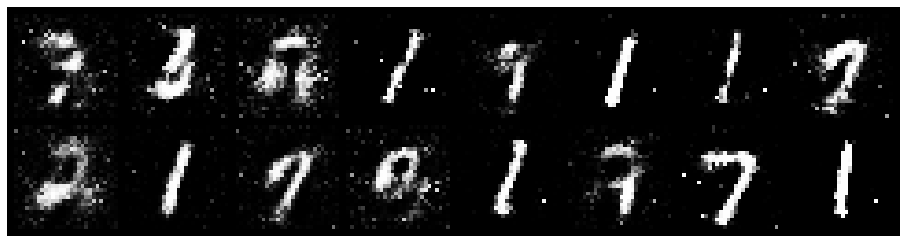

Epoch: [27/50], Batch Num: [200/600]
Discriminator Loss: 0.4489, Generator Loss: 2.6265
D(x): 0.9101, D(G(z)): 0.2333


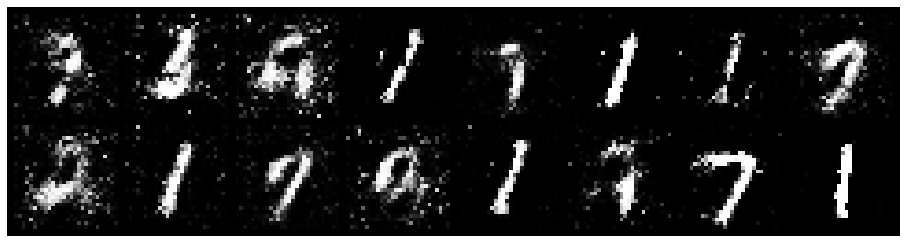

Epoch: [27/50], Batch Num: [300/600]
Discriminator Loss: 0.3966, Generator Loss: 4.1174
D(x): 0.8485, D(G(z)): 0.0577


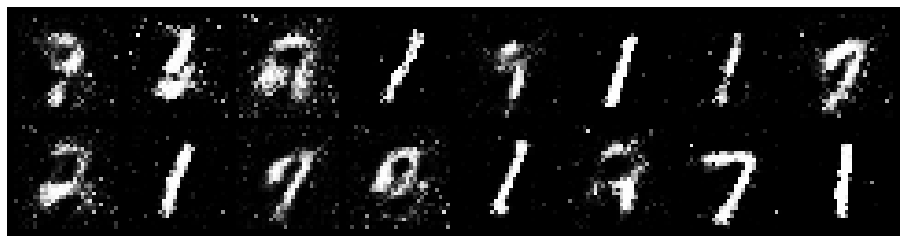

Epoch: [27/50], Batch Num: [400/600]
Discriminator Loss: 0.4362, Generator Loss: 3.1518
D(x): 0.8472, D(G(z)): 0.1514


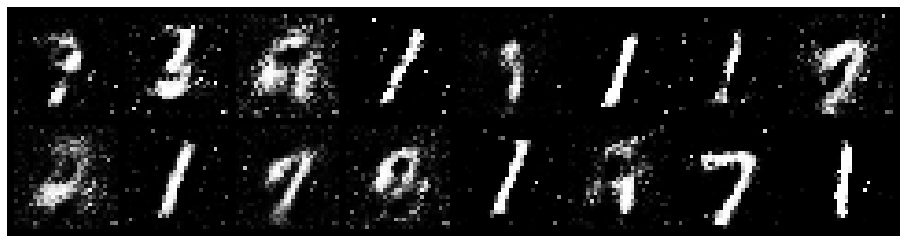

Epoch: [27/50], Batch Num: [500/600]
Discriminator Loss: 0.4353, Generator Loss: 3.1680
D(x): 0.8492, D(G(z)): 0.1110


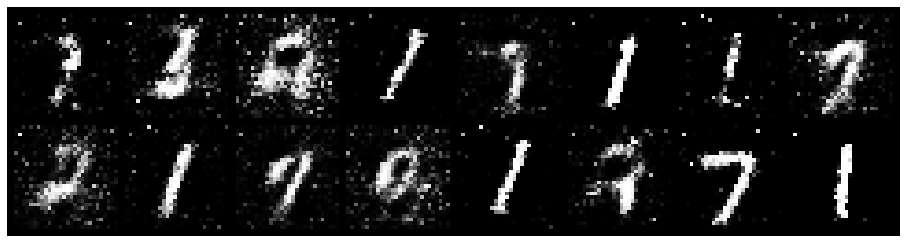

Epoch: [28/50], Batch Num: [0/600]
Discriminator Loss: 0.4894, Generator Loss: 2.5522
D(x): 0.8371, D(G(z)): 0.1101


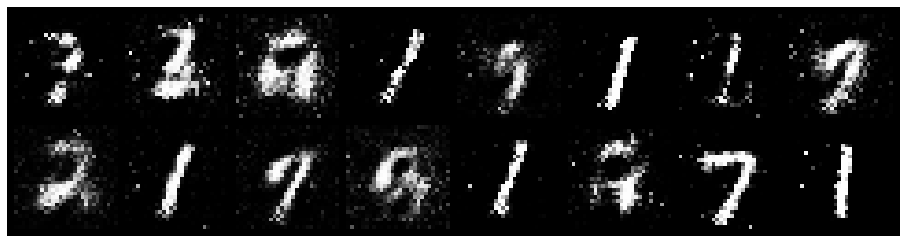

Epoch: [28/50], Batch Num: [100/600]
Discriminator Loss: 0.4580, Generator Loss: 2.7048
D(x): 0.8457, D(G(z)): 0.1456


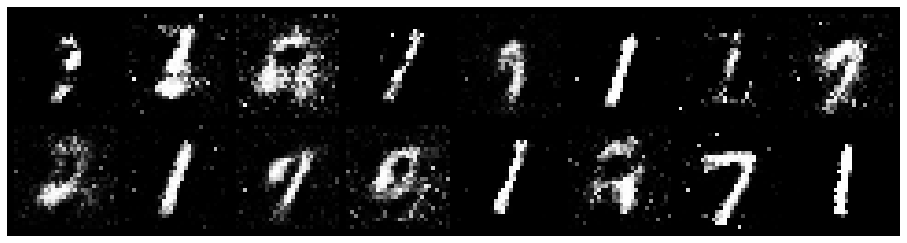

Epoch: [28/50], Batch Num: [200/600]
Discriminator Loss: 0.3823, Generator Loss: 2.5446
D(x): 0.8378, D(G(z)): 0.1040


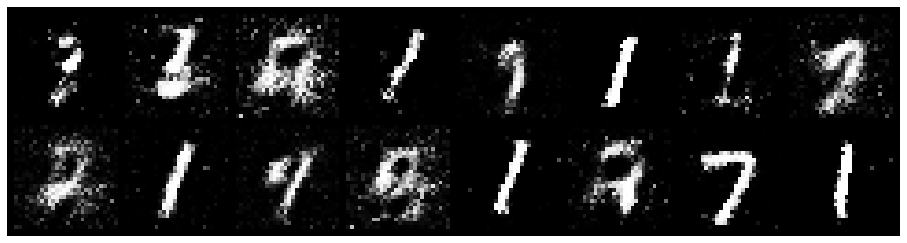

Epoch: [28/50], Batch Num: [300/600]
Discriminator Loss: 0.1499, Generator Loss: 4.1807
D(x): 0.9671, D(G(z)): 0.0869


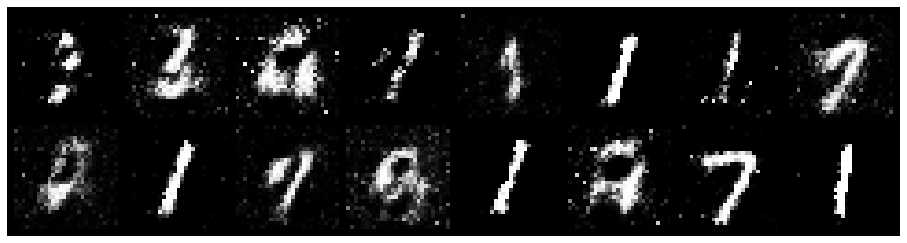

Epoch: [28/50], Batch Num: [400/600]
Discriminator Loss: 0.6358, Generator Loss: 3.0151
D(x): 0.8300, D(G(z)): 0.2542


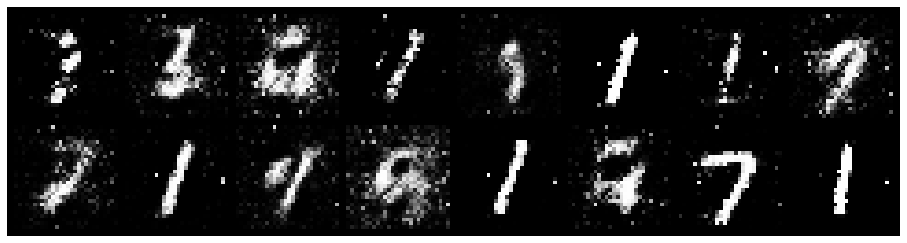

Epoch: [28/50], Batch Num: [500/600]
Discriminator Loss: 0.3833, Generator Loss: 3.8165
D(x): 0.8680, D(G(z)): 0.0872


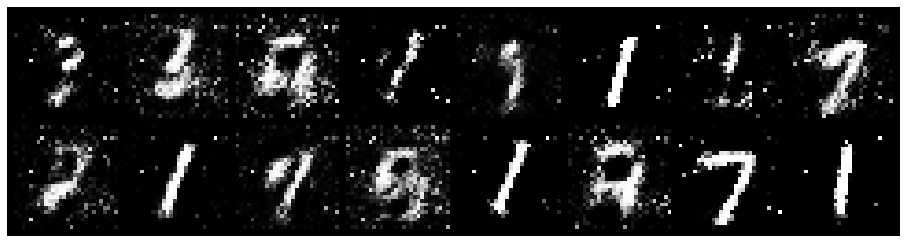

Epoch: [29/50], Batch Num: [0/600]
Discriminator Loss: 0.5614, Generator Loss: 2.4651
D(x): 0.7977, D(G(z)): 0.1487


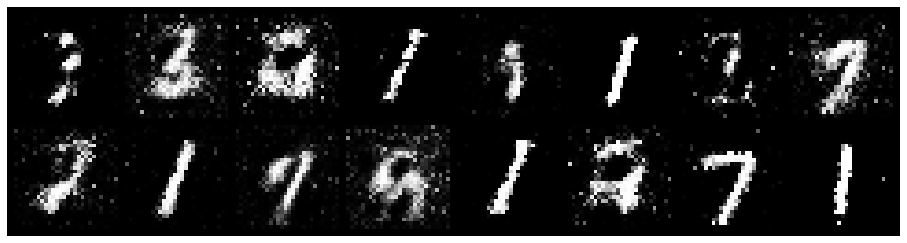

Epoch: [29/50], Batch Num: [100/600]
Discriminator Loss: 0.6114, Generator Loss: 2.6589
D(x): 0.7820, D(G(z)): 0.1243


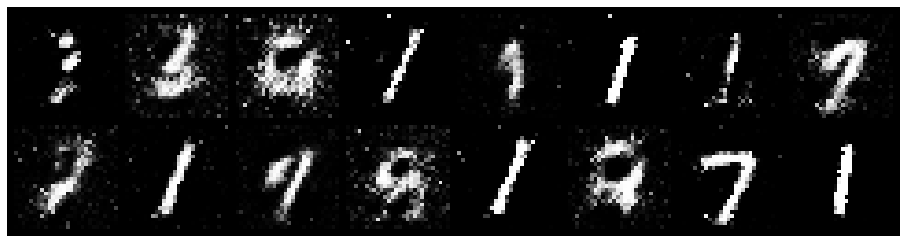

Epoch: [29/50], Batch Num: [200/600]
Discriminator Loss: 0.4426, Generator Loss: 2.8657
D(x): 0.8391, D(G(z)): 0.1394


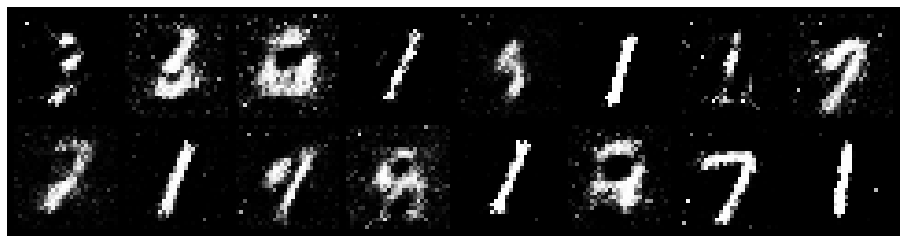

Epoch: [29/50], Batch Num: [300/600]
Discriminator Loss: 0.7045, Generator Loss: 3.8789
D(x): 0.7717, D(G(z)): 0.0809


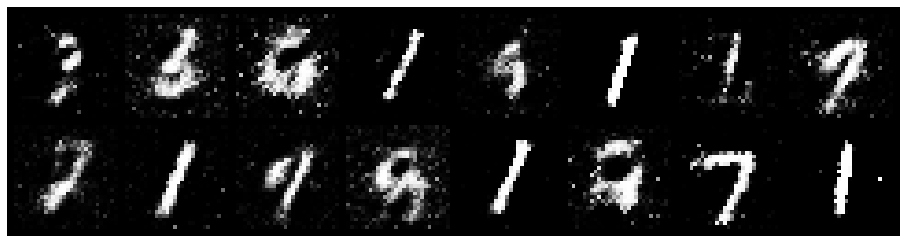

Epoch: [29/50], Batch Num: [400/600]
Discriminator Loss: 0.3699, Generator Loss: 2.4196
D(x): 0.8803, D(G(z)): 0.1241


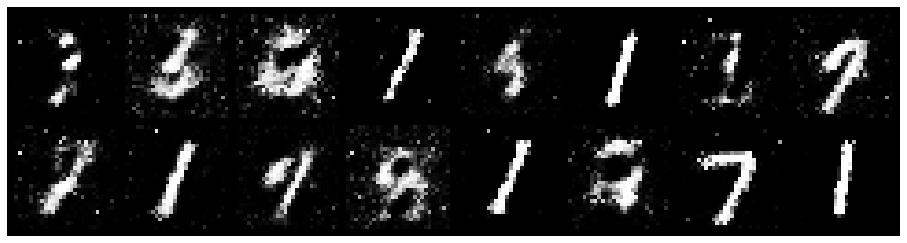

Epoch: [29/50], Batch Num: [500/600]
Discriminator Loss: 0.5999, Generator Loss: 4.0937
D(x): 0.8564, D(G(z)): 0.1684


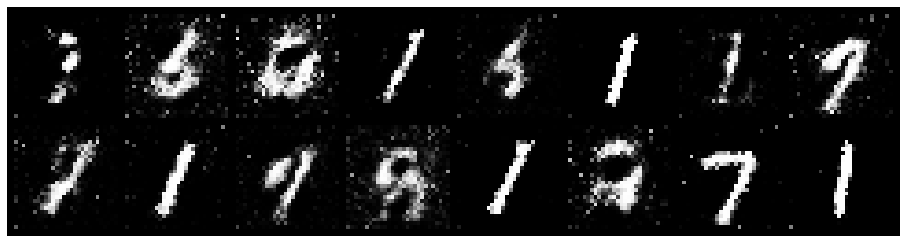

Epoch: [30/50], Batch Num: [0/600]
Discriminator Loss: 0.5662, Generator Loss: 3.1261
D(x): 0.8290, D(G(z)): 0.1781


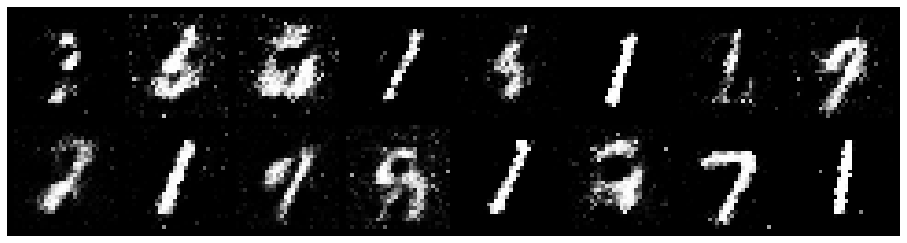

Epoch: [30/50], Batch Num: [100/600]
Discriminator Loss: 0.4730, Generator Loss: 1.9822
D(x): 0.8491, D(G(z)): 0.1549


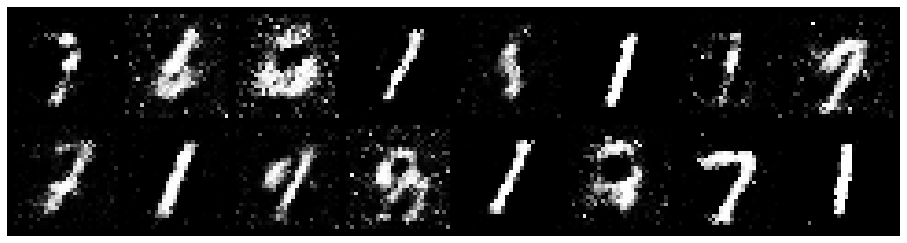

Epoch: [30/50], Batch Num: [200/600]
Discriminator Loss: 0.3731, Generator Loss: 4.0221
D(x): 0.8629, D(G(z)): 0.0971


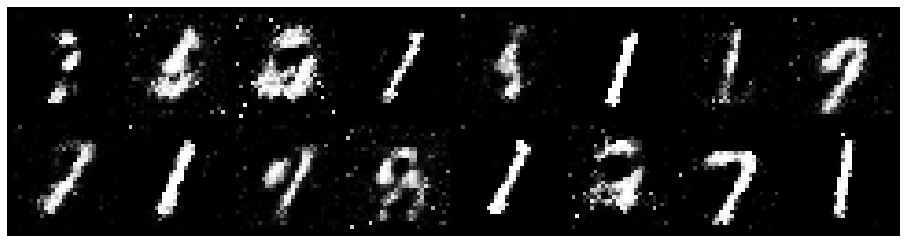

Epoch: [30/50], Batch Num: [300/600]
Discriminator Loss: 0.5959, Generator Loss: 2.4676
D(x): 0.8345, D(G(z)): 0.2086


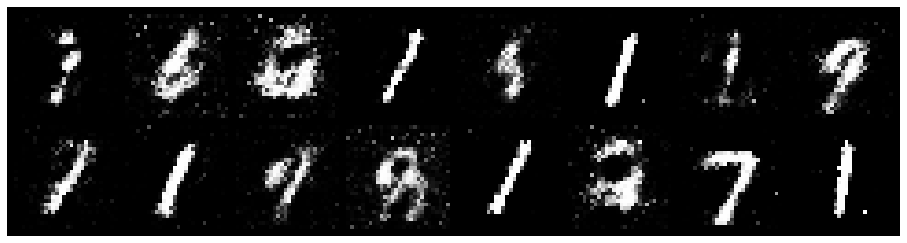

Epoch: [30/50], Batch Num: [400/600]
Discriminator Loss: 0.8343, Generator Loss: 2.5055
D(x): 0.8295, D(G(z)): 0.2524


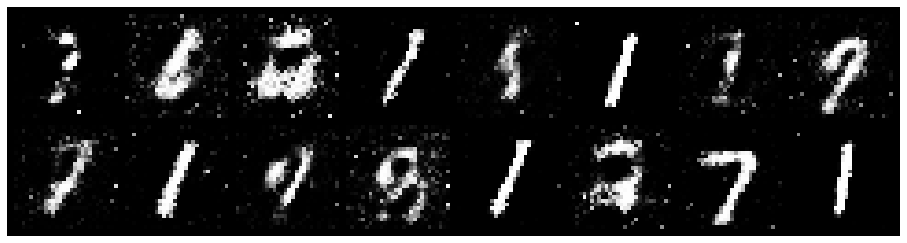

Epoch: [30/50], Batch Num: [500/600]
Discriminator Loss: 0.7795, Generator Loss: 1.7986
D(x): 0.7369, D(G(z)): 0.1653


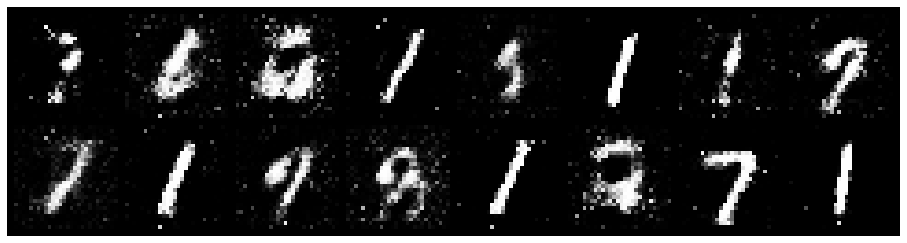

Epoch: [31/50], Batch Num: [0/600]
Discriminator Loss: 0.3589, Generator Loss: 3.2319
D(x): 0.8679, D(G(z)): 0.1226


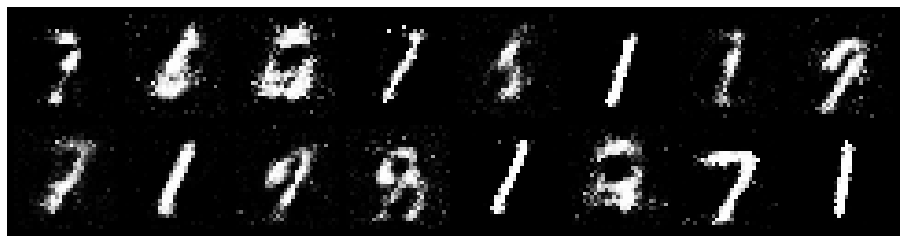

Epoch: [31/50], Batch Num: [100/600]
Discriminator Loss: 0.5301, Generator Loss: 3.8782
D(x): 0.8101, D(G(z)): 0.0777


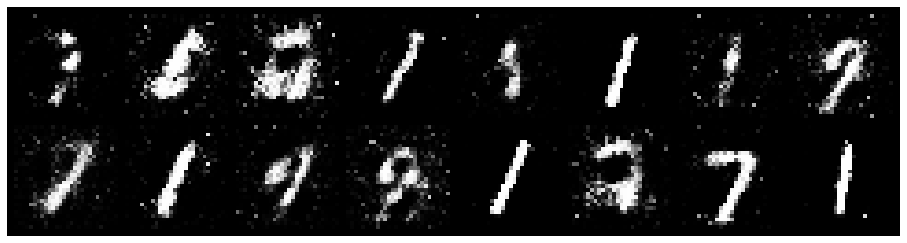

Epoch: [31/50], Batch Num: [200/600]
Discriminator Loss: 0.3932, Generator Loss: 3.0190
D(x): 0.8833, D(G(z)): 0.1613


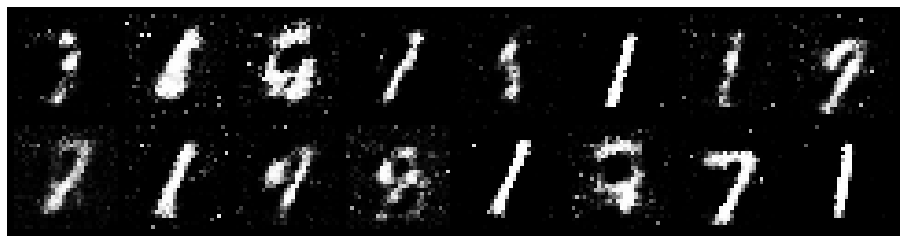

Epoch: [31/50], Batch Num: [300/600]
Discriminator Loss: 0.3531, Generator Loss: 3.0539
D(x): 0.8911, D(G(z)): 0.1444


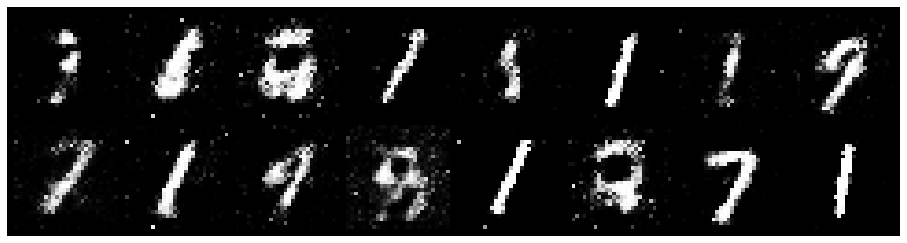

Epoch: [31/50], Batch Num: [400/600]
Discriminator Loss: 0.5199, Generator Loss: 4.7686
D(x): 0.8831, D(G(z)): 0.1803


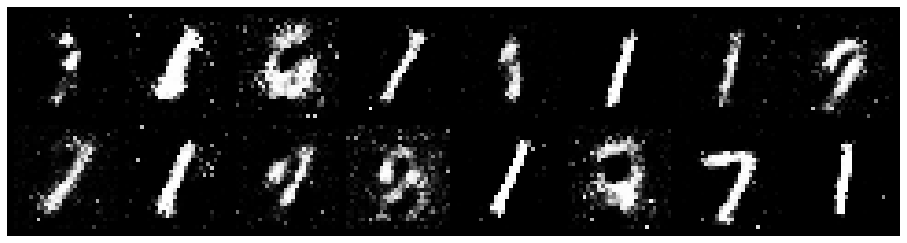

Epoch: [31/50], Batch Num: [500/600]
Discriminator Loss: 0.5969, Generator Loss: 3.2431
D(x): 0.8524, D(G(z)): 0.1722


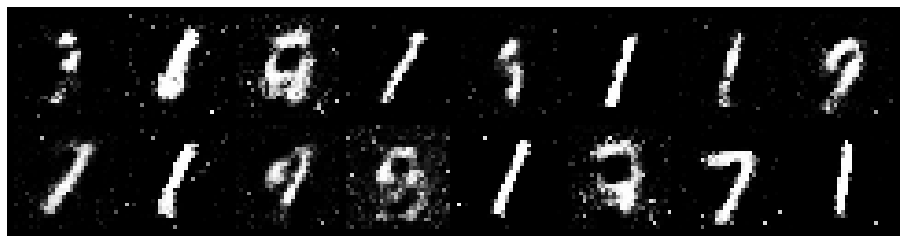

Epoch: [32/50], Batch Num: [0/600]
Discriminator Loss: 0.6554, Generator Loss: 2.6930
D(x): 0.8232, D(G(z)): 0.2000


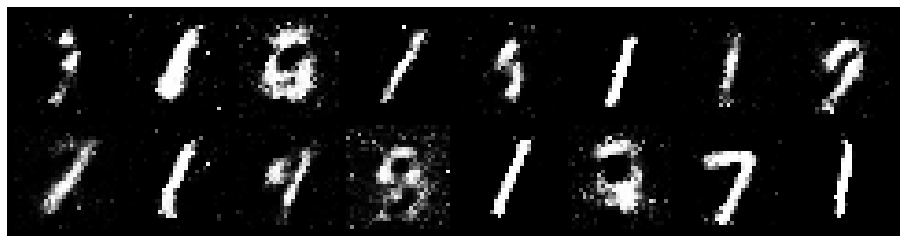

Epoch: [32/50], Batch Num: [100/600]
Discriminator Loss: 0.6474, Generator Loss: 3.2318
D(x): 0.7803, D(G(z)): 0.1054


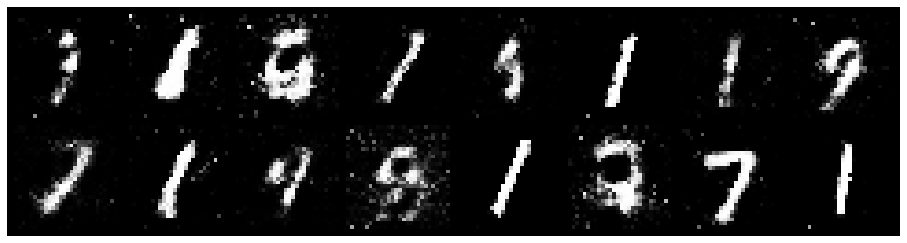

Epoch: [32/50], Batch Num: [200/600]
Discriminator Loss: 0.6418, Generator Loss: 3.5017
D(x): 0.7996, D(G(z)): 0.1568


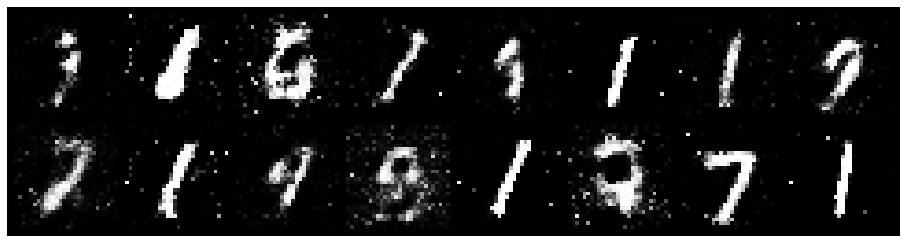

Epoch: [32/50], Batch Num: [300/600]
Discriminator Loss: 0.5087, Generator Loss: 3.5501
D(x): 0.7981, D(G(z)): 0.0800


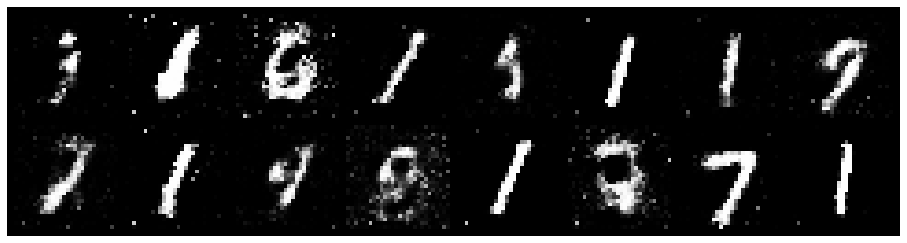

Epoch: [32/50], Batch Num: [400/600]
Discriminator Loss: 0.5675, Generator Loss: 2.3296
D(x): 0.8646, D(G(z)): 0.2228


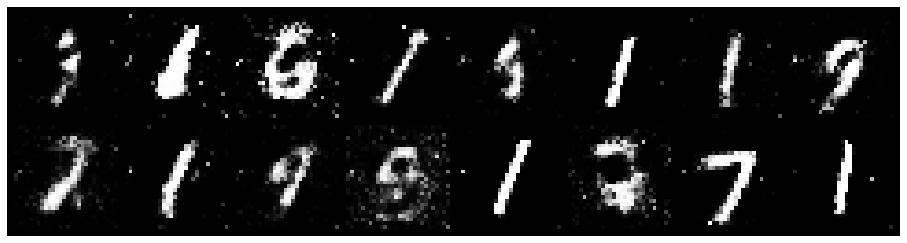

Epoch: [32/50], Batch Num: [500/600]
Discriminator Loss: 0.5331, Generator Loss: 1.9813
D(x): 0.8417, D(G(z)): 0.1785


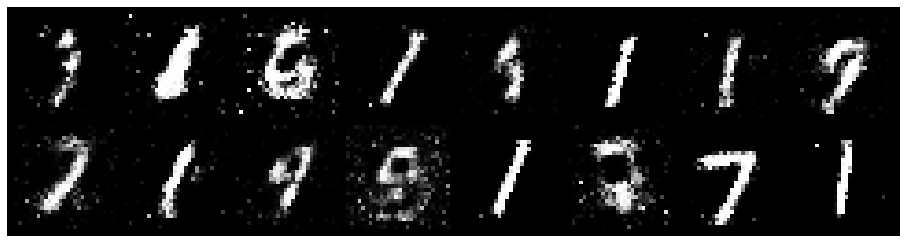

Epoch: [33/50], Batch Num: [0/600]
Discriminator Loss: 0.4877, Generator Loss: 3.4805
D(x): 0.8494, D(G(z)): 0.1213


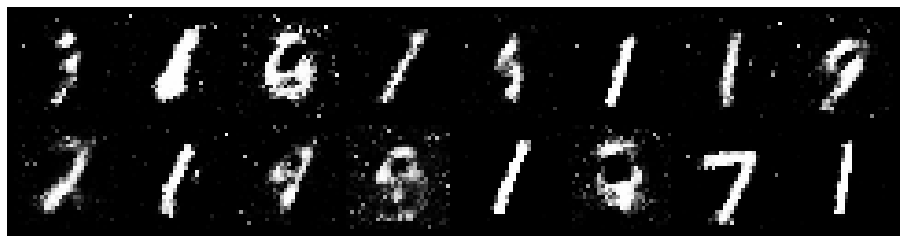

Epoch: [33/50], Batch Num: [100/600]
Discriminator Loss: 0.5690, Generator Loss: 1.7830
D(x): 0.8732, D(G(z)): 0.2230


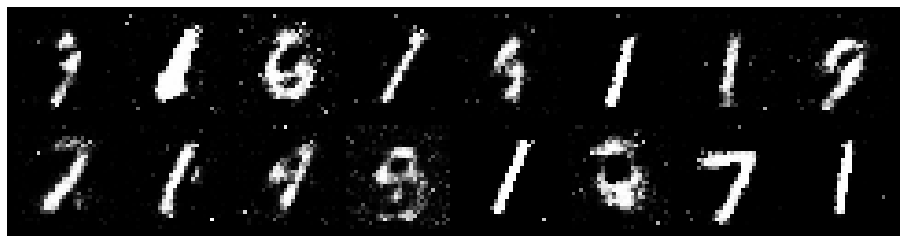

Epoch: [33/50], Batch Num: [200/600]
Discriminator Loss: 0.7101, Generator Loss: 3.2392
D(x): 0.7730, D(G(z)): 0.1579


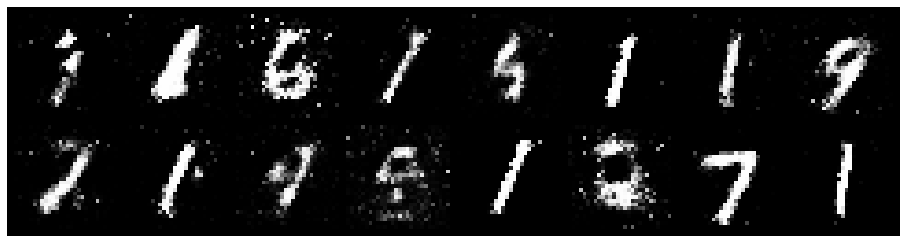

Epoch: [33/50], Batch Num: [300/600]
Discriminator Loss: 0.6449, Generator Loss: 2.6273
D(x): 0.8078, D(G(z)): 0.1689


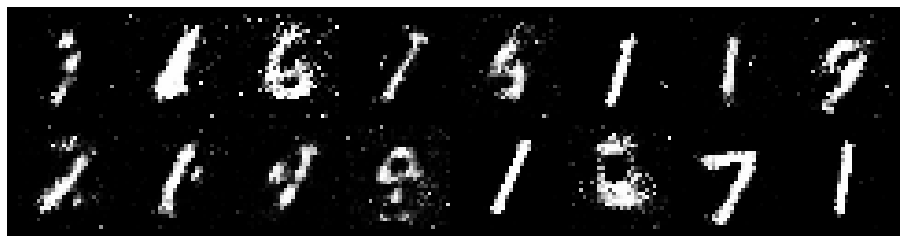

Epoch: [33/50], Batch Num: [400/600]
Discriminator Loss: 0.7478, Generator Loss: 2.2463
D(x): 0.7799, D(G(z)): 0.2272


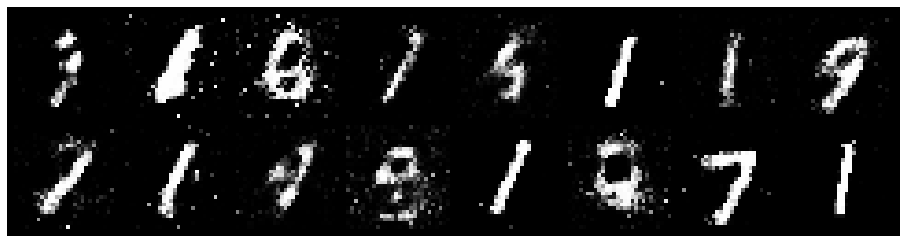

Epoch: [33/50], Batch Num: [500/600]
Discriminator Loss: 0.9463, Generator Loss: 2.9115
D(x): 0.6467, D(G(z)): 0.0666


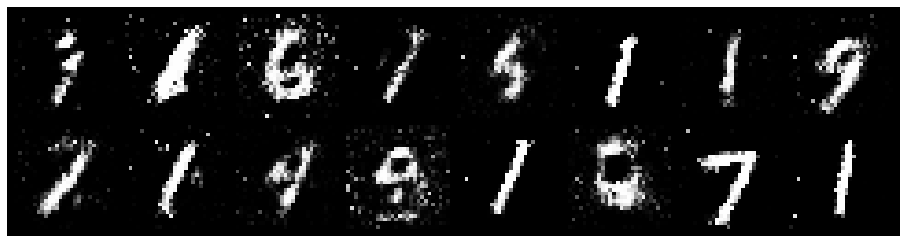

Epoch: [34/50], Batch Num: [0/600]
Discriminator Loss: 0.5158, Generator Loss: 1.8308
D(x): 0.8479, D(G(z)): 0.1855


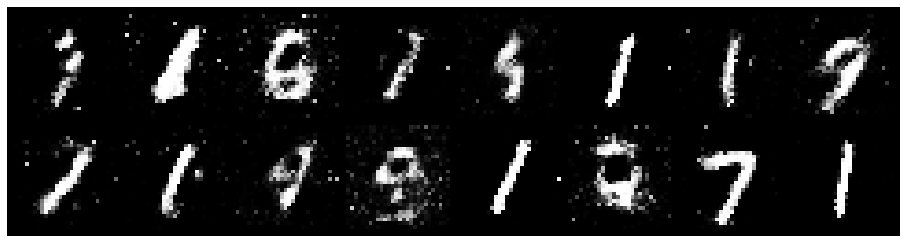

Epoch: [34/50], Batch Num: [100/600]
Discriminator Loss: 0.4680, Generator Loss: 2.9896
D(x): 0.8374, D(G(z)): 0.1448


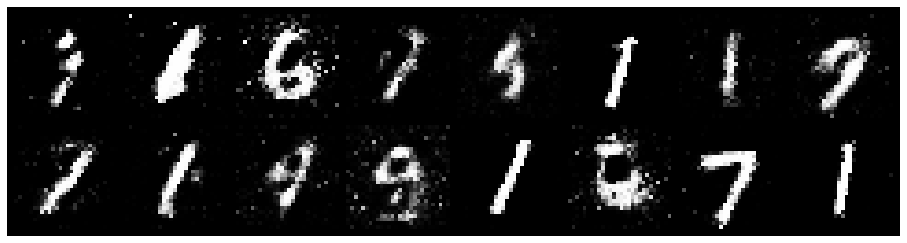

Epoch: [34/50], Batch Num: [200/600]
Discriminator Loss: 1.0263, Generator Loss: 2.9532
D(x): 0.6596, D(G(z)): 0.1726


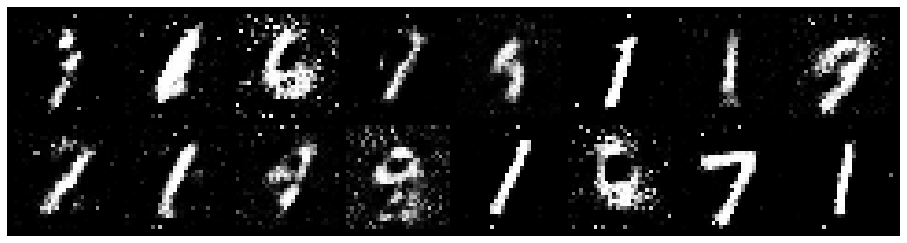

Epoch: [34/50], Batch Num: [300/600]
Discriminator Loss: 0.5802, Generator Loss: 2.2171
D(x): 0.8302, D(G(z)): 0.2088


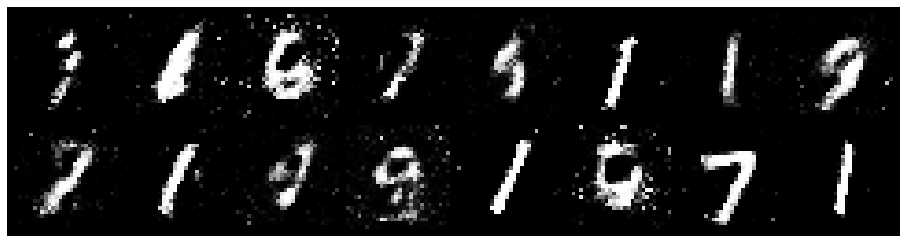

Epoch: [34/50], Batch Num: [400/600]
Discriminator Loss: 0.4537, Generator Loss: 2.3444
D(x): 0.8892, D(G(z)): 0.1926


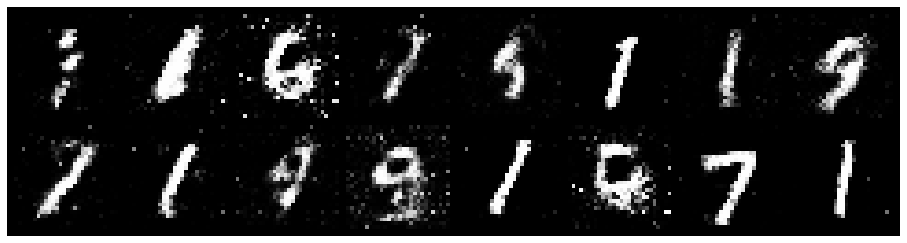

Epoch: [34/50], Batch Num: [500/600]
Discriminator Loss: 0.7864, Generator Loss: 2.7838
D(x): 0.7908, D(G(z)): 0.2458


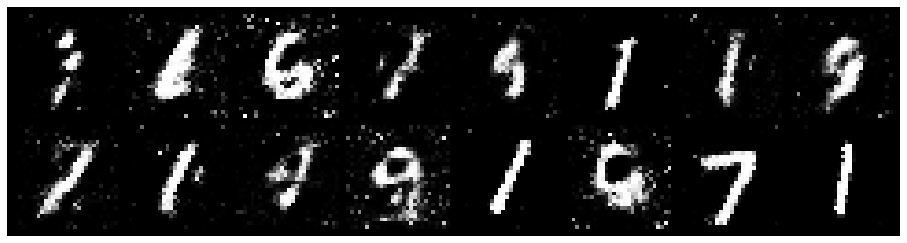

Epoch: [35/50], Batch Num: [0/600]
Discriminator Loss: 0.7071, Generator Loss: 2.4592
D(x): 0.7542, D(G(z)): 0.1497


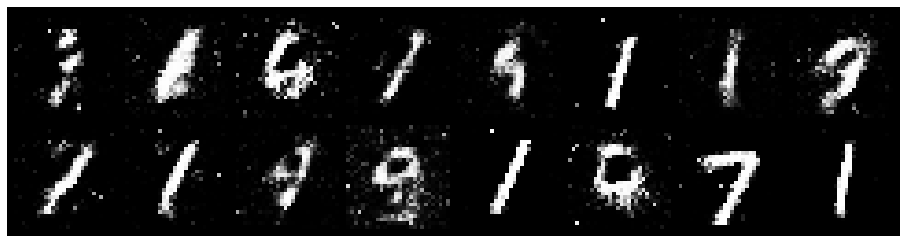

Epoch: [35/50], Batch Num: [100/600]
Discriminator Loss: 0.4201, Generator Loss: 3.3466
D(x): 0.8453, D(G(z)): 0.1245


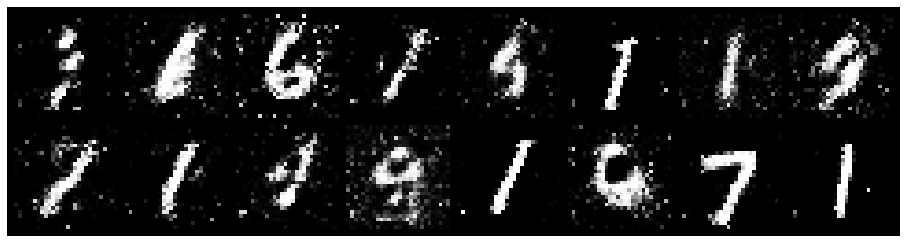

Epoch: [35/50], Batch Num: [200/600]
Discriminator Loss: 0.5631, Generator Loss: 2.7123
D(x): 0.8050, D(G(z)): 0.1850


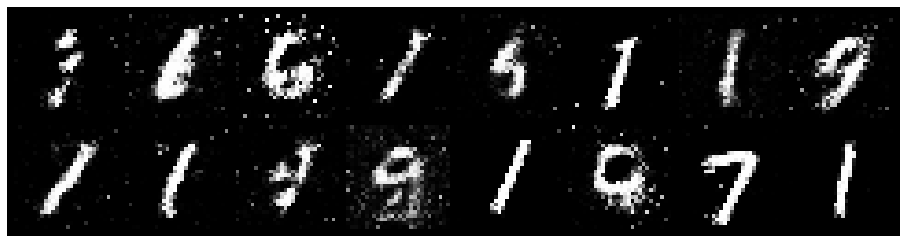

Epoch: [35/50], Batch Num: [300/600]
Discriminator Loss: 0.6387, Generator Loss: 4.2445
D(x): 0.8995, D(G(z)): 0.2711


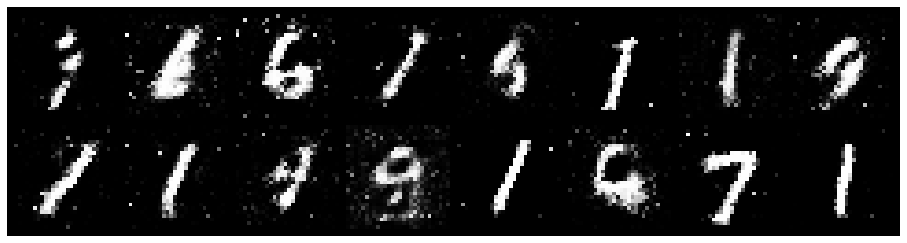

Epoch: [35/50], Batch Num: [400/600]
Discriminator Loss: 0.6267, Generator Loss: 2.2943
D(x): 0.7995, D(G(z)): 0.1885


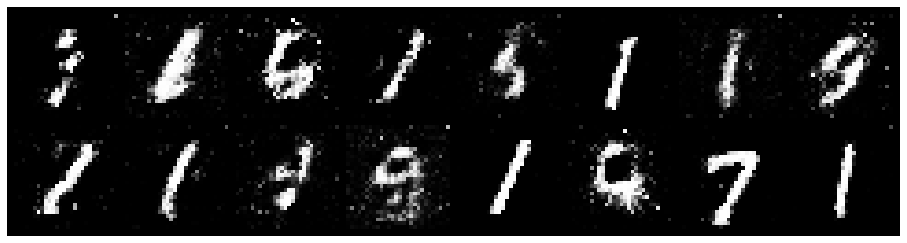

Epoch: [35/50], Batch Num: [500/600]
Discriminator Loss: 0.6329, Generator Loss: 3.6545
D(x): 0.8274, D(G(z)): 0.2214


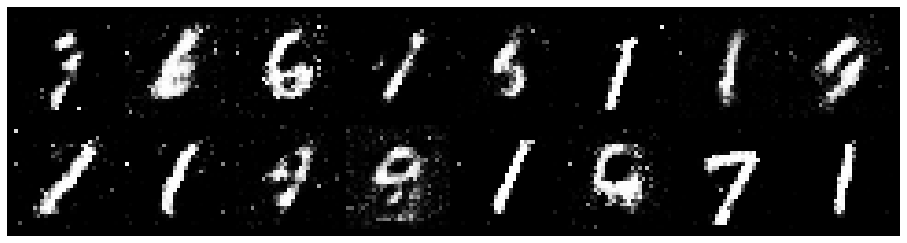

Epoch: [36/50], Batch Num: [0/600]
Discriminator Loss: 0.5652, Generator Loss: 2.5459
D(x): 0.7657, D(G(z)): 0.0787


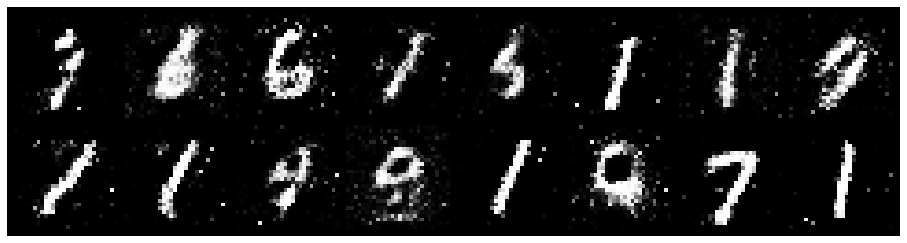

Epoch: [36/50], Batch Num: [100/600]
Discriminator Loss: 0.8646, Generator Loss: 3.1833
D(x): 0.8988, D(G(z)): 0.3532


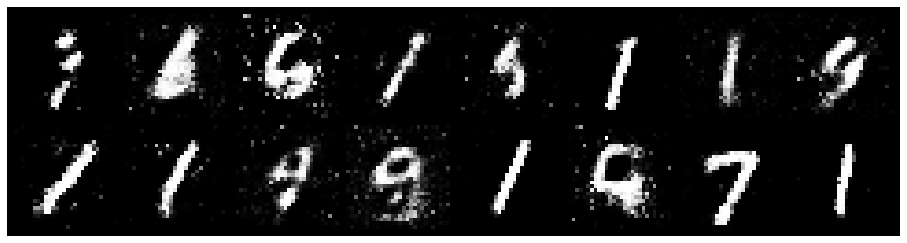

Epoch: [36/50], Batch Num: [200/600]
Discriminator Loss: 0.8527, Generator Loss: 2.1203
D(x): 0.6937, D(G(z)): 0.1899


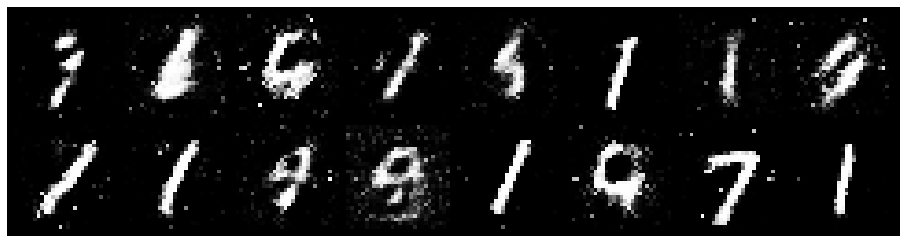

Epoch: [36/50], Batch Num: [300/600]
Discriminator Loss: 0.3658, Generator Loss: 2.4035
D(x): 0.8985, D(G(z)): 0.1737


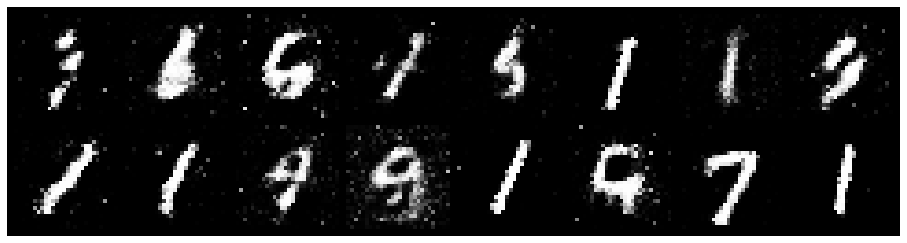

Epoch: [36/50], Batch Num: [400/600]
Discriminator Loss: 0.5556, Generator Loss: 2.3000
D(x): 0.8544, D(G(z)): 0.2052


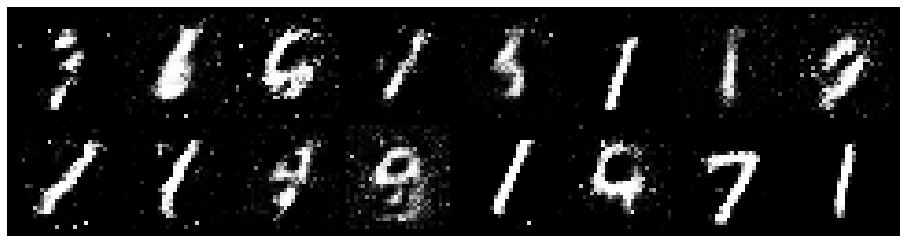

Epoch: [36/50], Batch Num: [500/600]
Discriminator Loss: 0.8937, Generator Loss: 3.5013
D(x): 0.8801, D(G(z)): 0.3569


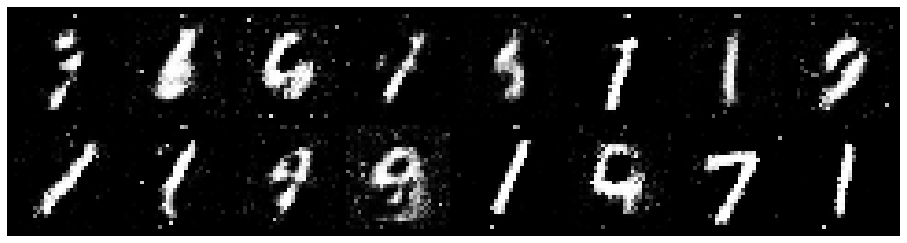

Epoch: [37/50], Batch Num: [0/600]
Discriminator Loss: 0.7047, Generator Loss: 1.9856
D(x): 0.8053, D(G(z)): 0.2519


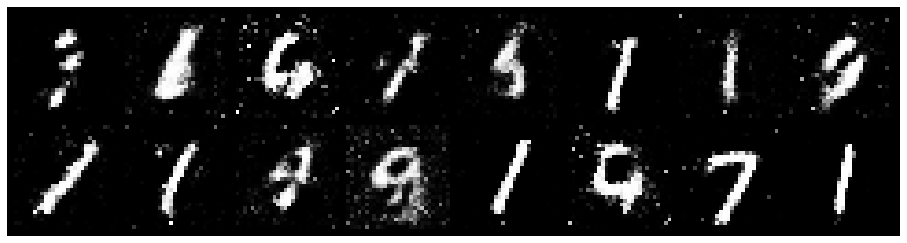

Epoch: [37/50], Batch Num: [100/600]
Discriminator Loss: 0.8325, Generator Loss: 3.4923
D(x): 0.8443, D(G(z)): 0.2491


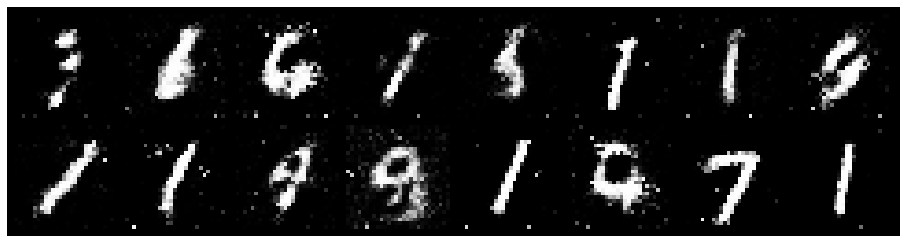

Epoch: [37/50], Batch Num: [200/600]
Discriminator Loss: 0.5230, Generator Loss: 2.1491
D(x): 0.8517, D(G(z)): 0.2121


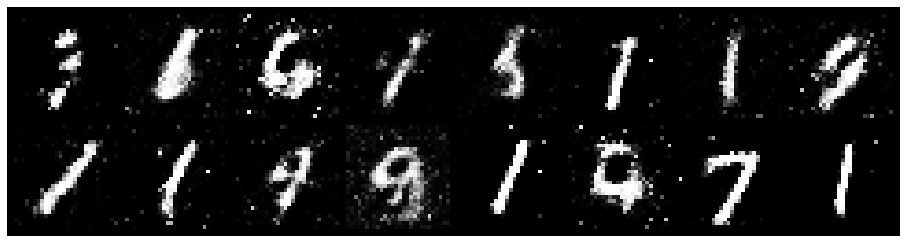

Epoch: [37/50], Batch Num: [300/600]
Discriminator Loss: 0.6007, Generator Loss: 2.2413
D(x): 0.7768, D(G(z)): 0.1242


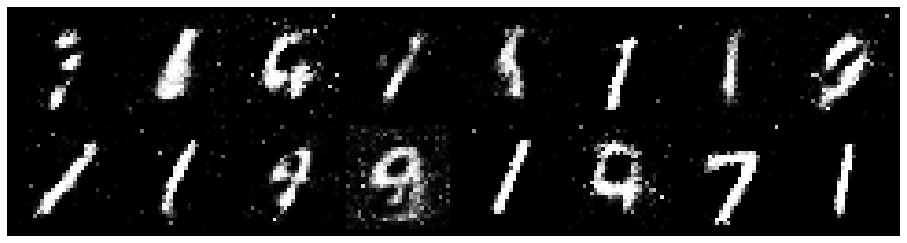

Epoch: [37/50], Batch Num: [400/600]
Discriminator Loss: 0.6388, Generator Loss: 2.1436
D(x): 0.7706, D(G(z)): 0.1502


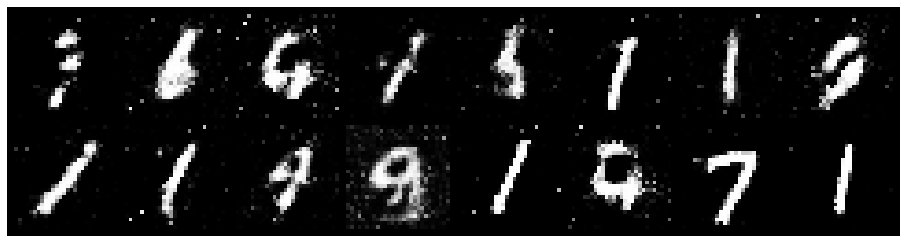

Epoch: [37/50], Batch Num: [500/600]
Discriminator Loss: 0.6018, Generator Loss: 2.2229
D(x): 0.8193, D(G(z)): 0.1792


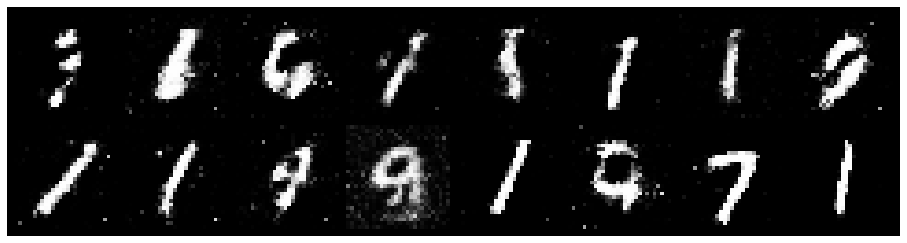

Epoch: [38/50], Batch Num: [0/600]
Discriminator Loss: 0.4371, Generator Loss: 2.9827
D(x): 0.8607, D(G(z)): 0.1591


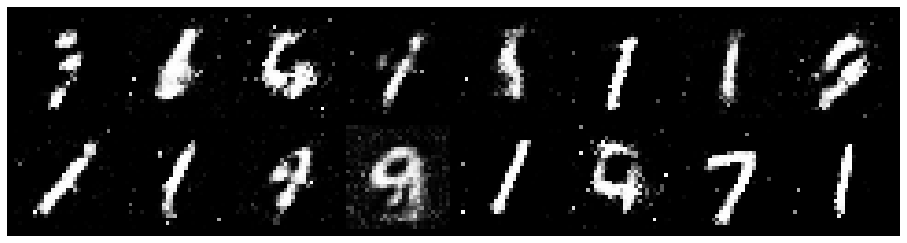

Epoch: [38/50], Batch Num: [100/600]
Discriminator Loss: 0.5959, Generator Loss: 2.7486
D(x): 0.8229, D(G(z)): 0.1688


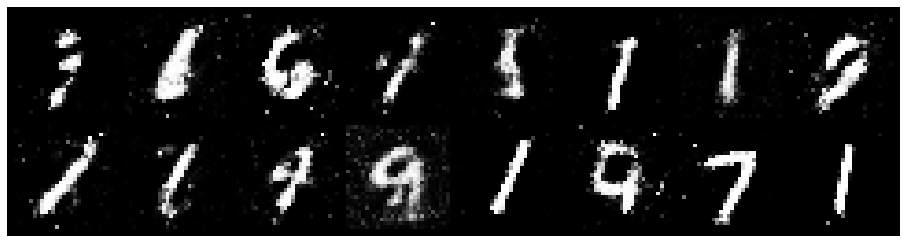

Epoch: [38/50], Batch Num: [200/600]
Discriminator Loss: 0.4997, Generator Loss: 2.4753
D(x): 0.8532, D(G(z)): 0.1872


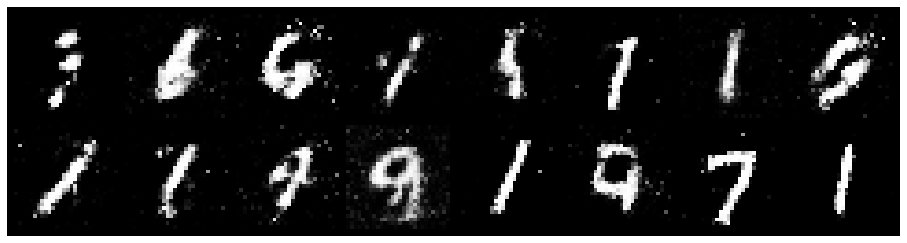

Epoch: [38/50], Batch Num: [300/600]
Discriminator Loss: 0.5632, Generator Loss: 2.2723
D(x): 0.7895, D(G(z)): 0.1389


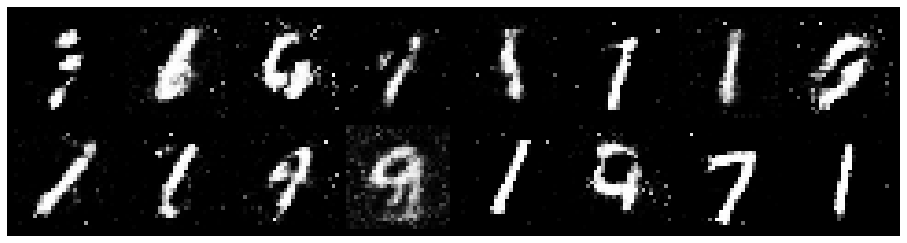

Epoch: [38/50], Batch Num: [400/600]
Discriminator Loss: 0.7976, Generator Loss: 1.9363
D(x): 0.7776, D(G(z)): 0.2332


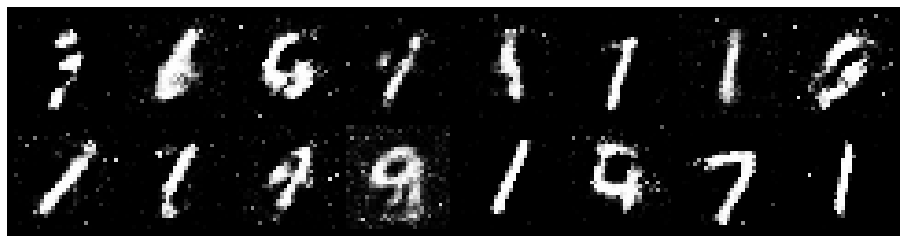

Epoch: [38/50], Batch Num: [500/600]
Discriminator Loss: 0.6261, Generator Loss: 1.6940
D(x): 0.8197, D(G(z)): 0.2545


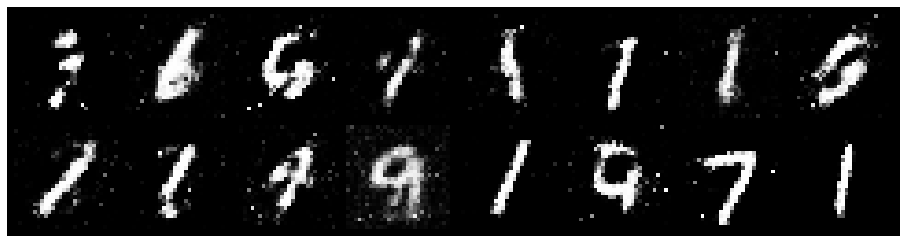

Epoch: [39/50], Batch Num: [0/600]
Discriminator Loss: 0.5869, Generator Loss: 2.9887
D(x): 0.8225, D(G(z)): 0.1765


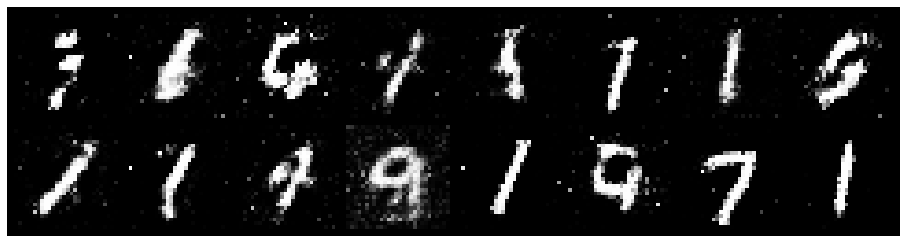

Epoch: [39/50], Batch Num: [100/600]
Discriminator Loss: 0.5929, Generator Loss: 2.2552
D(x): 0.8145, D(G(z)): 0.1696


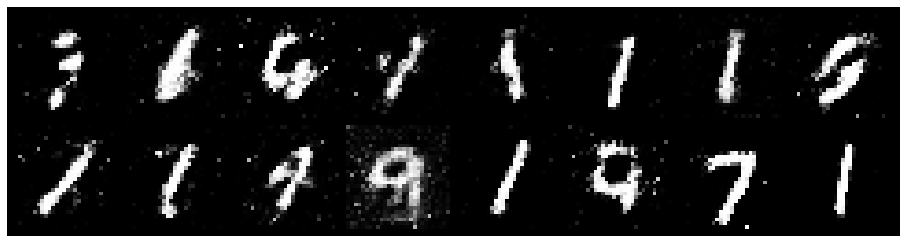

Epoch: [39/50], Batch Num: [200/600]
Discriminator Loss: 0.6571, Generator Loss: 2.7129
D(x): 0.7878, D(G(z)): 0.1878


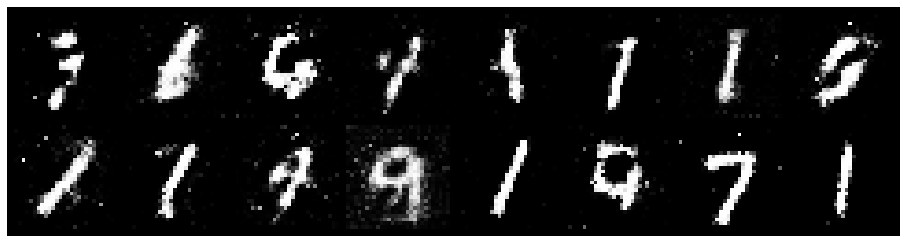

Epoch: [39/50], Batch Num: [300/600]
Discriminator Loss: 0.7347, Generator Loss: 2.4434
D(x): 0.6949, D(G(z)): 0.1296


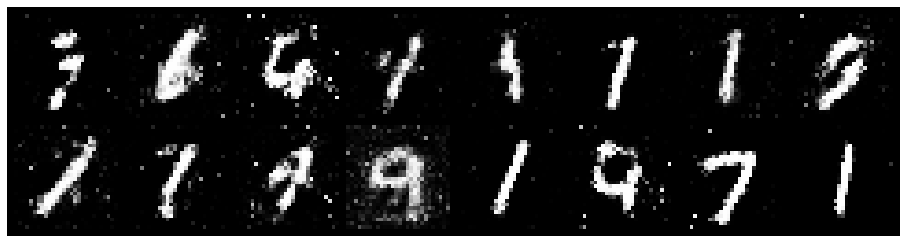

Epoch: [39/50], Batch Num: [400/600]
Discriminator Loss: 0.6996, Generator Loss: 3.5835
D(x): 0.7281, D(G(z)): 0.0972


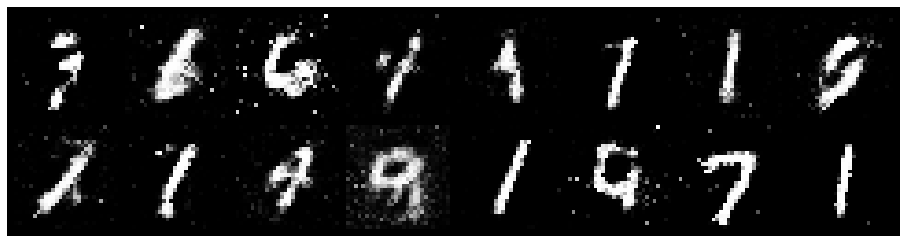

Epoch: [39/50], Batch Num: [500/600]
Discriminator Loss: 0.7706, Generator Loss: 2.3336
D(x): 0.8397, D(G(z)): 0.2894


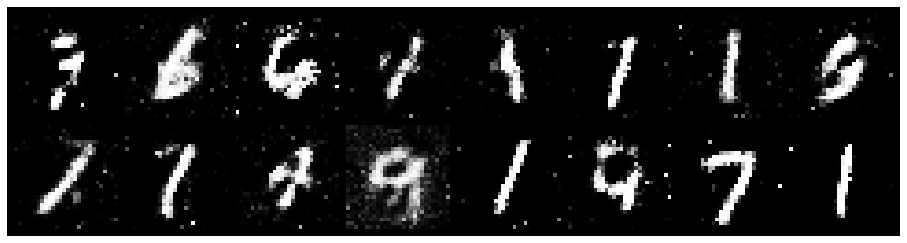

Epoch: [40/50], Batch Num: [0/600]
Discriminator Loss: 0.4672, Generator Loss: 2.6563
D(x): 0.8612, D(G(z)): 0.1580


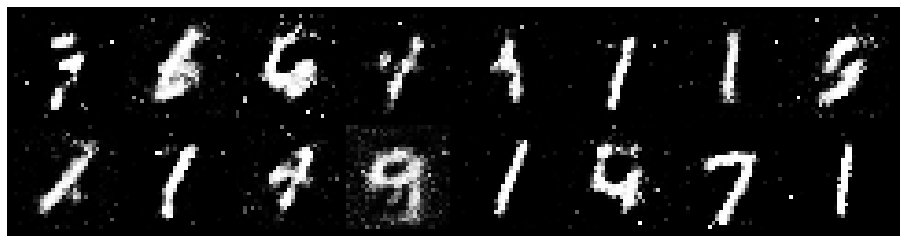

Epoch: [40/50], Batch Num: [100/600]
Discriminator Loss: 0.4752, Generator Loss: 2.4827
D(x): 0.8209, D(G(z)): 0.1457


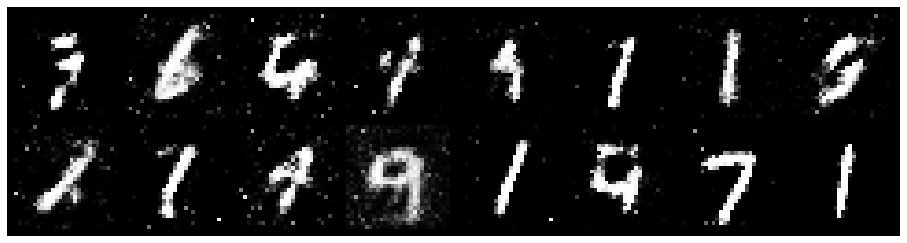

Epoch: [40/50], Batch Num: [200/600]
Discriminator Loss: 0.6054, Generator Loss: 1.6899
D(x): 0.8963, D(G(z)): 0.3079


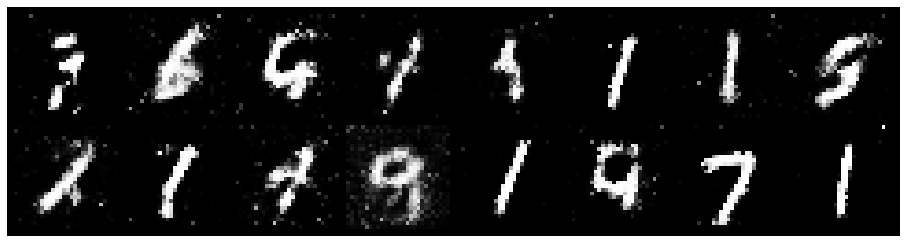

Epoch: [40/50], Batch Num: [300/600]
Discriminator Loss: 0.6249, Generator Loss: 2.4622
D(x): 0.7682, D(G(z)): 0.1188


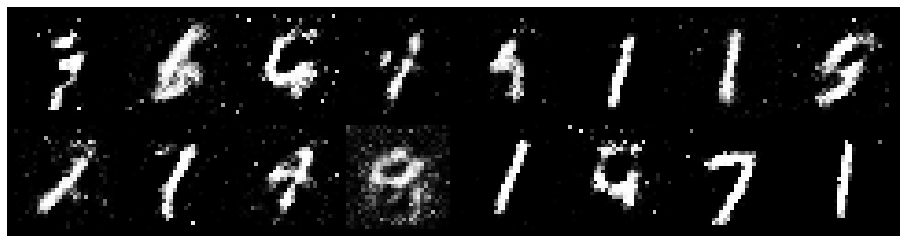

Epoch: [40/50], Batch Num: [400/600]
Discriminator Loss: 0.8982, Generator Loss: 1.9304
D(x): 0.7026, D(G(z)): 0.2056


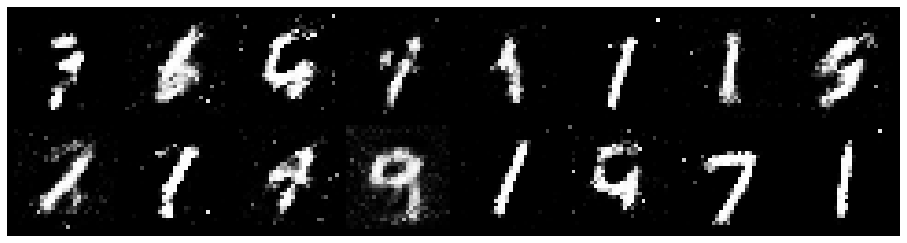

Epoch: [40/50], Batch Num: [500/600]
Discriminator Loss: 0.8678, Generator Loss: 2.8233
D(x): 0.8387, D(G(z)): 0.3233


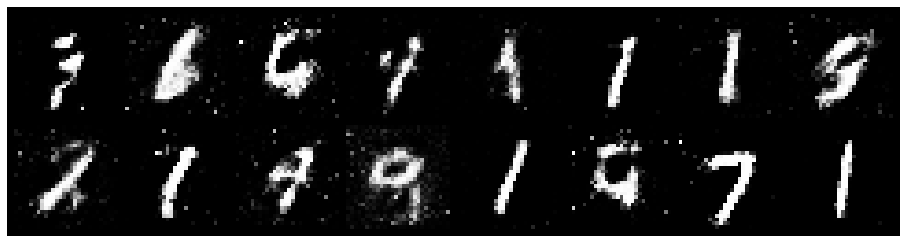

Epoch: [41/50], Batch Num: [0/600]
Discriminator Loss: 0.8333, Generator Loss: 2.6922
D(x): 0.8515, D(G(z)): 0.3401


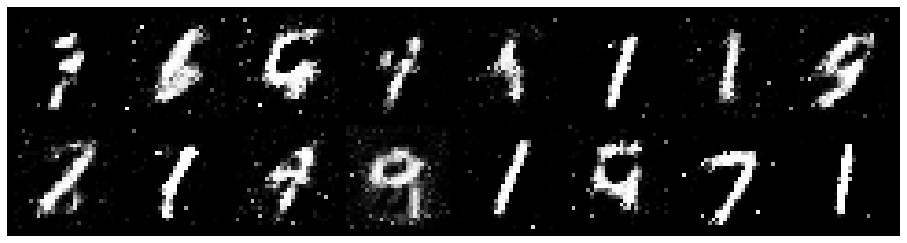

Epoch: [41/50], Batch Num: [100/600]
Discriminator Loss: 0.8601, Generator Loss: 2.9559
D(x): 0.6935, D(G(z)): 0.1340


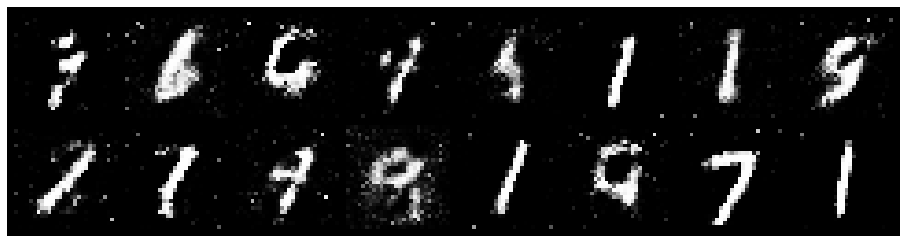

Epoch: [41/50], Batch Num: [200/600]
Discriminator Loss: 0.6825, Generator Loss: 2.2124
D(x): 0.7731, D(G(z)): 0.1873


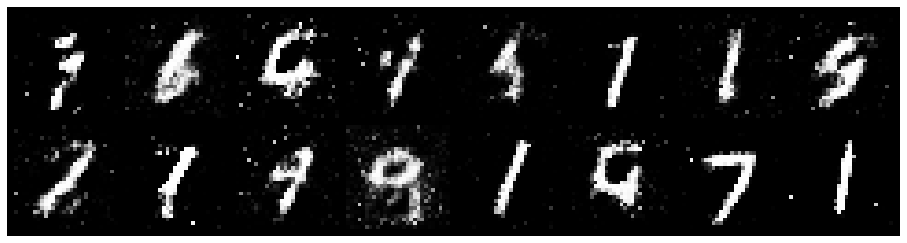

Epoch: [41/50], Batch Num: [300/600]
Discriminator Loss: 0.7965, Generator Loss: 1.8587
D(x): 0.8266, D(G(z)): 0.3210


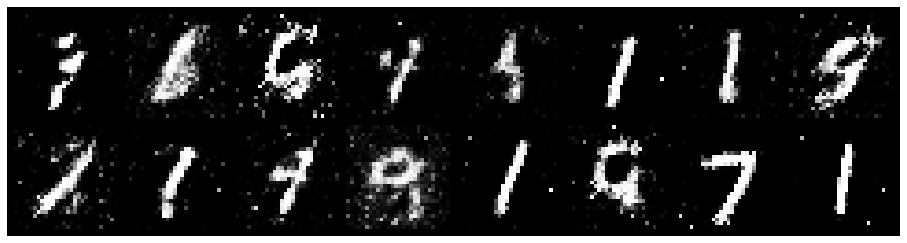

Epoch: [41/50], Batch Num: [400/600]
Discriminator Loss: 0.6496, Generator Loss: 2.4321
D(x): 0.7431, D(G(z)): 0.1119


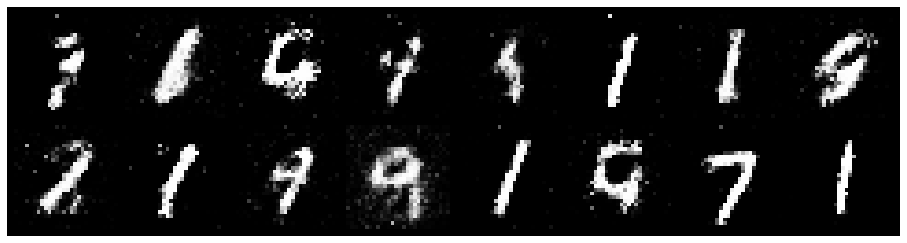

Epoch: [41/50], Batch Num: [500/600]
Discriminator Loss: 0.6145, Generator Loss: 2.1466
D(x): 0.8516, D(G(z)): 0.2681


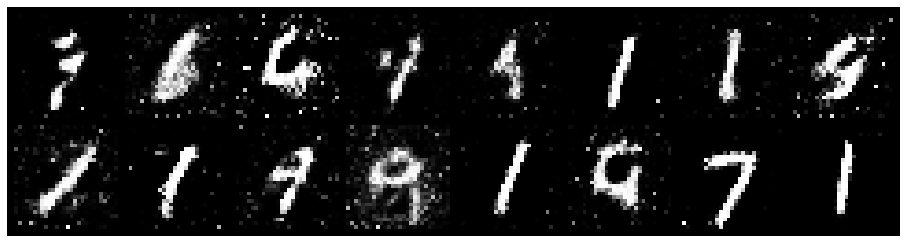

Epoch: [42/50], Batch Num: [0/600]
Discriminator Loss: 0.5491, Generator Loss: 2.7416
D(x): 0.7739, D(G(z)): 0.1303


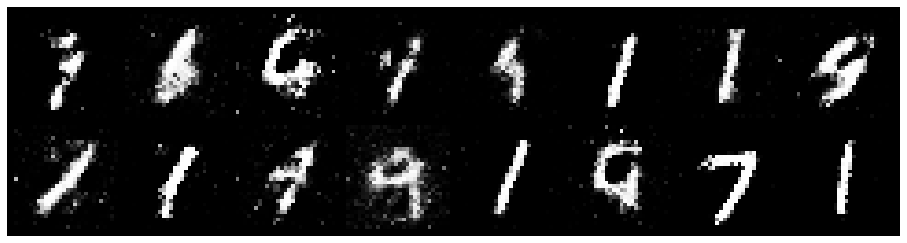

Epoch: [42/50], Batch Num: [100/600]
Discriminator Loss: 0.6091, Generator Loss: 2.7230
D(x): 0.7268, D(G(z)): 0.1345


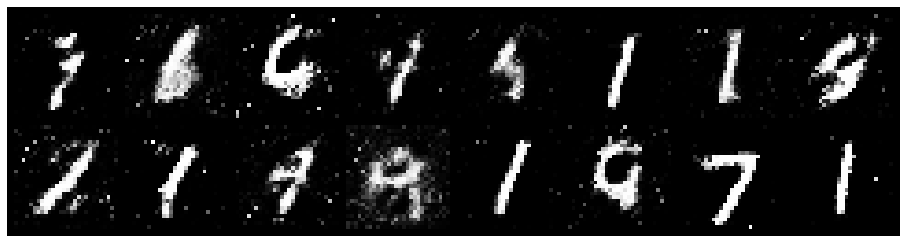

Epoch: [42/50], Batch Num: [200/600]
Discriminator Loss: 0.5901, Generator Loss: 1.5838
D(x): 0.8096, D(G(z)): 0.1983


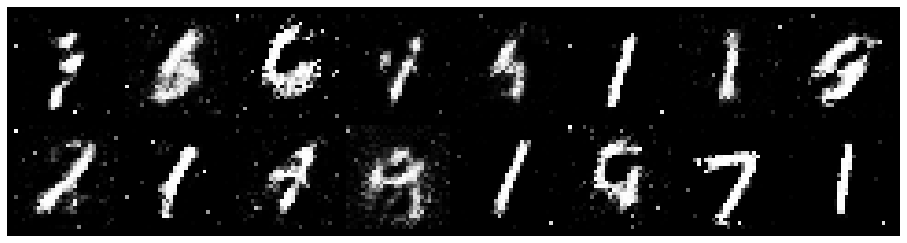

Epoch: [42/50], Batch Num: [300/600]
Discriminator Loss: 0.6735, Generator Loss: 1.5456
D(x): 0.8735, D(G(z)): 0.3073


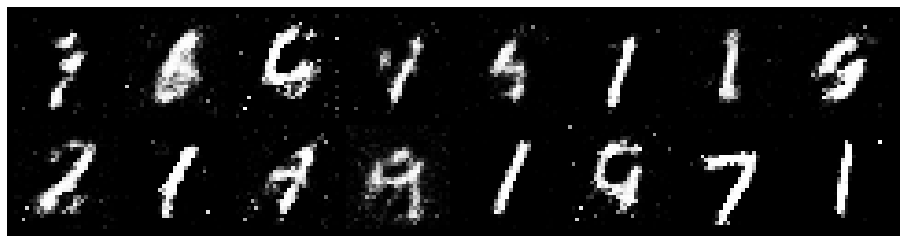

Epoch: [42/50], Batch Num: [400/600]
Discriminator Loss: 0.6971, Generator Loss: 2.3625
D(x): 0.7082, D(G(z)): 0.1320


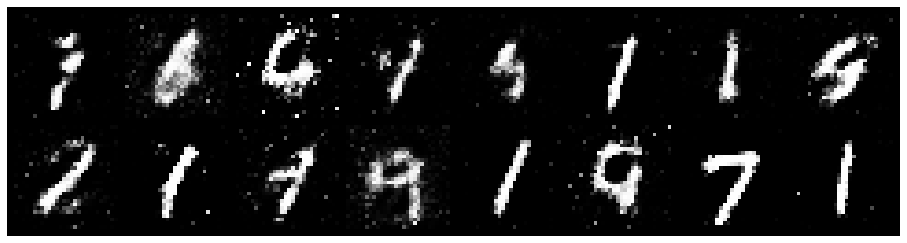

Epoch: [42/50], Batch Num: [500/600]
Discriminator Loss: 1.2272, Generator Loss: 1.9843
D(x): 0.5676, D(G(z)): 0.0605


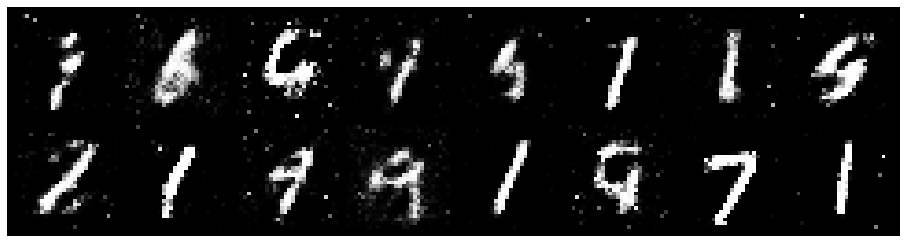

Epoch: [43/50], Batch Num: [0/600]
Discriminator Loss: 0.5103, Generator Loss: 1.9839
D(x): 0.7736, D(G(z)): 0.0834


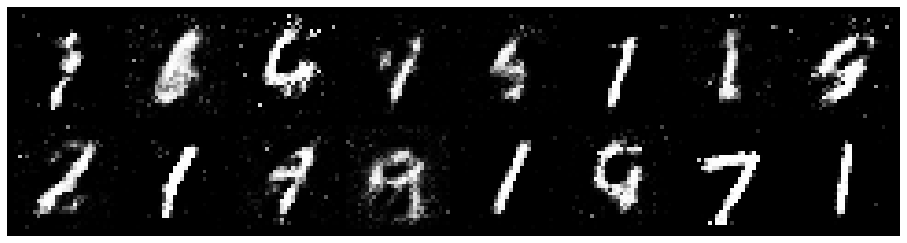

Epoch: [43/50], Batch Num: [100/600]
Discriminator Loss: 0.6512, Generator Loss: 2.5309
D(x): 0.7841, D(G(z)): 0.1701


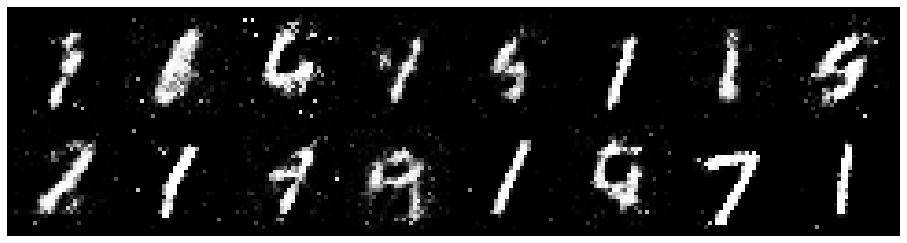

Epoch: [43/50], Batch Num: [200/600]
Discriminator Loss: 0.6579, Generator Loss: 1.3846
D(x): 0.8742, D(G(z)): 0.3217


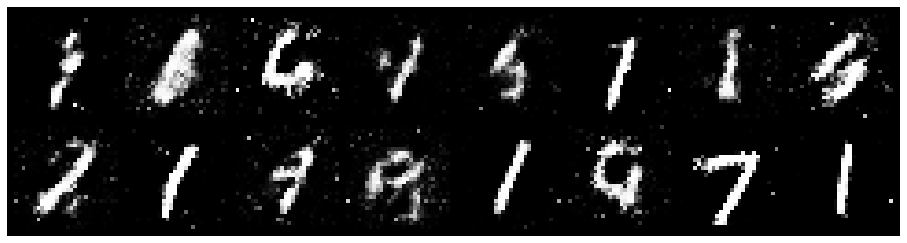

Epoch: [43/50], Batch Num: [300/600]
Discriminator Loss: 0.8178, Generator Loss: 1.5433
D(x): 0.7030, D(G(z)): 0.2273


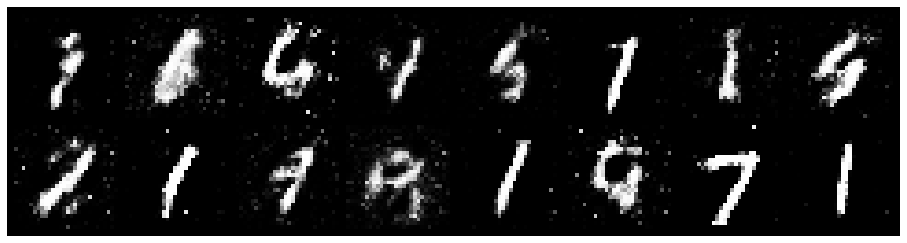

Epoch: [43/50], Batch Num: [400/600]
Discriminator Loss: 0.8759, Generator Loss: 2.1735
D(x): 0.7701, D(G(z)): 0.2549


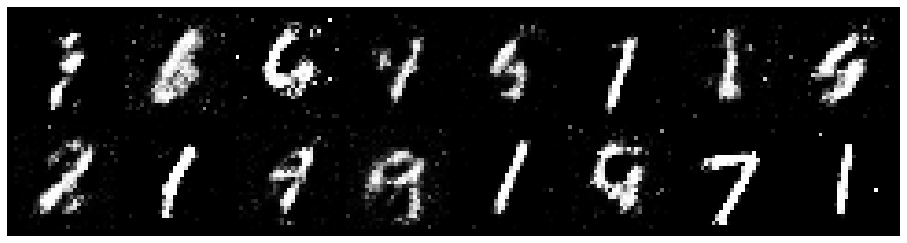

Epoch: [43/50], Batch Num: [500/600]
Discriminator Loss: 0.4767, Generator Loss: 1.5833
D(x): 0.8530, D(G(z)): 0.2031


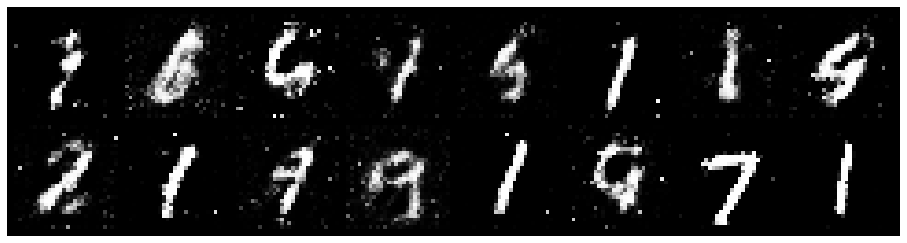

Epoch: [44/50], Batch Num: [0/600]
Discriminator Loss: 0.8206, Generator Loss: 1.9599
D(x): 0.7214, D(G(z)): 0.1671


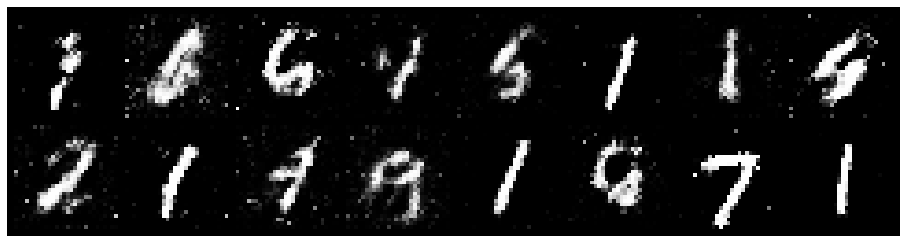

Epoch: [44/50], Batch Num: [100/600]
Discriminator Loss: 0.7947, Generator Loss: 2.1835
D(x): 0.7860, D(G(z)): 0.3110


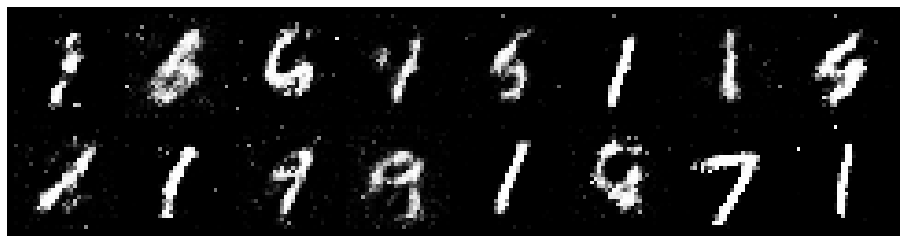

Epoch: [44/50], Batch Num: [200/600]
Discriminator Loss: 0.6999, Generator Loss: 2.3751
D(x): 0.9364, D(G(z)): 0.3768


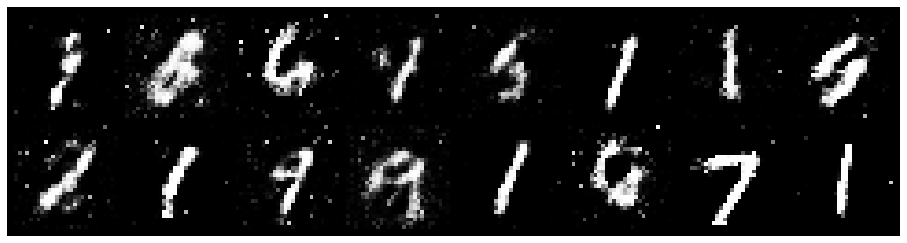

Epoch: [44/50], Batch Num: [300/600]
Discriminator Loss: 0.8632, Generator Loss: 2.4764
D(x): 0.7471, D(G(z)): 0.2518


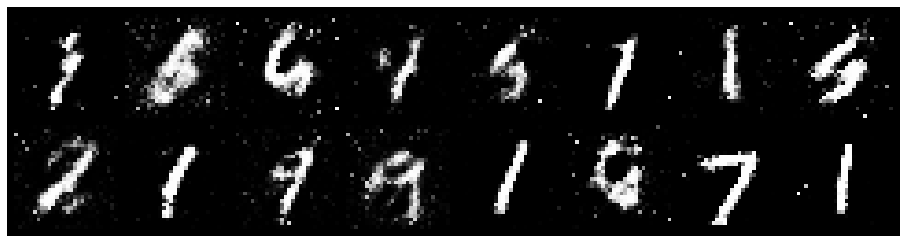

Epoch: [44/50], Batch Num: [400/600]
Discriminator Loss: 0.9881, Generator Loss: 1.8873
D(x): 0.6576, D(G(z)): 0.1114


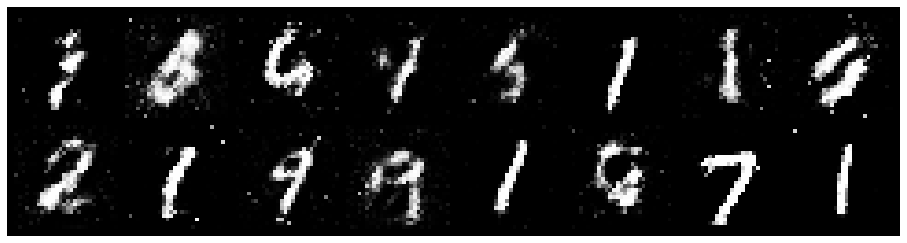

Epoch: [44/50], Batch Num: [500/600]
Discriminator Loss: 0.8046, Generator Loss: 1.6799
D(x): 0.8690, D(G(z)): 0.3526


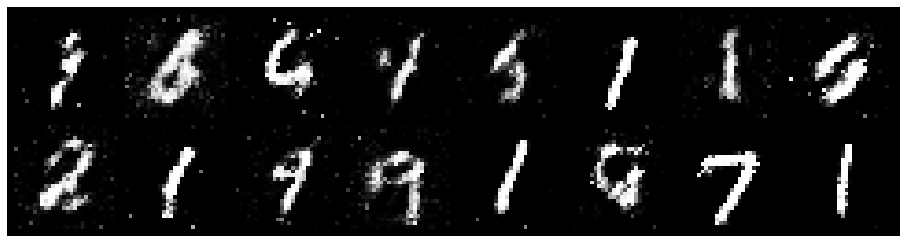

Epoch: [45/50], Batch Num: [0/600]
Discriminator Loss: 0.5890, Generator Loss: 2.1558
D(x): 0.8346, D(G(z)): 0.2551


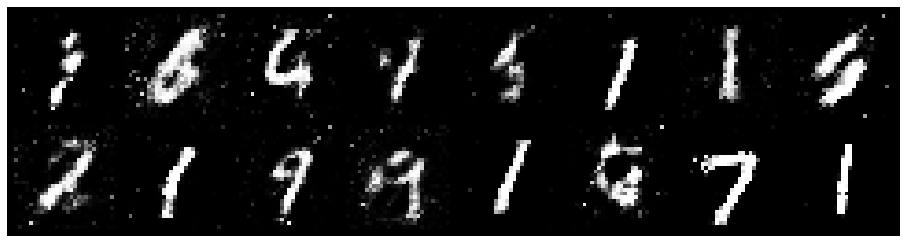

Epoch: [45/50], Batch Num: [100/600]
Discriminator Loss: 0.7383, Generator Loss: 2.2694
D(x): 0.8327, D(G(z)): 0.2744


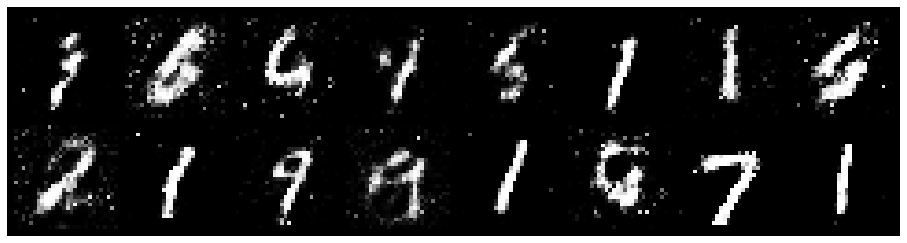

Epoch: [45/50], Batch Num: [200/600]
Discriminator Loss: 0.5732, Generator Loss: 2.7466
D(x): 0.8555, D(G(z)): 0.2210


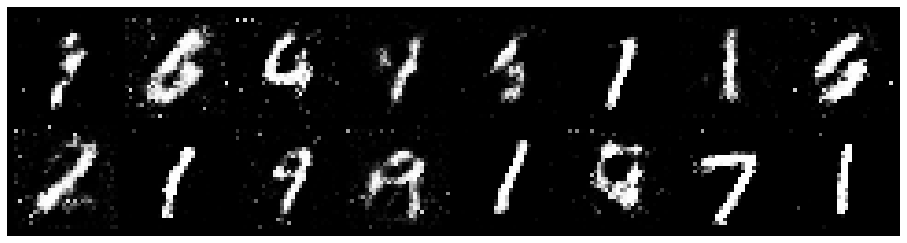

Epoch: [45/50], Batch Num: [300/600]
Discriminator Loss: 0.5313, Generator Loss: 2.9335
D(x): 0.7913, D(G(z)): 0.1355


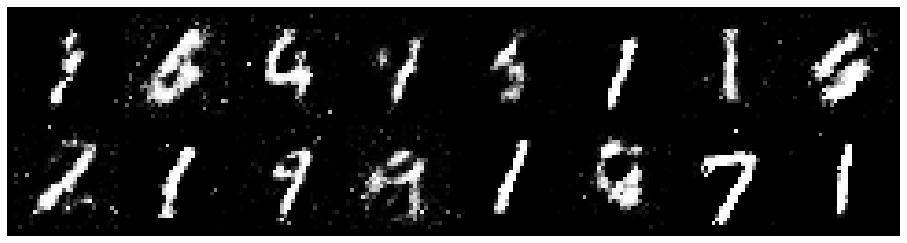

Epoch: [45/50], Batch Num: [400/600]
Discriminator Loss: 0.8741, Generator Loss: 3.1910
D(x): 0.8341, D(G(z)): 0.3005


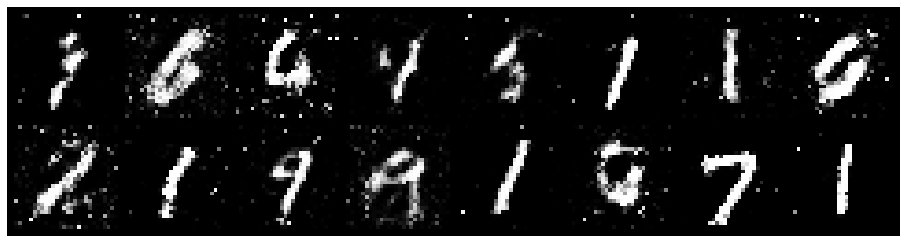

Epoch: [45/50], Batch Num: [500/600]
Discriminator Loss: 0.7188, Generator Loss: 2.0385
D(x): 0.8010, D(G(z)): 0.2643


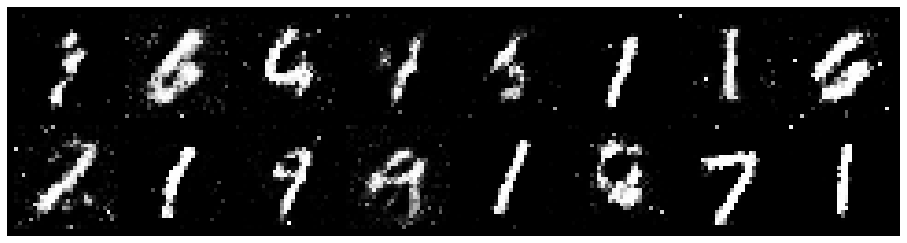

Epoch: [46/50], Batch Num: [0/600]
Discriminator Loss: 0.5108, Generator Loss: 2.1550
D(x): 0.8049, D(G(z)): 0.1323


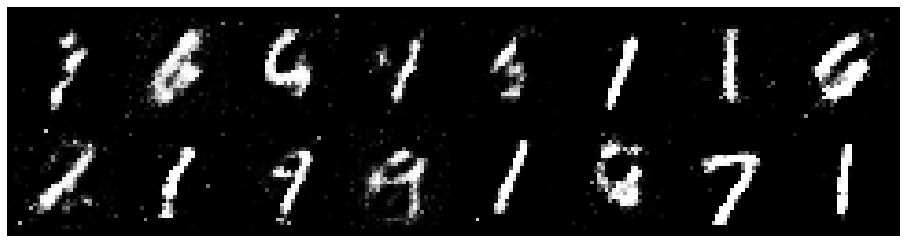

Epoch: [46/50], Batch Num: [100/600]
Discriminator Loss: 0.6058, Generator Loss: 2.2324
D(x): 0.7982, D(G(z)): 0.1529


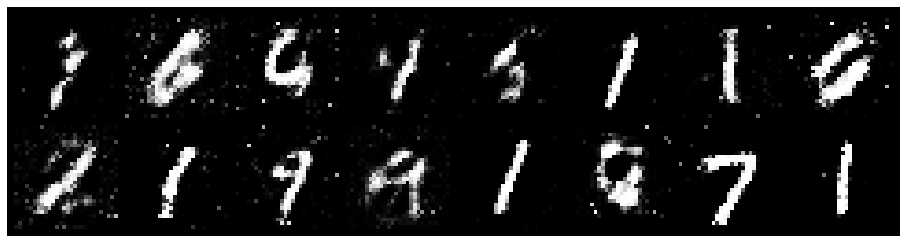

Epoch: [46/50], Batch Num: [200/600]
Discriminator Loss: 0.9003, Generator Loss: 1.5056
D(x): 0.7265, D(G(z)): 0.2884


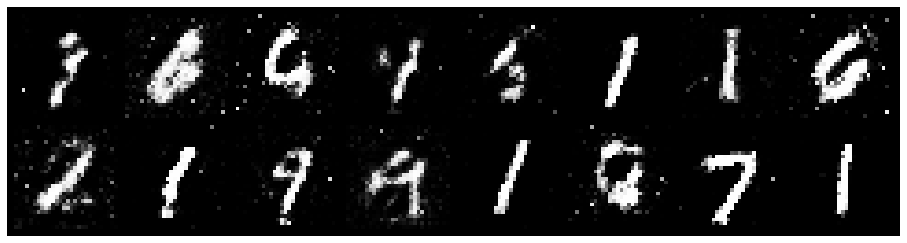

Epoch: [46/50], Batch Num: [300/600]
Discriminator Loss: 0.7553, Generator Loss: 2.3861
D(x): 0.8167, D(G(z)): 0.2863


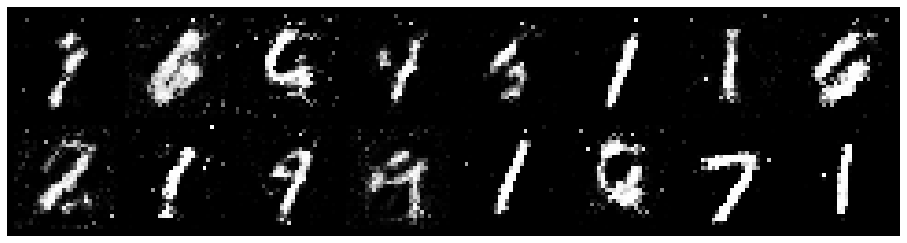

Epoch: [46/50], Batch Num: [400/600]
Discriminator Loss: 0.5826, Generator Loss: 2.2903
D(x): 0.8176, D(G(z)): 0.2086


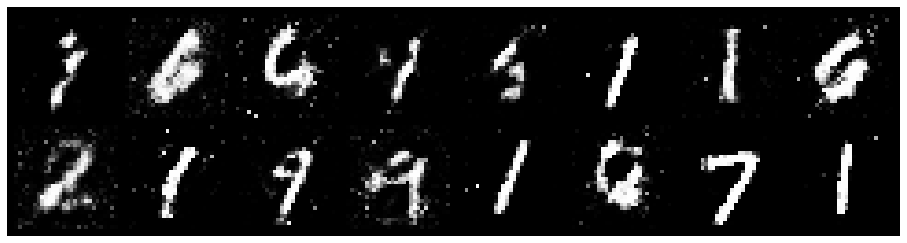

Epoch: [46/50], Batch Num: [500/600]
Discriminator Loss: 0.6029, Generator Loss: 2.8084
D(x): 0.8247, D(G(z)): 0.2090


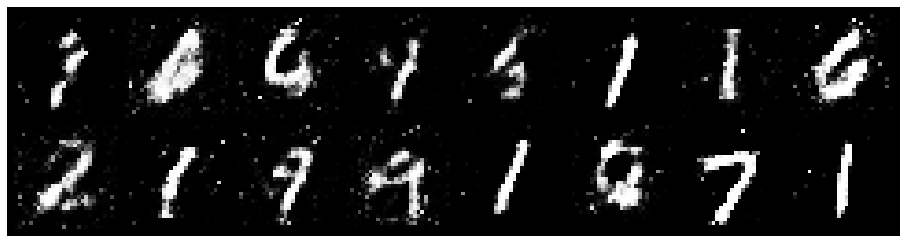

Epoch: [47/50], Batch Num: [0/600]
Discriminator Loss: 0.6551, Generator Loss: 2.2714
D(x): 0.9211, D(G(z)): 0.3300


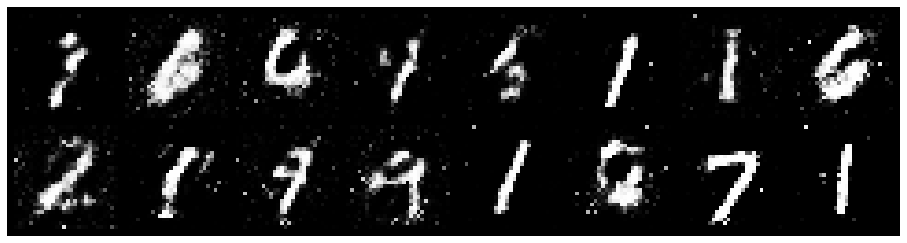

Epoch: [47/50], Batch Num: [100/600]
Discriminator Loss: 0.8923, Generator Loss: 1.2559
D(x): 0.7412, D(G(z)): 0.2732


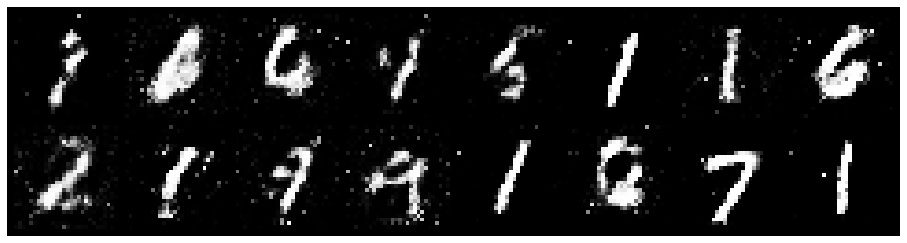

Epoch: [47/50], Batch Num: [200/600]
Discriminator Loss: 0.7400, Generator Loss: 1.6108
D(x): 0.7613, D(G(z)): 0.2413


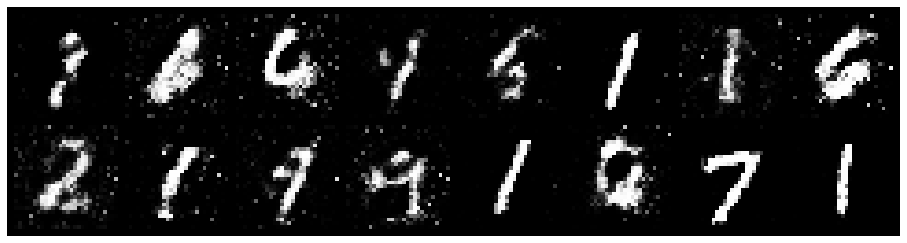

Epoch: [47/50], Batch Num: [300/600]
Discriminator Loss: 0.5832, Generator Loss: 1.8179
D(x): 0.8707, D(G(z)): 0.2645


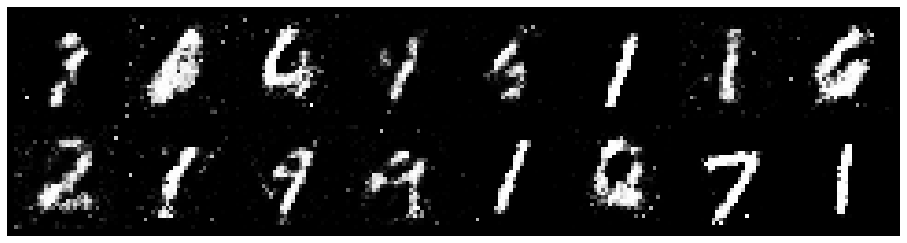

Epoch: [47/50], Batch Num: [400/600]
Discriminator Loss: 1.0096, Generator Loss: 2.0093
D(x): 0.7077, D(G(z)): 0.2805


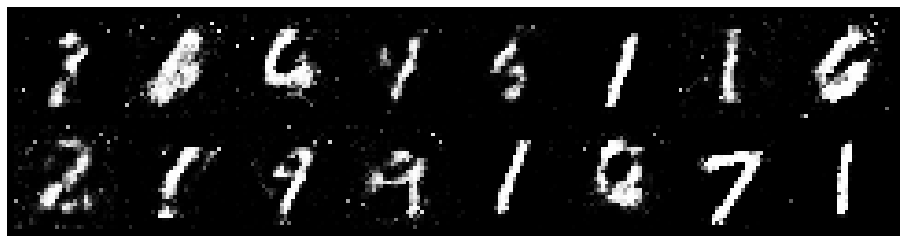

Epoch: [47/50], Batch Num: [500/600]
Discriminator Loss: 0.7879, Generator Loss: 1.4403
D(x): 0.7672, D(G(z)): 0.3013


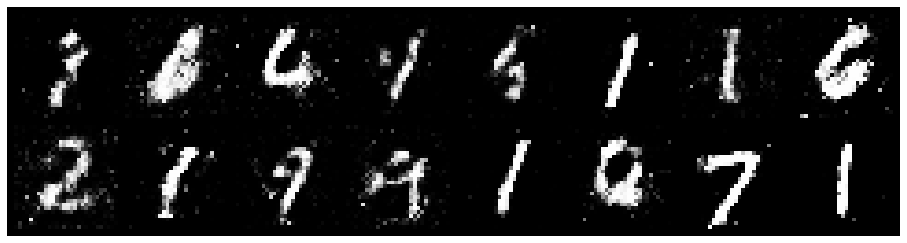

Epoch: [48/50], Batch Num: [0/600]
Discriminator Loss: 0.6344, Generator Loss: 2.4599
D(x): 0.7572, D(G(z)): 0.1301


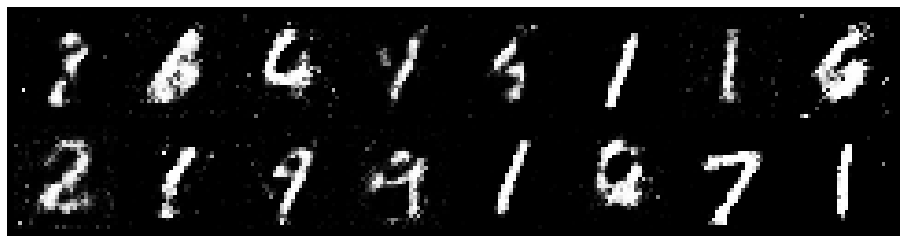

Epoch: [48/50], Batch Num: [100/600]
Discriminator Loss: 0.6881, Generator Loss: 1.8991
D(x): 0.8257, D(G(z)): 0.2940


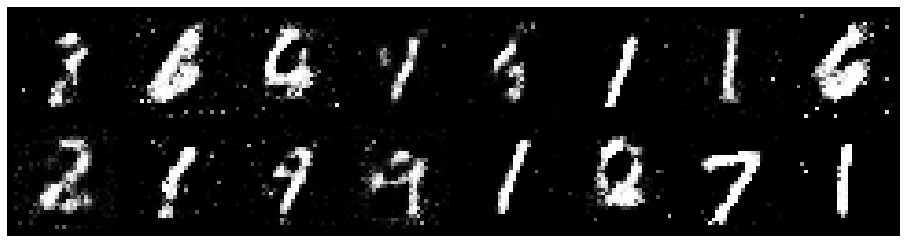

Epoch: [48/50], Batch Num: [200/600]
Discriminator Loss: 0.3994, Generator Loss: 3.1120
D(x): 0.8455, D(G(z)): 0.1380


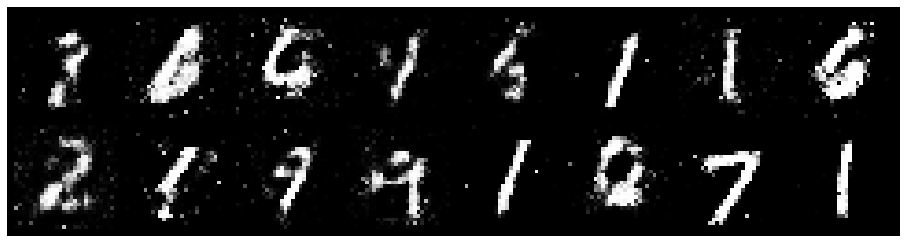

Epoch: [48/50], Batch Num: [300/600]
Discriminator Loss: 0.7606, Generator Loss: 1.8340
D(x): 0.7694, D(G(z)): 0.2483


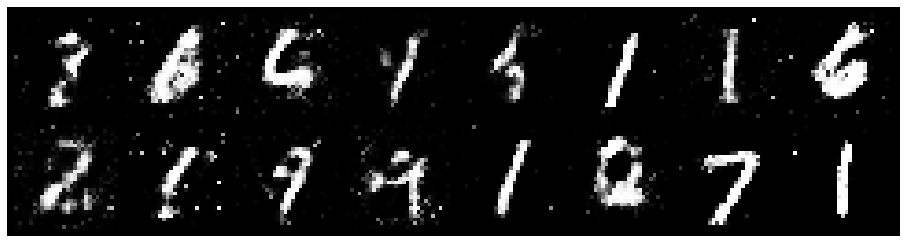

Epoch: [48/50], Batch Num: [400/600]
Discriminator Loss: 0.8504, Generator Loss: 1.8322
D(x): 0.6917, D(G(z)): 0.1921


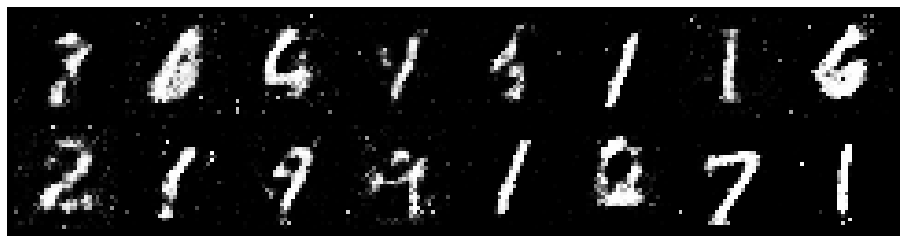

Epoch: [48/50], Batch Num: [500/600]
Discriminator Loss: 0.6702, Generator Loss: 1.7517
D(x): 0.8778, D(G(z)): 0.3367


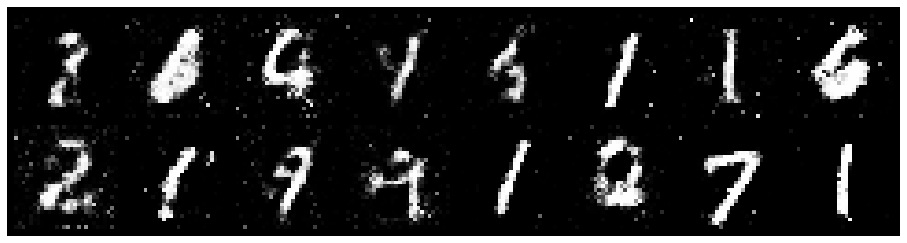

Epoch: [49/50], Batch Num: [0/600]
Discriminator Loss: 0.8538, Generator Loss: 2.1721
D(x): 0.7168, D(G(z)): 0.1749


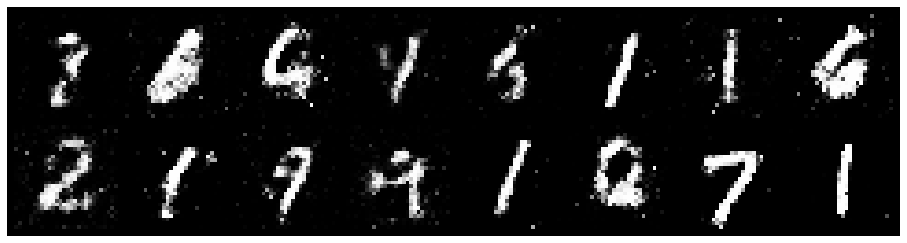

Epoch: [49/50], Batch Num: [100/600]
Discriminator Loss: 0.5623, Generator Loss: 1.5564
D(x): 0.8079, D(G(z)): 0.2052


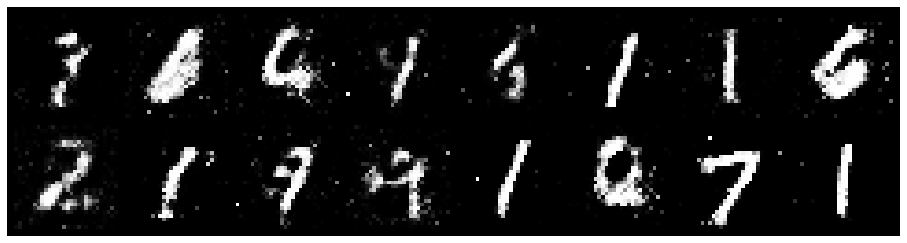

Epoch: [49/50], Batch Num: [200/600]
Discriminator Loss: 0.6766, Generator Loss: 2.0431
D(x): 0.7955, D(G(z)): 0.2296


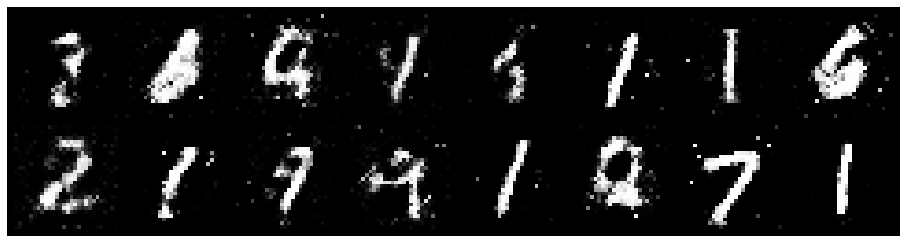

Epoch: [49/50], Batch Num: [300/600]
Discriminator Loss: 0.5227, Generator Loss: 2.3243
D(x): 0.8123, D(G(z)): 0.1784


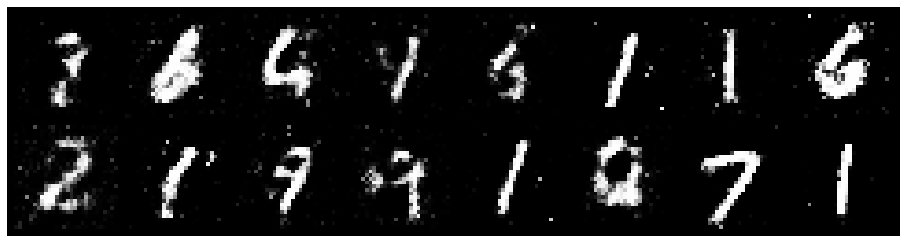

Epoch: [49/50], Batch Num: [400/600]
Discriminator Loss: 1.0612, Generator Loss: 2.0100
D(x): 0.6604, D(G(z)): 0.1120


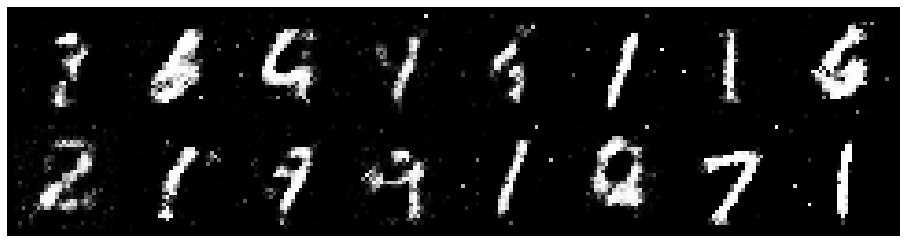

Epoch: [49/50], Batch Num: [500/600]
Discriminator Loss: 0.6925, Generator Loss: 1.7353
D(x): 0.7421, D(G(z)): 0.2030


In [66]:
# Create logger instance
logger = Logger(model_name='Vannila_GAN', data_name='MNIST')# Total number of epochs to train

num_epochs = 50

for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)        # 1. Train Discriminator
        #print(N)
        real_sample = Variable(images_to_vectors(real_batch))        
        
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        G_sample = G(get_latent_sample(N)).detach()        
        
        # Train D
        d_loss, d_real_score, d_fake_score = train_D(D_optimizer, real_sample, G_sample)

        # 2. Train Generator        
        # Generate fake data
        G_sample = G(get_latent_sample(N))        
        
        # Train G
        g_loss = train_G(G_optimizer, G_sample)
        
        # Log batch error
        logger.log(d_loss, g_loss, epoch, n_batch, num_batches)        
        
        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(G(test_noise))
            test_images = test_images.data            
            
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_loss, g_loss, d_real_score, d_fake_score
            )

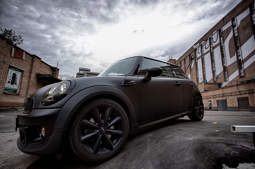

In [50]:
import torch as t
from torchvision.transforms import ToPILImage
from IPython.display import Image
to_img = ToPILImage()

# display tensor
a = t.Tensor(3, 64, 64).normal_()
to_img(a)

# display imagefile
Image('ondemand/sr_data/train_LR/DIV2K_train_LR_x8/0100x8.png')

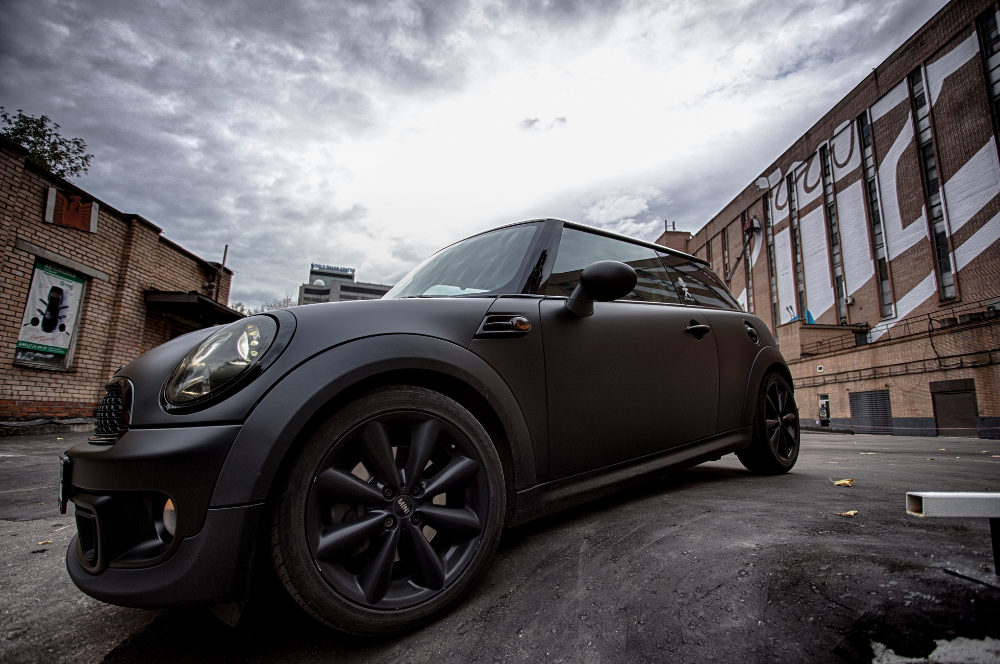

In [51]:
Image('ondemand/sr_data/train_HR/DIV2K_train_HR/0100.png')

This tutorial has been designed with help from the following websites:

a) https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

b) https://medium.com/ai-society/gans-from-scratch-1-a-deep-introduction-with-code-in-pytorch-and-tensorflow-cb03cdcdba0f